In [1]:
!pip install xgboost

   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.3/124.9 MB ? eta -:--:--
   - -------------------------------------- 4.5/124.9 MB 16.8 MB/s eta 0:00:08
   -- ------------------------------------- 7.9/124.9 MB 25.6 MB/s eta 0:00:05
   --- ------------------------------------ 12.1/124.9 MB 16.8 MB/s eta 0:00:07
   ----- ---------------------------------- 15.7/124.9 MB 17.1 MB/s eta 0:00:07
   ----- ---------------------------------- 17.6/124.9 MB 15.2 MB/s eta 0:00:08
   ------ --------------------------------- 20.2/124.9 MB 15.2 MB/s eta 0:00:07
   ------- -------------------------------- 22.3/124.9 MB 14.2 MB/s eta 0:00:08
   ------- -------------------------------- 24.4/124.9 MB 13.8 MB/s eta 0:00:08
   -------- ------------------------------- 28.0/124.9 MB 14.3 MB/s eta 0:00:07
   --------- ------------------------------ 30.7/124.9 MB 13.8 MB/s eta 0:00:07
   ---------- ----------------------------- 33.3/124.9 MB 13

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, root_mean_squared_error
from itertools import product
import time

In [2]:
df = pd.read_csv('BER Eq sales data full-date.csv')

## EDA

In [3]:
df

,InvoiceDate,InventoryWarehouseId,ProductNumber,ProductName,Sum of InvoicedQuantity,PrimaryVendorAccountNumber
0,01/01/2020,RKSQR,BURBER002,NaN,1,NaN
1,01/01/2020,JDSQR,COKBER001,NaN,1,NaN
2,01/01/2020,KMSQR,COKBER001,NaN,1,NaN
3,01/01/2020,MDSQR,COKBER001,NaN,1,NaN
4,01/01/2020,DMSQR,FRYBER002,NaN,2,NaN
...,...,...,...,...,...,...
7560,31/12/2024,DMSQR,GRLBER009,NaN,1,NaN
7561,31/12/2024,MDSQR,GRLBER020,NaN,1,NaN
7562,31/12/2024,QSSQR,OVEBER002,NaN,1,NaN
7563,31/12/2024,RDSQR,OVEBER011,NaN,1,NaN


In [4]:
df['ProductNumber'].nunique()

61

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7565 entries, 0 to 7564
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   InvoiceDate                 7565 non-null   object
 1   InventoryWarehouseId        7565 non-null   object
 2   ProductNumber               7565 non-null   object
 3   ProductName                 2219 non-null   object
 4   Sum of InvoicedQuantity     7565 non-null   int64 
 5   PrimaryVendorAccountNumber  2219 non-null   object
dtypes: int64(1), object(5)
memory usage: 354.7+ KB


## Data pre-processing

In [6]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], dayfirst=True)

In [7]:
df = df.drop(columns= ['PrimaryVendorAccountNumber', 'ProductName'], axis= True)

In [8]:
df.head()

,InvoiceDate,InventoryWarehouseId,ProductNumber,Sum of InvoicedQuantity
0,2020-01-01,RKSQR,BURBER002,1
1,2020-01-01,JDSQR,COKBER001,1
2,2020-01-01,KMSQR,COKBER001,1
3,2020-01-01,MDSQR,COKBER001,1
4,2020-01-01,DMSQR,FRYBER002,2


In [9]:
df['InventoryWarehouseId_dup'] = df['InventoryWarehouseId']
df['ProductNumber_dup'] = df['ProductNumber']

In [10]:
df

,InvoiceDate,InventoryWarehouseId,ProductNumber,Sum of InvoicedQuantity,InventoryWarehouseId_dup,ProductNumber_dup
0,2020-01-01,RKSQR,BURBER002,1,RKSQR,BURBER002
1,2020-01-01,JDSQR,COKBER001,1,JDSQR,COKBER001
2,2020-01-01,KMSQR,COKBER001,1,KMSQR,COKBER001
3,2020-01-01,MDSQR,COKBER001,1,MDSQR,COKBER001
4,2020-01-01,DMSQR,FRYBER002,2,DMSQR,FRYBER002
...,...,...,...,...,...,...
7560,2024-12-31,DMSQR,GRLBER009,1,DMSQR,GRLBER009
7561,2024-12-31,MDSQR,GRLBER020,1,MDSQR,GRLBER020
7562,2024-12-31,QSSQR,OVEBER002,1,QSSQR,OVEBER002
7563,2024-12-31,RDSQR,OVEBER011,1,RDSQR,OVEBER011


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7565 entries, 0 to 7564
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   InvoiceDate               7565 non-null   datetime64[ns]
 1   InventoryWarehouseId      7565 non-null   object        
 2   ProductNumber             7565 non-null   object        
 3   Sum of InvoicedQuantity   7565 non-null   int64         
 4   InventoryWarehouseId_dup  7565 non-null   object        
 5   ProductNumber_dup         7565 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 354.7+ KB


In [12]:
df.describe()

,InvoiceDate,Sum of InvoicedQuantity
count,7565,7565.000000
mean,2022-04-22 06:40:29.821546496,1.099802
min,2020-01-01 00:00:00,-10.000000
25%,2021-03-16 00:00:00,1.000000
50%,2022-04-05 00:00:00,1.000000
75%,2023-04-27 00:00:00,1.000000
max,2024-12-31 00:00:00,33.000000
std,NaN,1.138229


In [17]:
raw_data_group = df.groupby(['ProductNumber', 'InvoiceDate'], as_index=False)['Sum of InvoicedQuantity'].sum()
raw_data_group

,ProductNumber,InvoiceDate,Sum of InvoicedQuantity
0,BOLBER001,2020-01-07,2
1,BOLBER001,2020-01-30,3
2,BOLBER001,2020-02-10,1
3,BOLBER001,2020-02-22,-1
4,BOLBER001,2020-03-02,10
...,...,...,...
6375,WARBER024,2023-02-25,1
6376,WARBER024,2023-02-28,1
6377,WARBER024,2023-03-06,1
6378,WARBER024,2024-02-07,1


Raw data historical demand for Product: BOLBER001


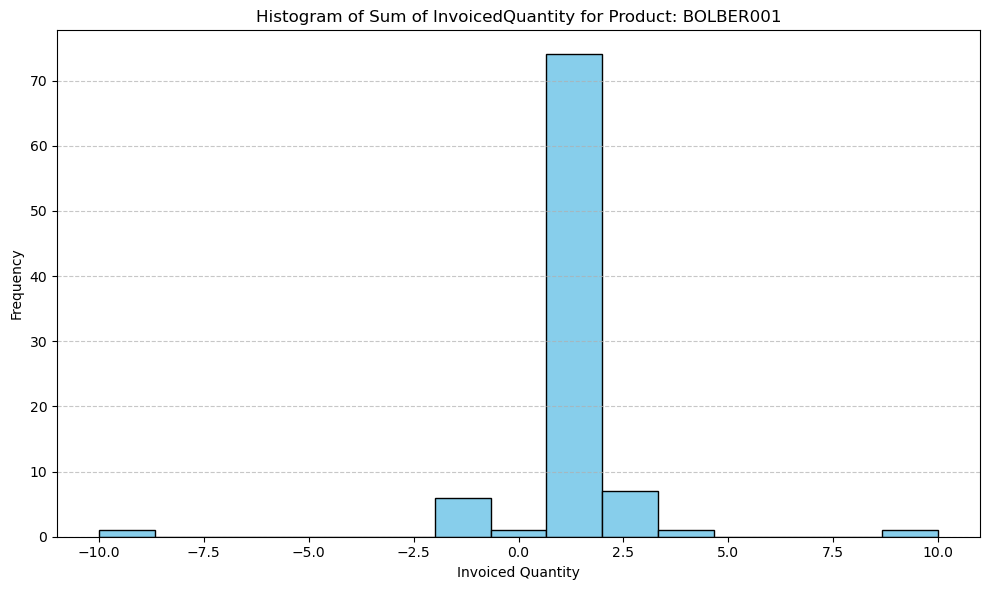

Raw data historical demand for Product: BOLBER002


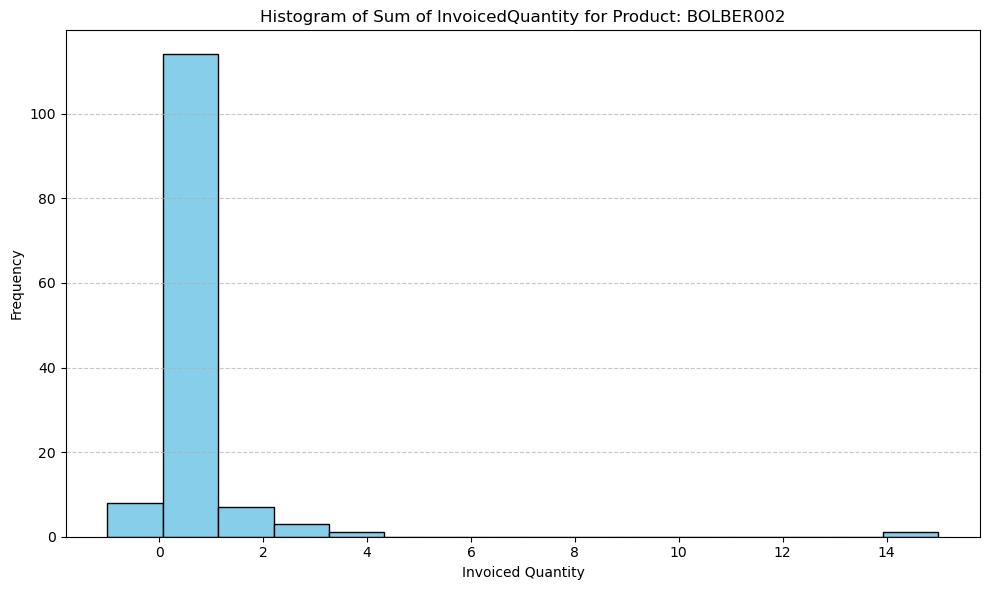

Raw data historical demand for Product: BOLBER003


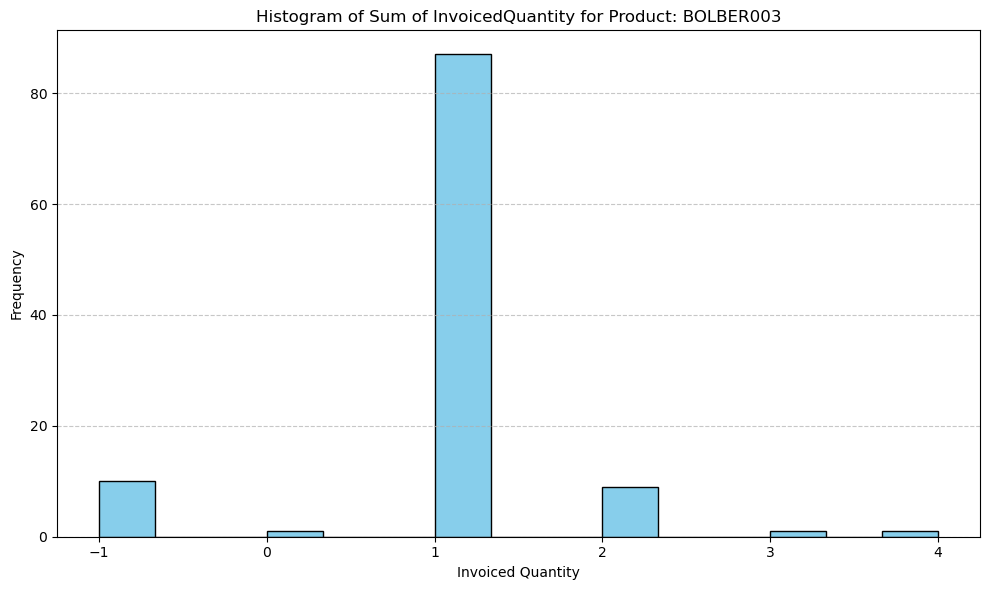

Raw data historical demand for Product: BOLBER005


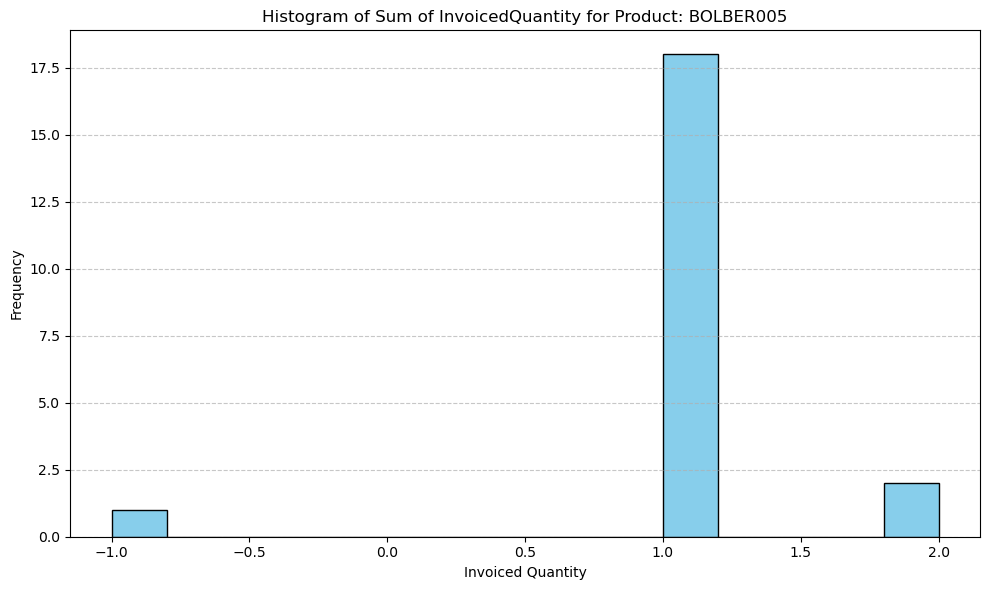

Raw data historical demand for Product: BURBER001


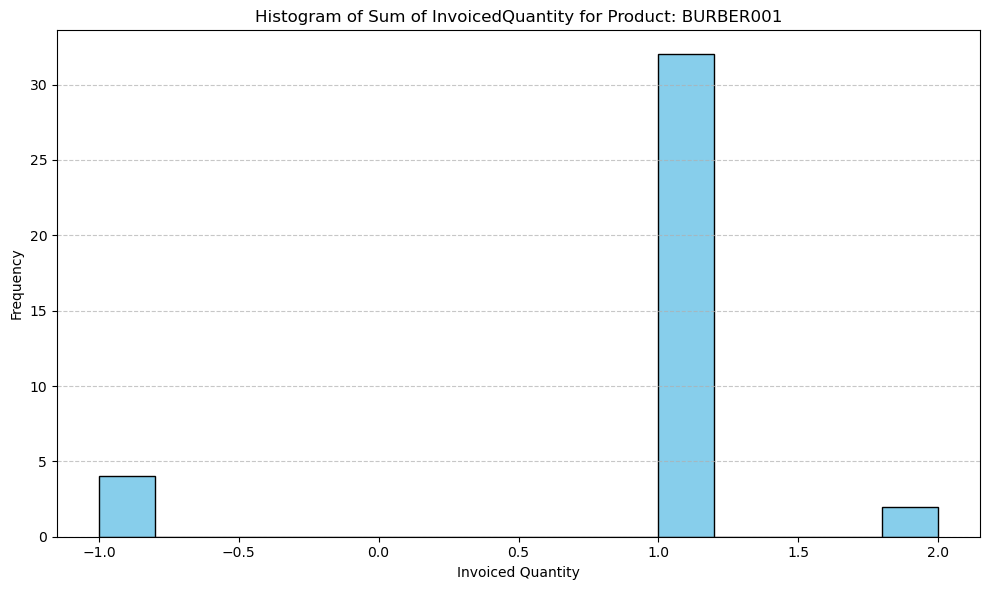

Raw data historical demand for Product: BURBER002


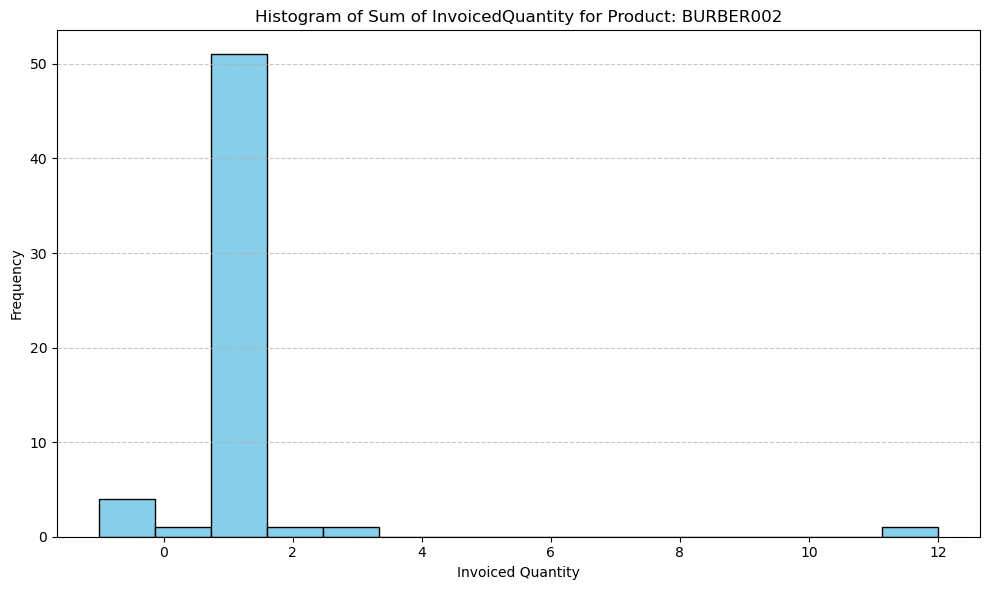

Raw data historical demand for Product: BURBER003


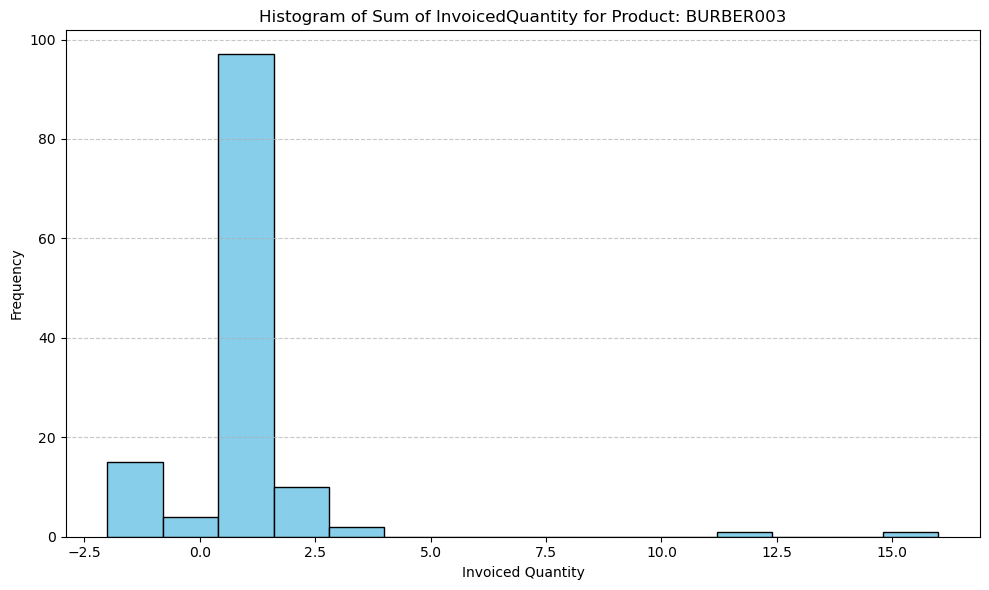

Raw data historical demand for Product: BURBER004


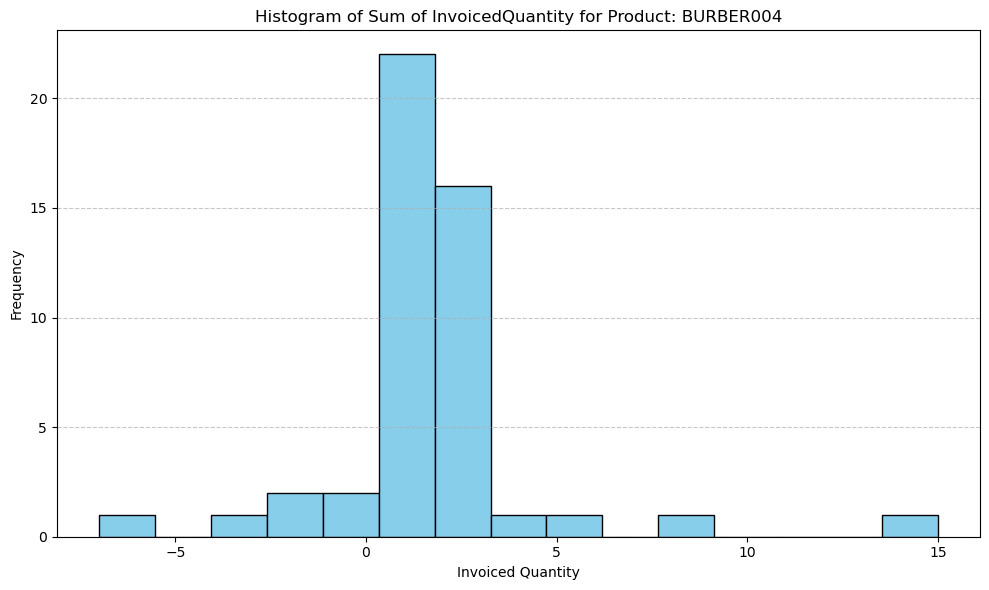

Raw data historical demand for Product: BURBER007


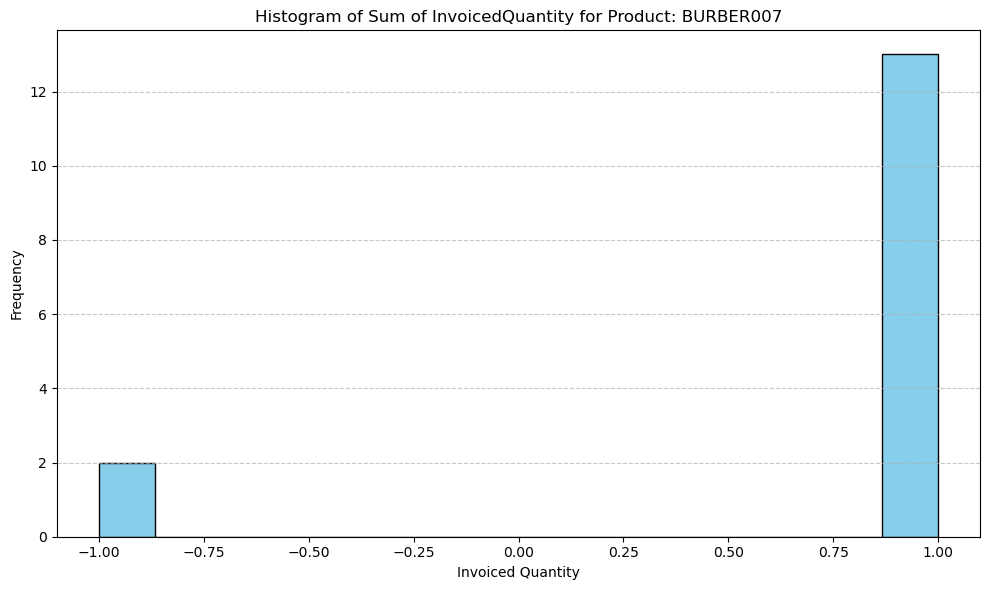

Raw data historical demand for Product: COFBER001


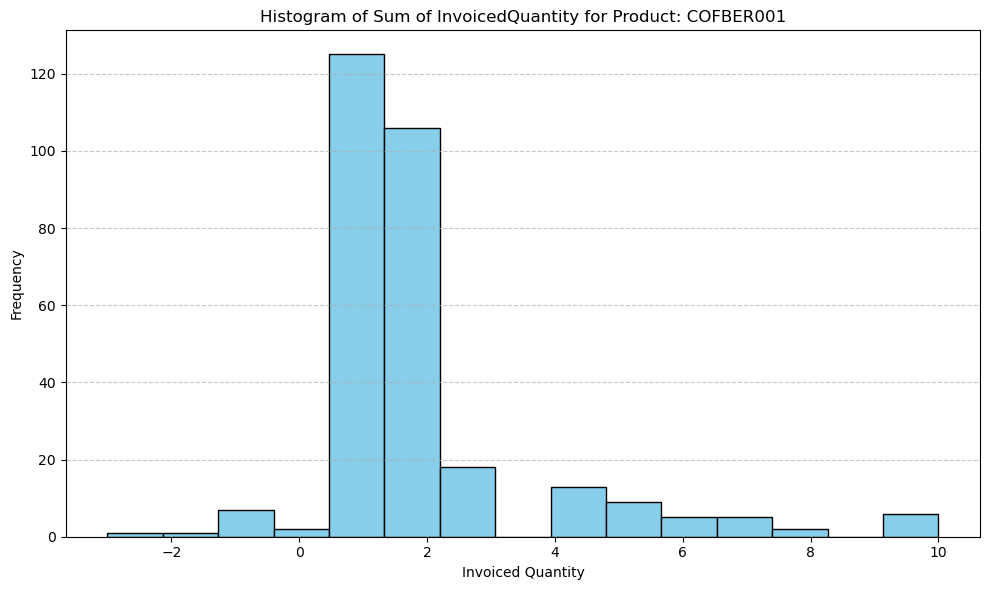

Raw data historical demand for Product: COKBER001


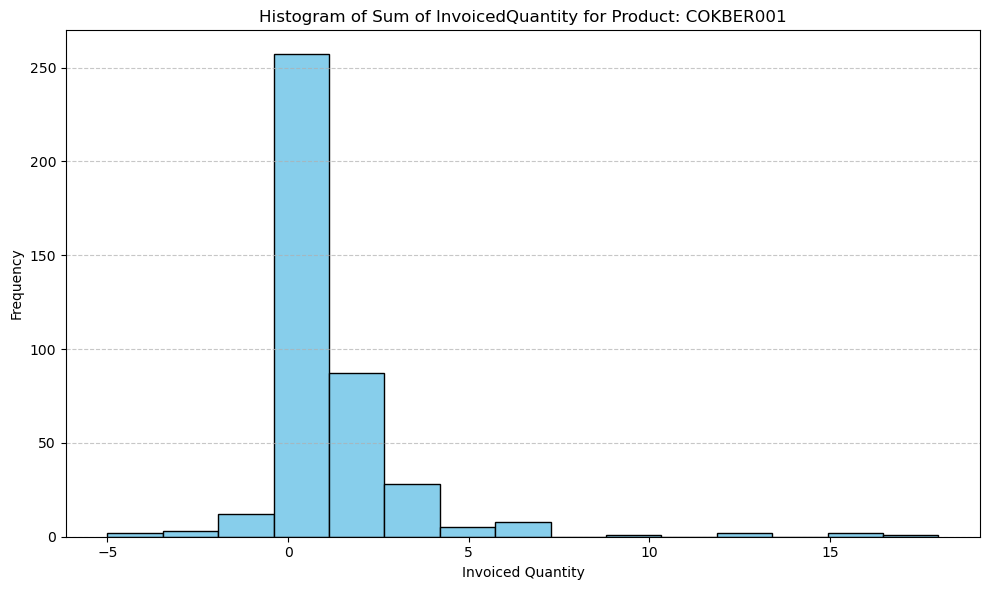

Raw data historical demand for Product: FRYBER002


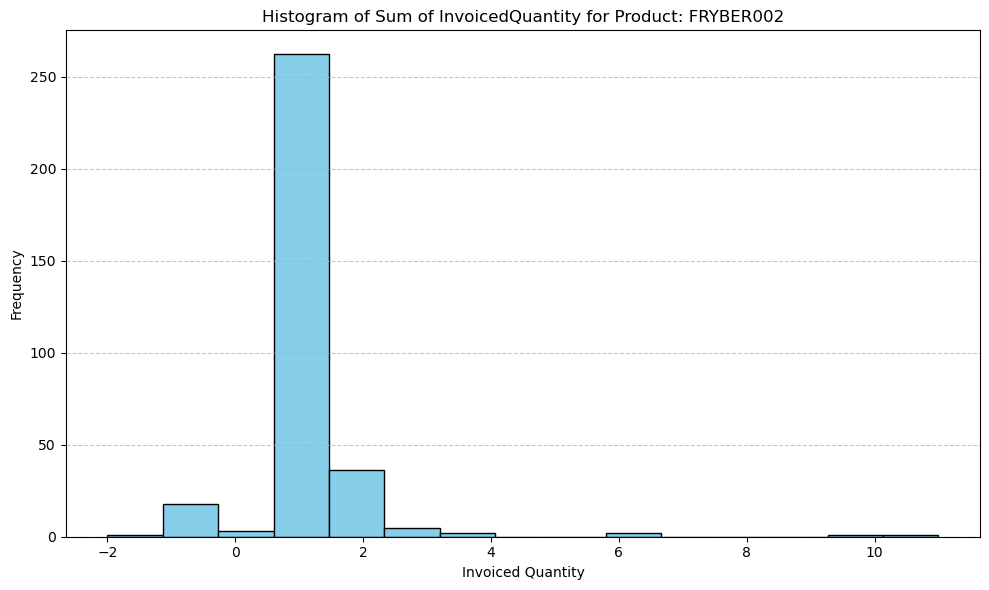

Raw data historical demand for Product: FRYBER003


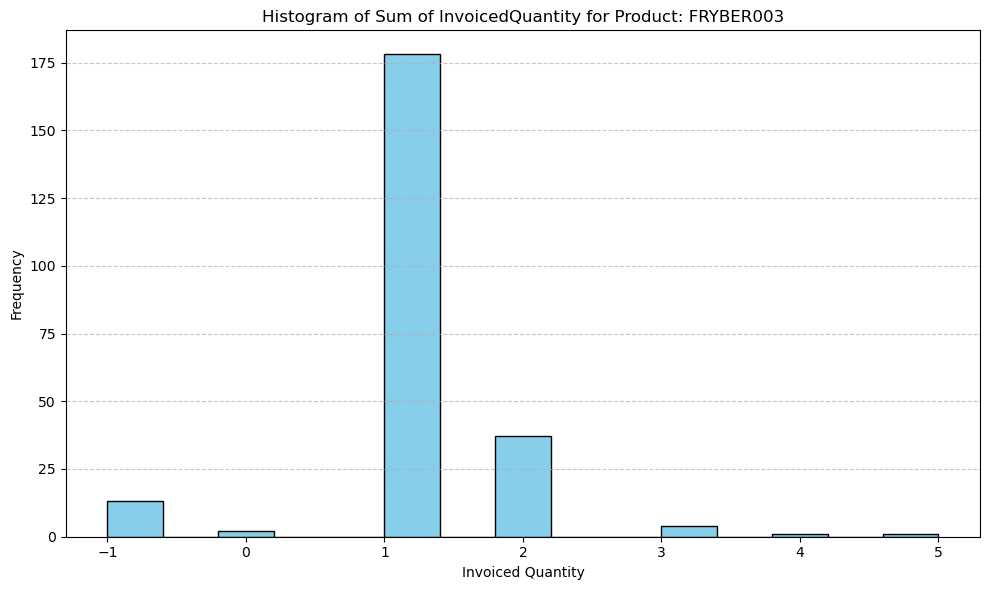

Raw data historical demand for Product: FRYBER005


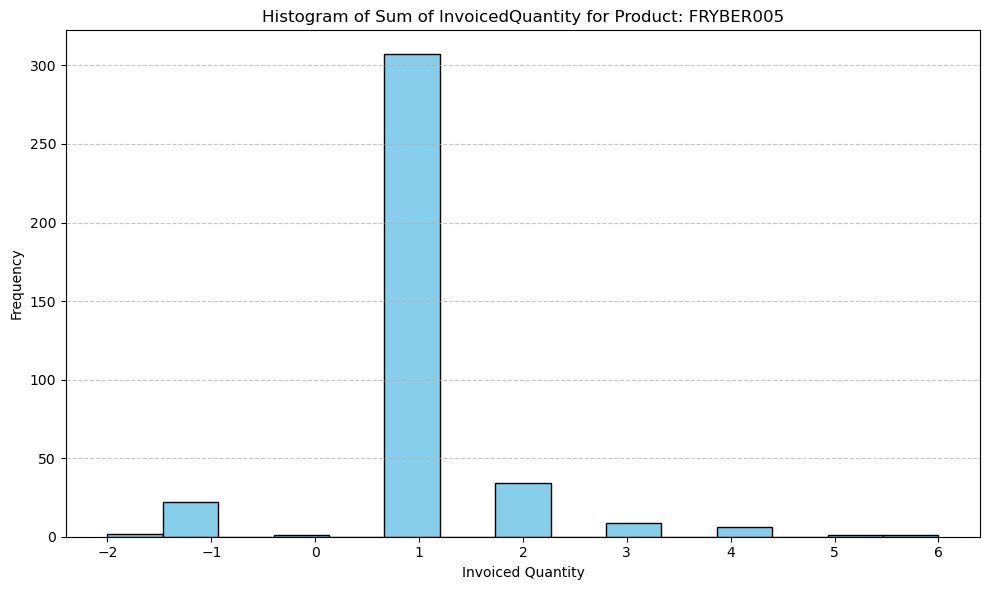

Raw data historical demand for Product: GRLBER003


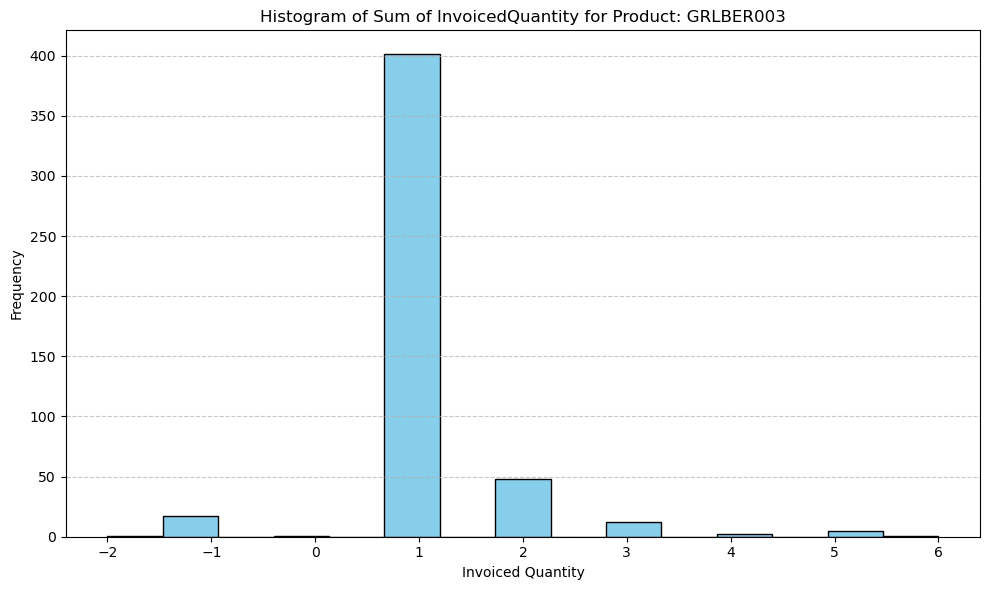

Raw data historical demand for Product: GRLBER004


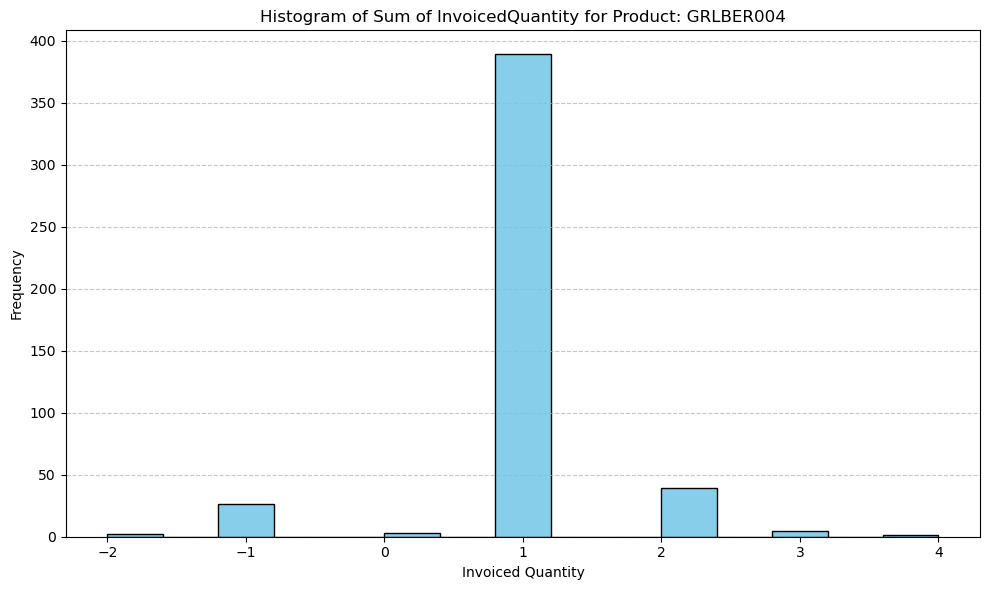

Raw data historical demand for Product: GRLBER009


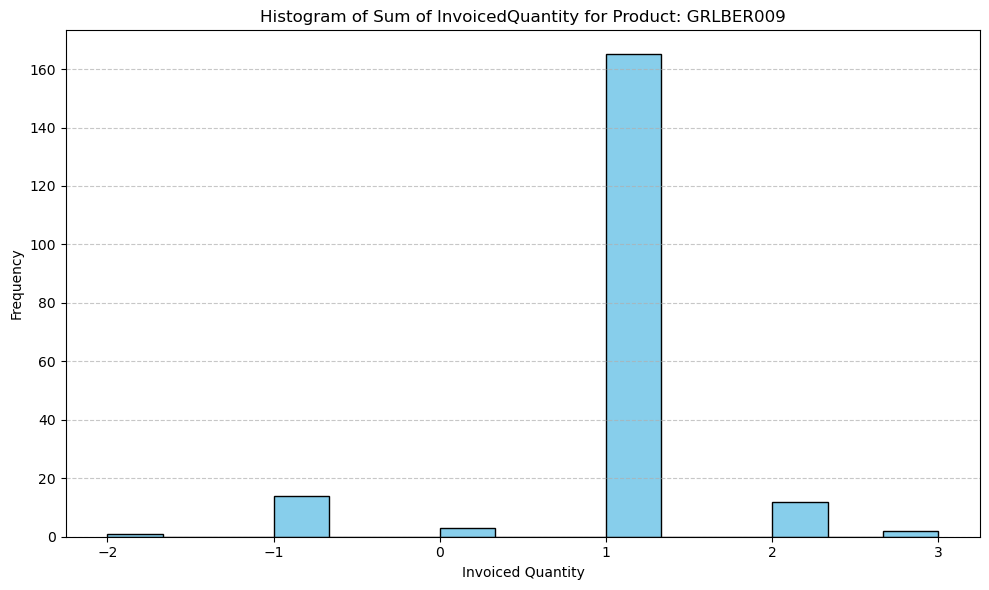

Raw data historical demand for Product: GRLBER010


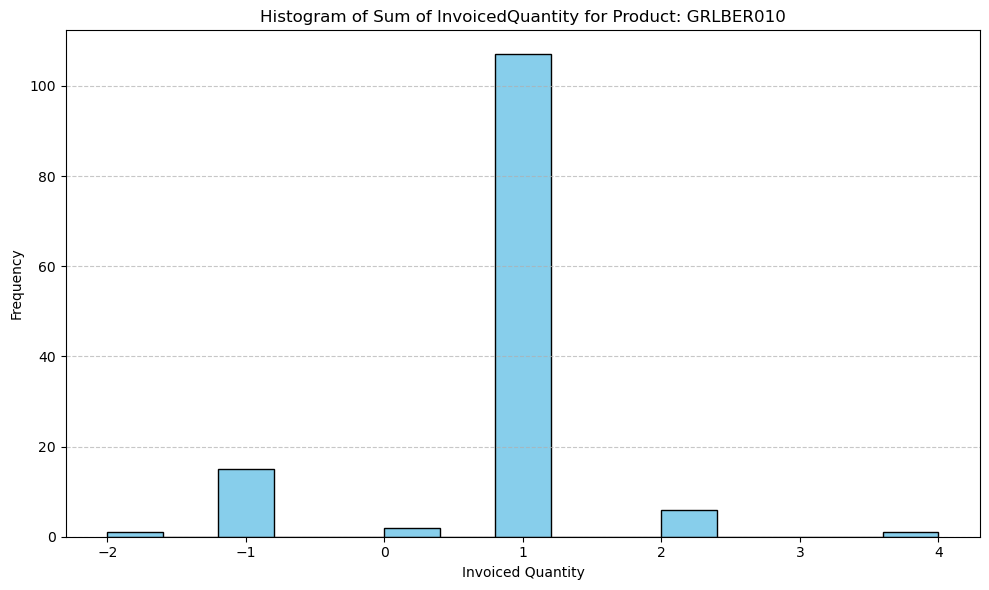

Raw data historical demand for Product: GRLBER011


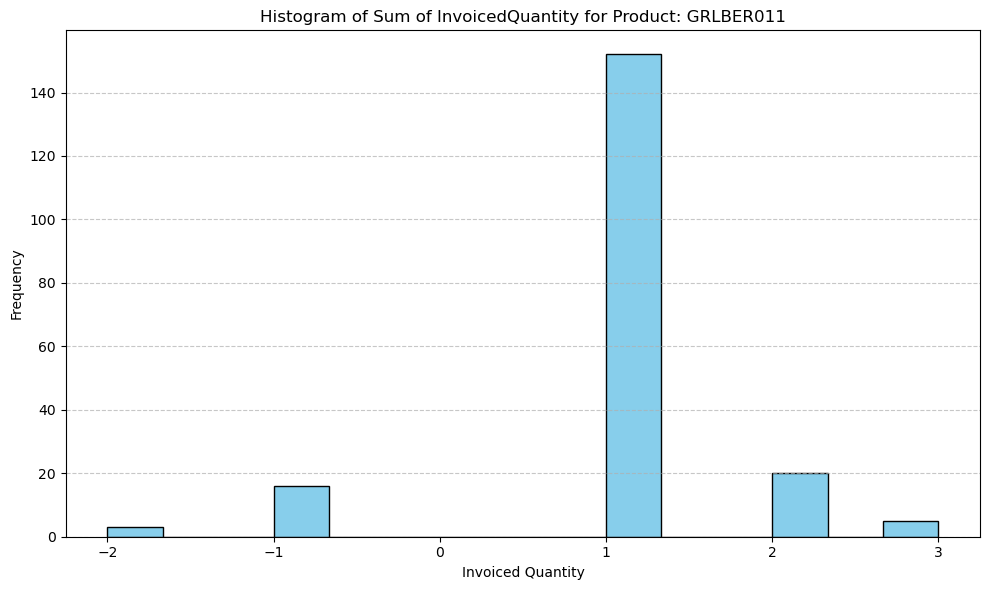

Raw data historical demand for Product: GRLBER012


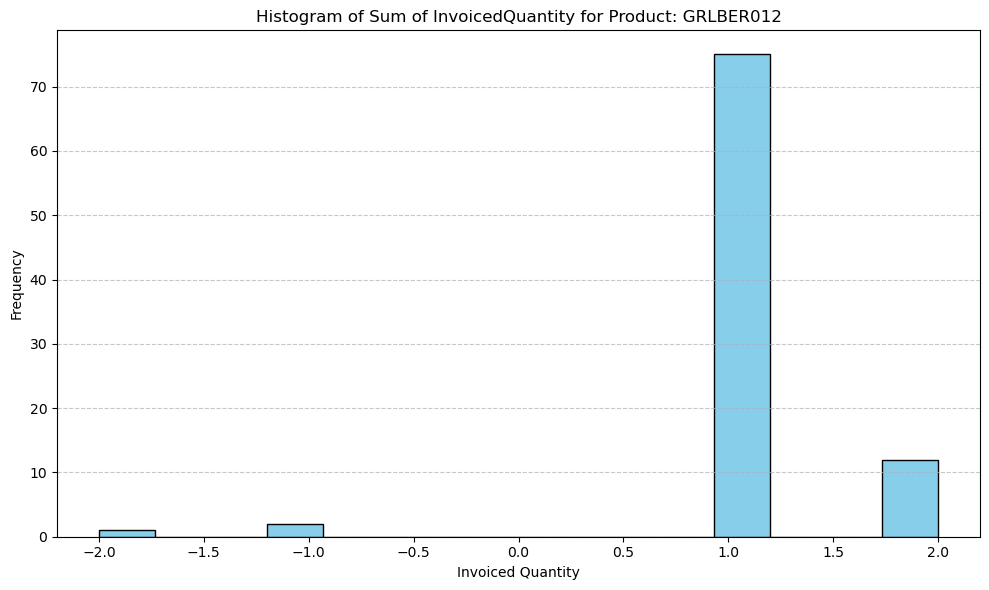

Raw data historical demand for Product: GRLBER015


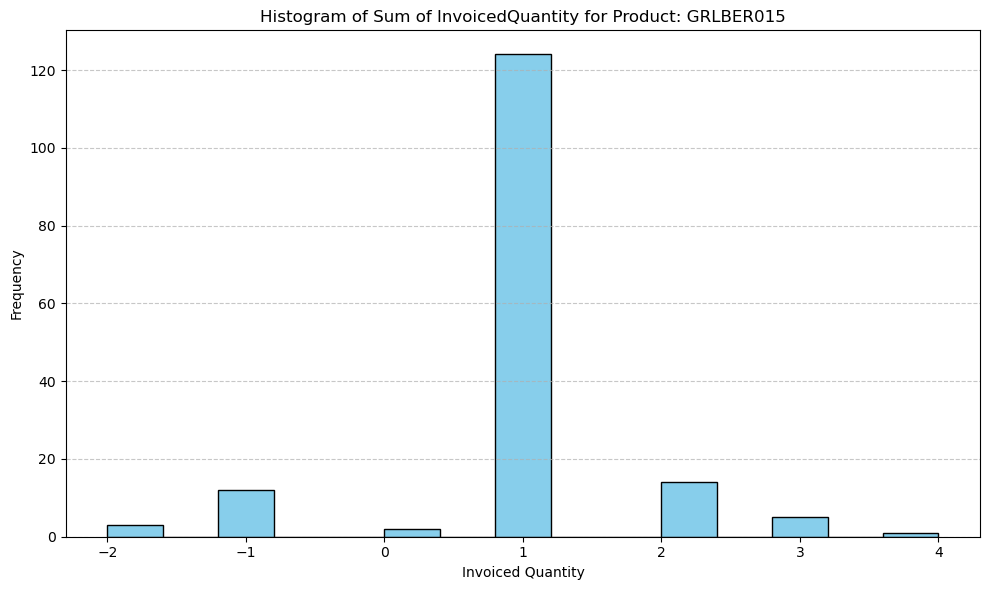

Raw data historical demand for Product: GRLBER019


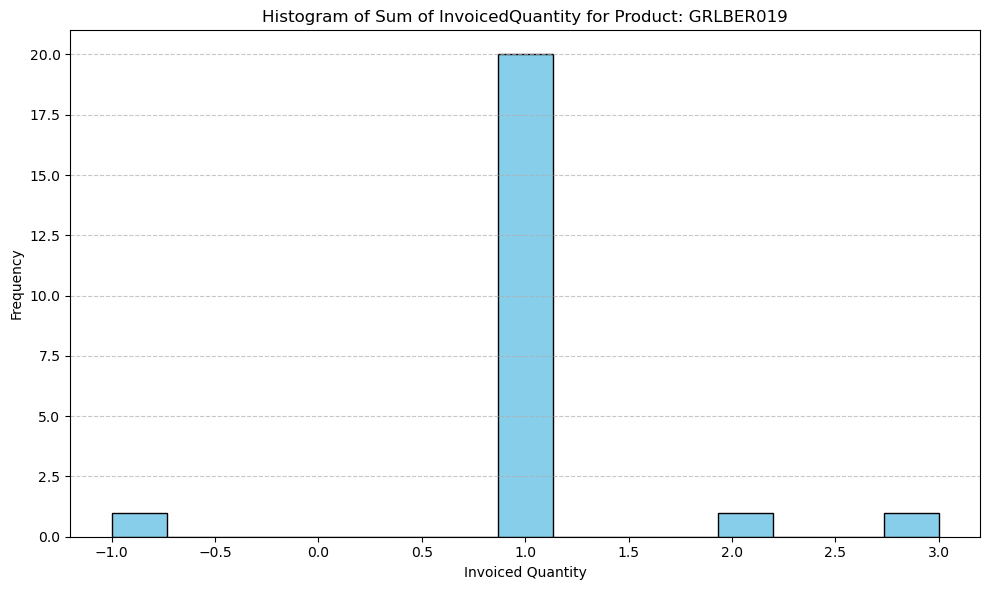

Raw data historical demand for Product: GRLBER020


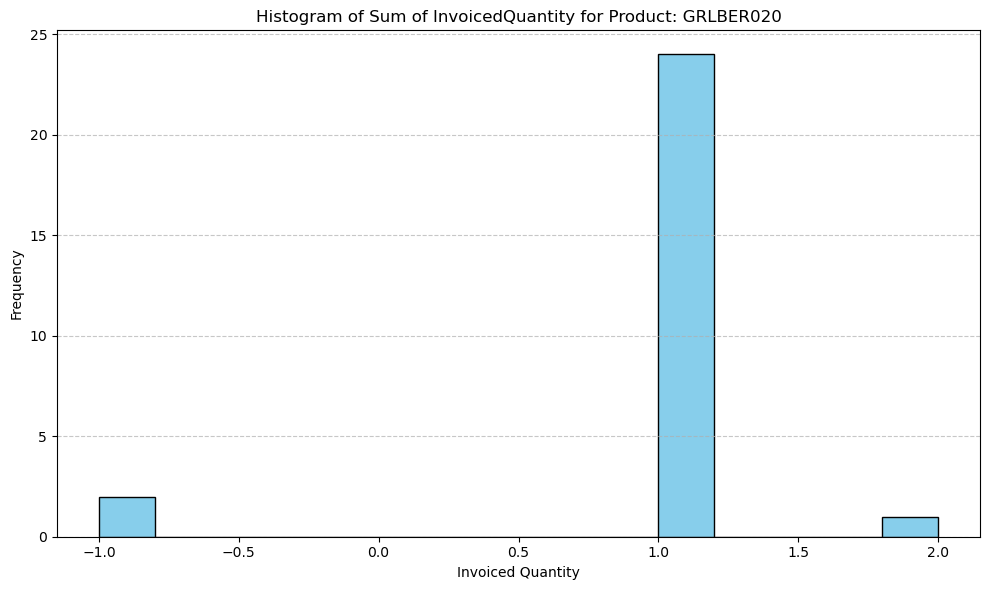

Raw data historical demand for Product: HEABER001


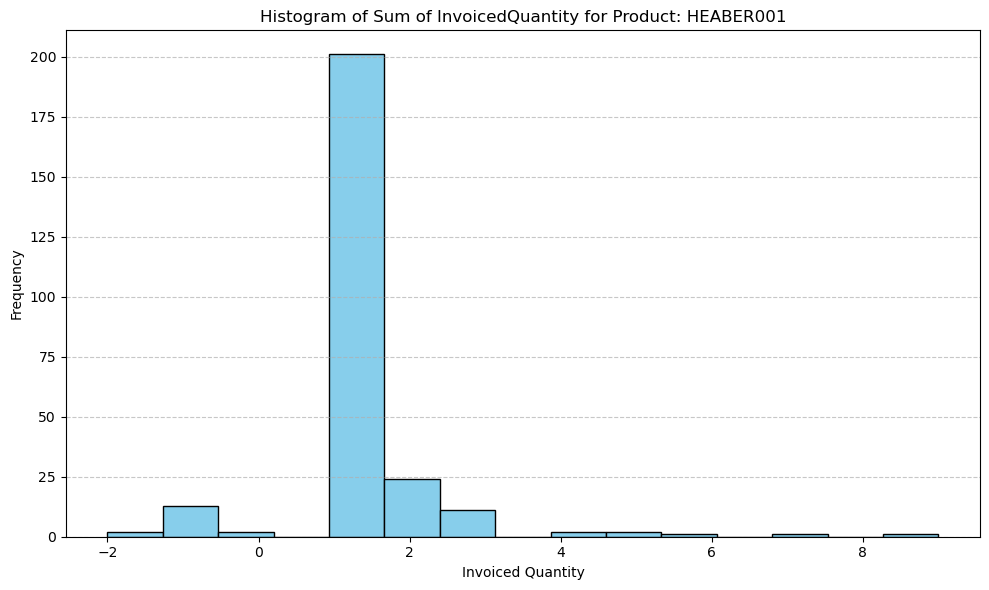

Raw data historical demand for Product: HOTBER001


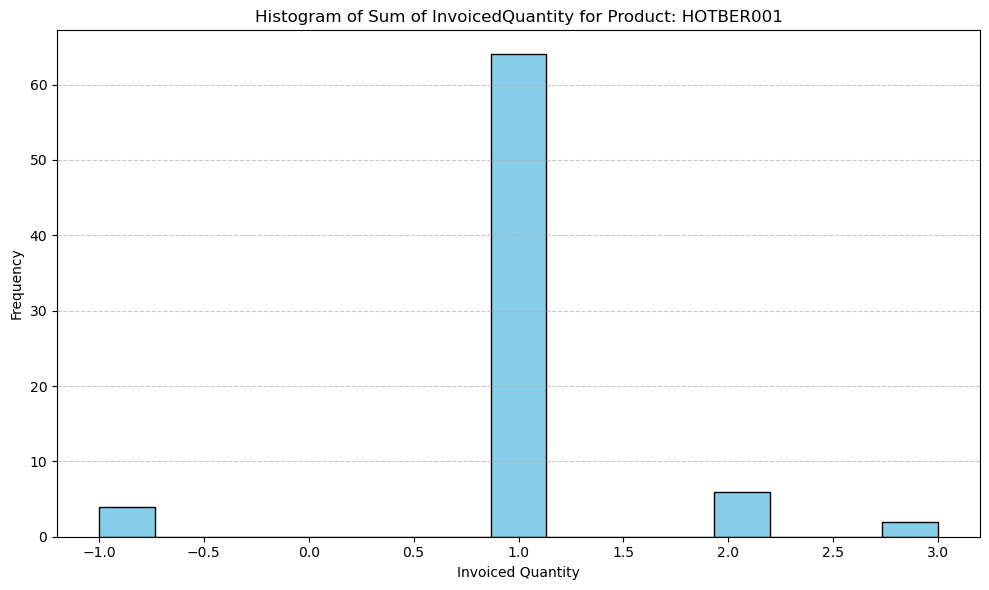

Raw data historical demand for Product: HOTBER002


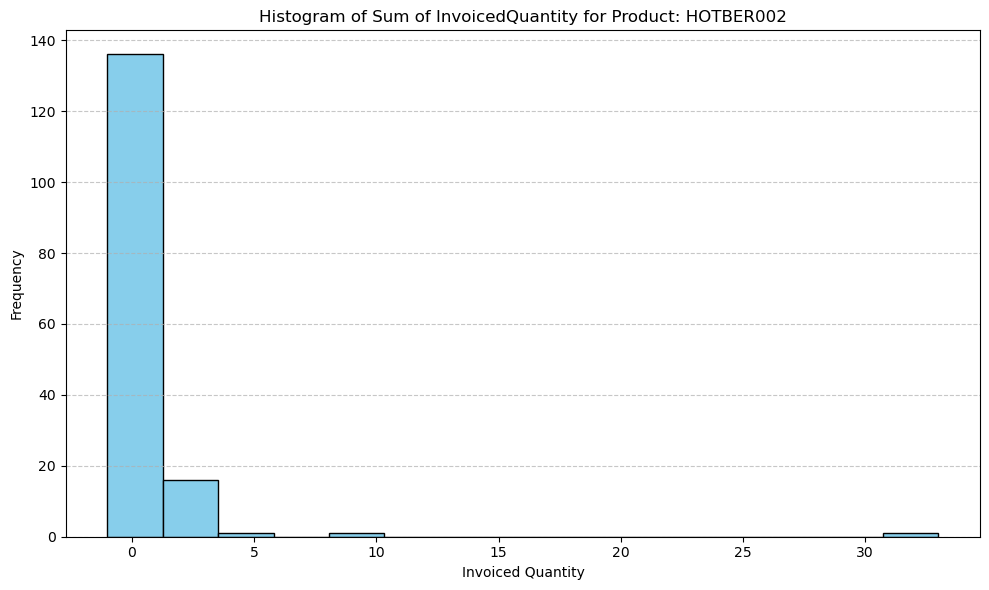

Raw data historical demand for Product: HOTBER003


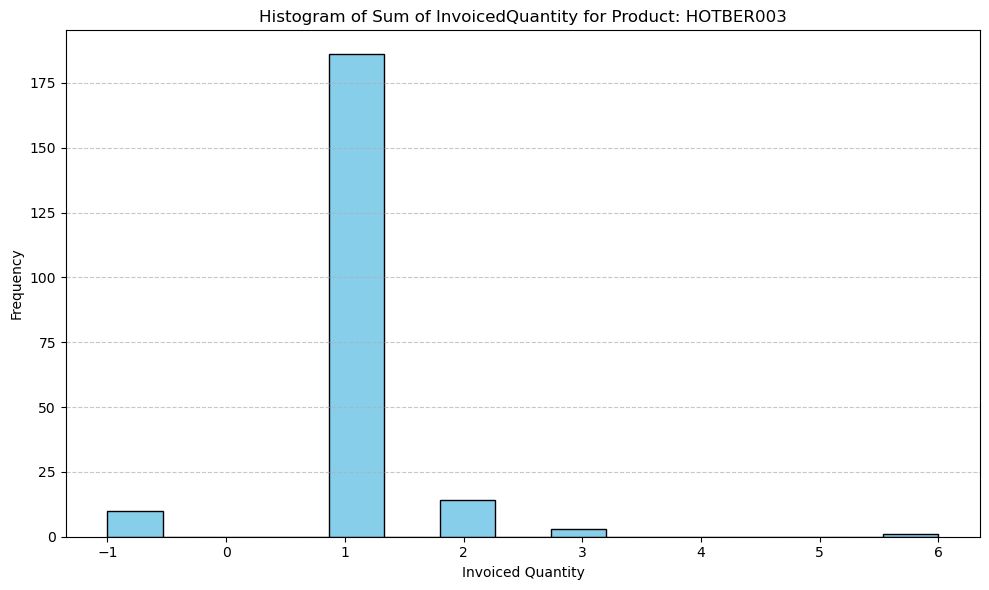

Raw data historical demand for Product: ICMBER002


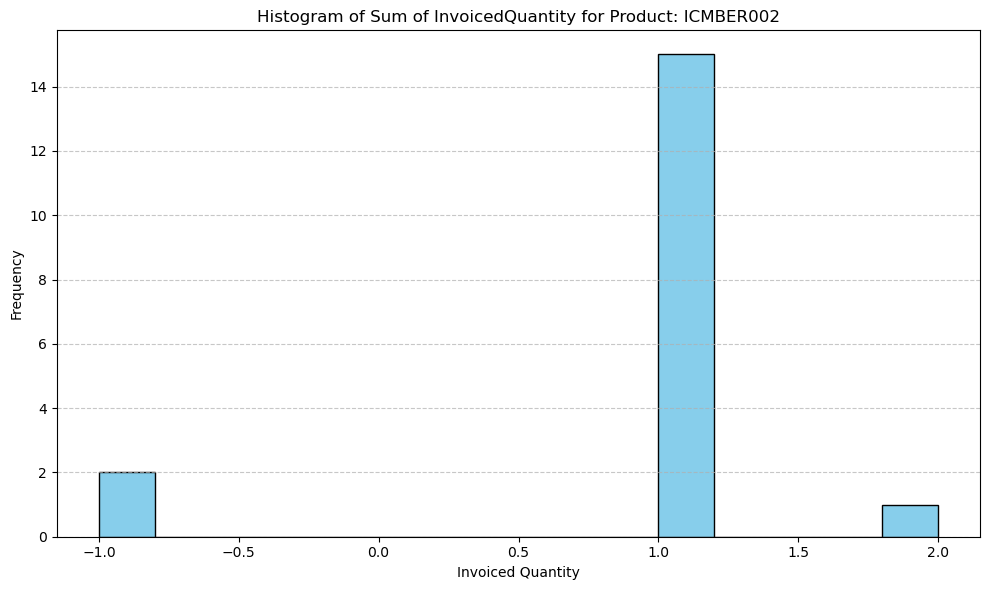

Raw data historical demand for Product: ICMBER003


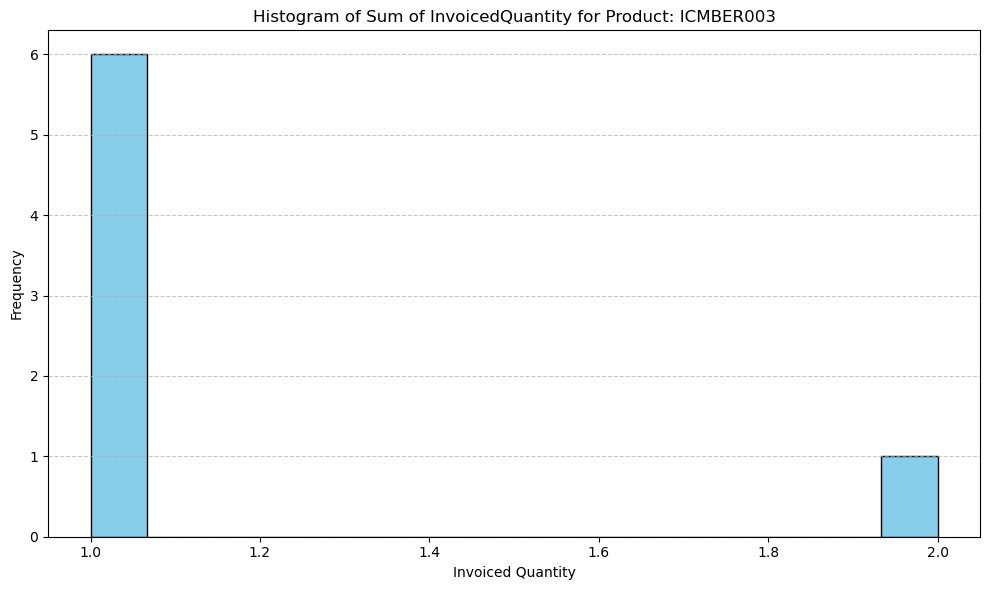

Raw data historical demand for Product: MIXBER001


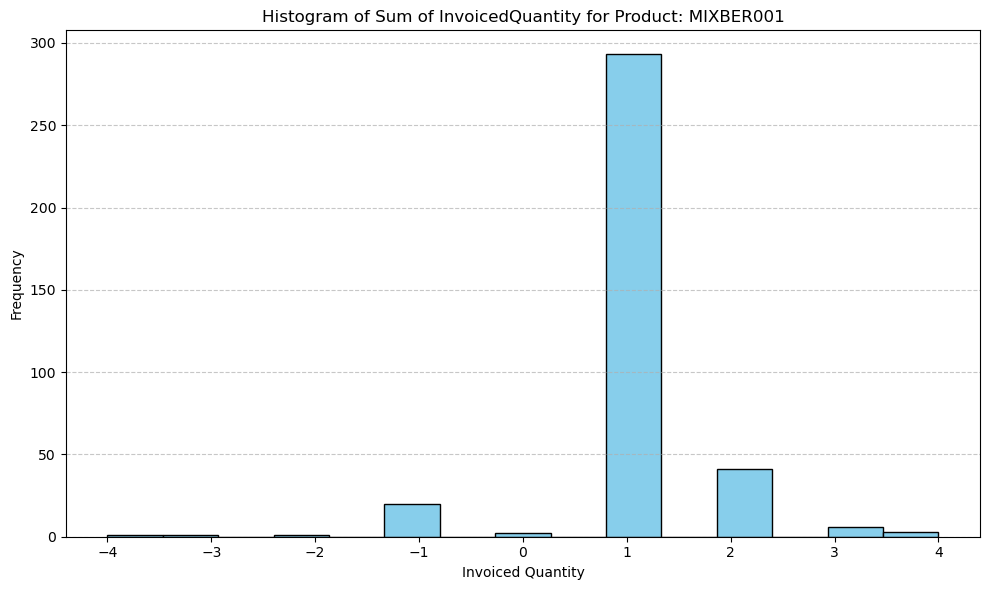

Raw data historical demand for Product: MIXBER003


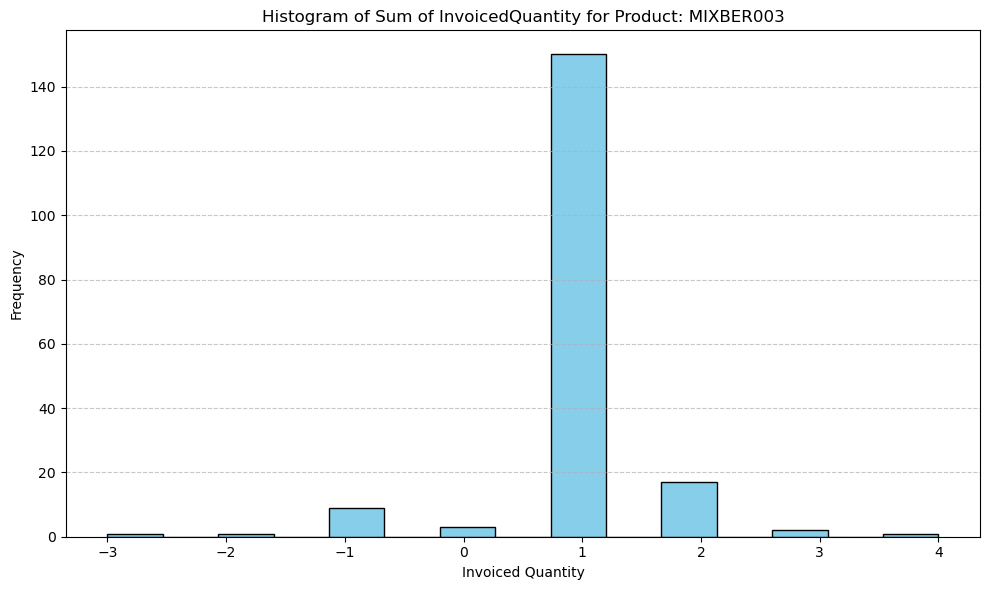

Raw data historical demand for Product: OVEBER002


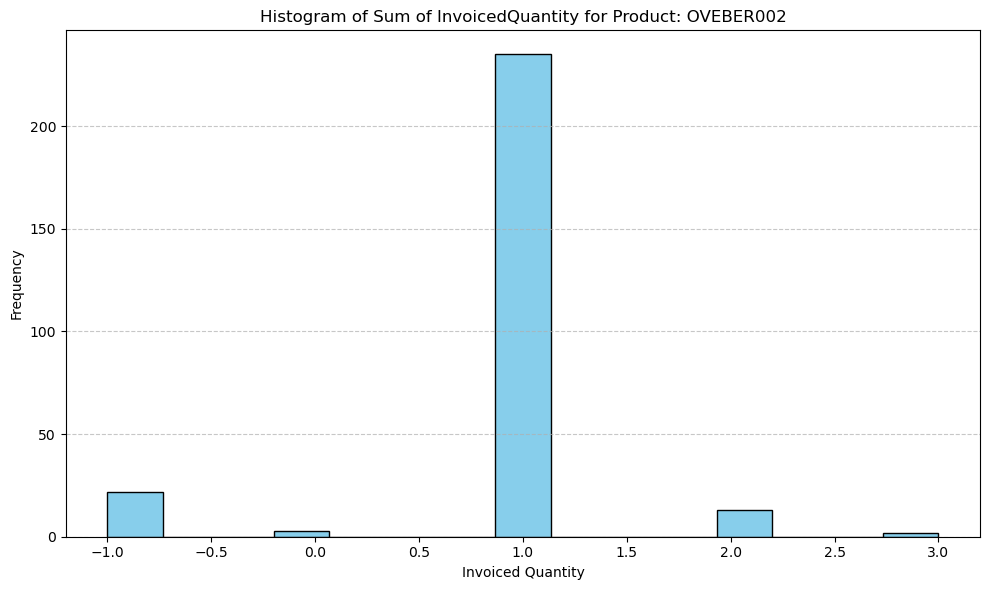

Raw data historical demand for Product: OVEBER005


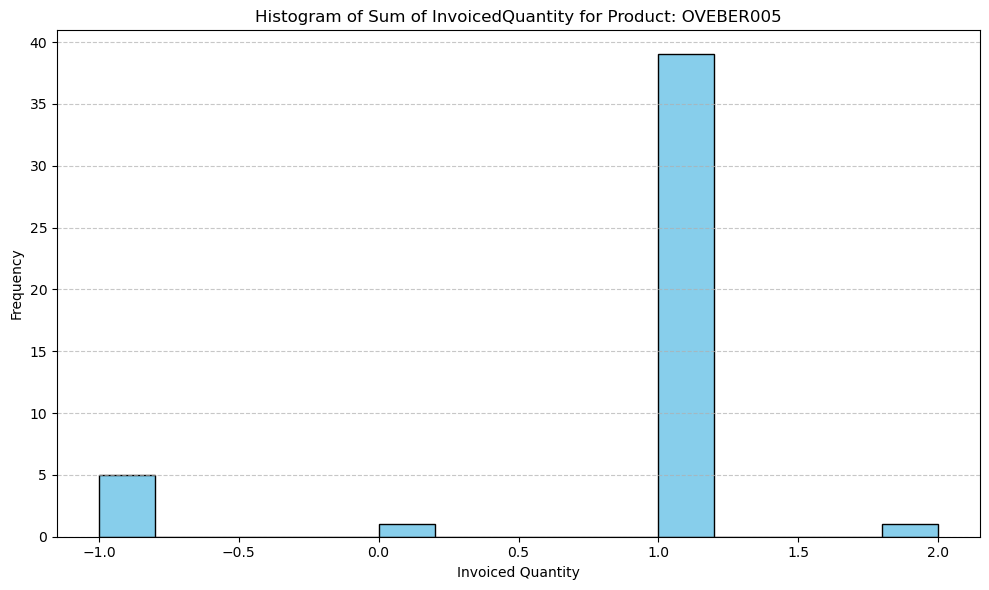

Raw data historical demand for Product: OVEBER006


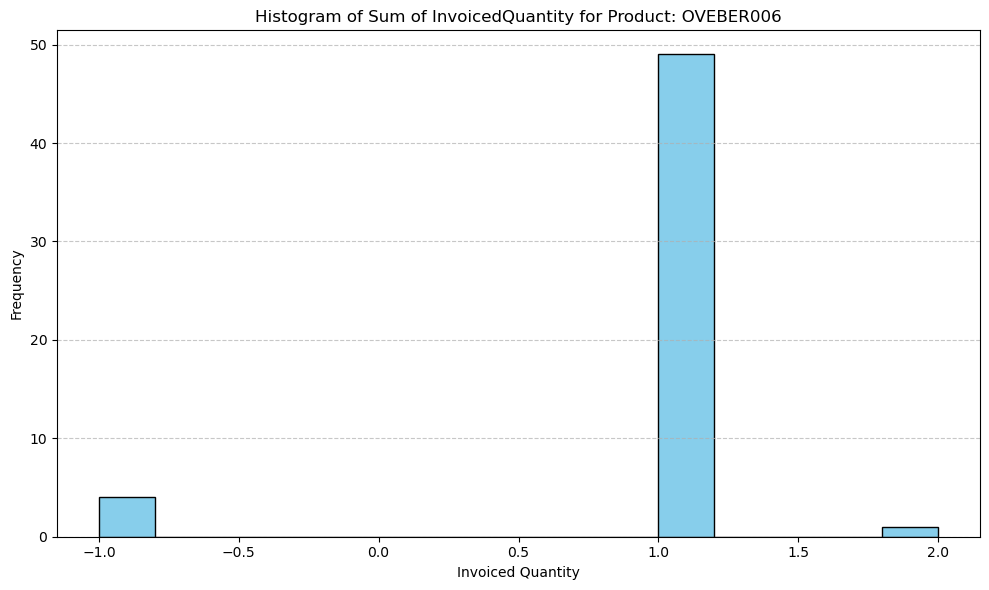

Raw data historical demand for Product: OVEBER011


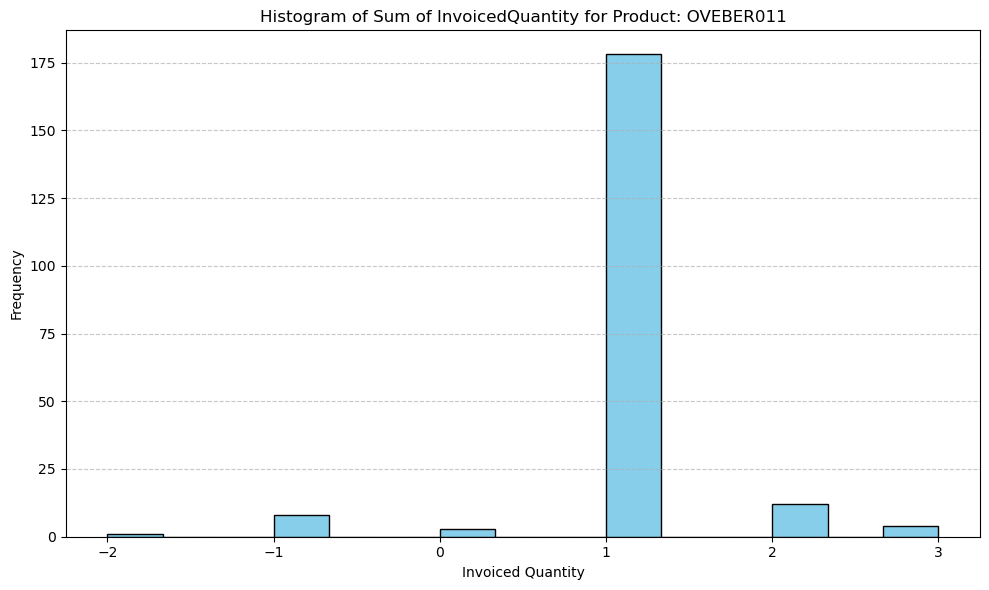

Raw data historical demand for Product: OVEBER012


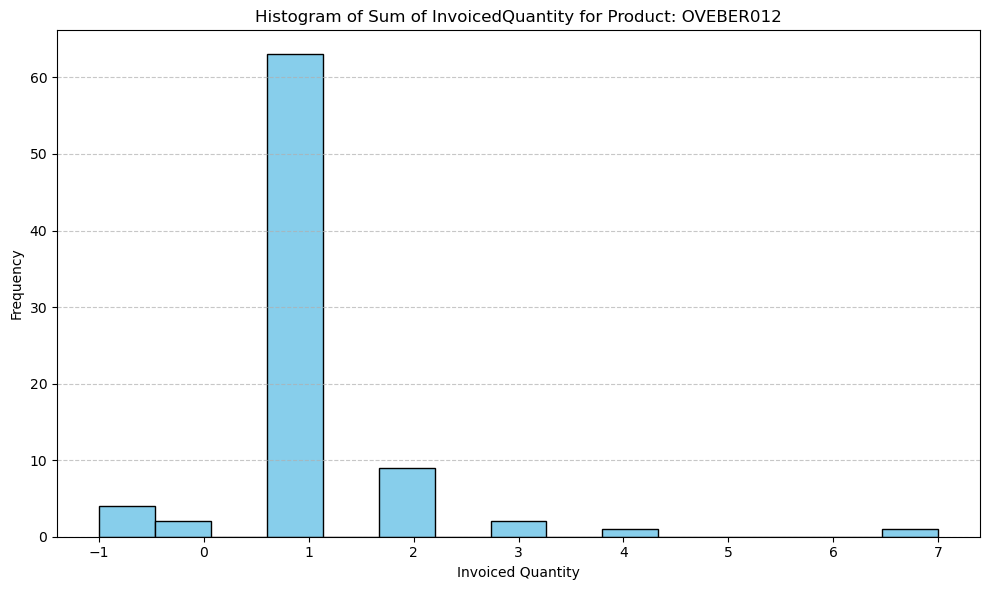

Raw data historical demand for Product: OVEBER013


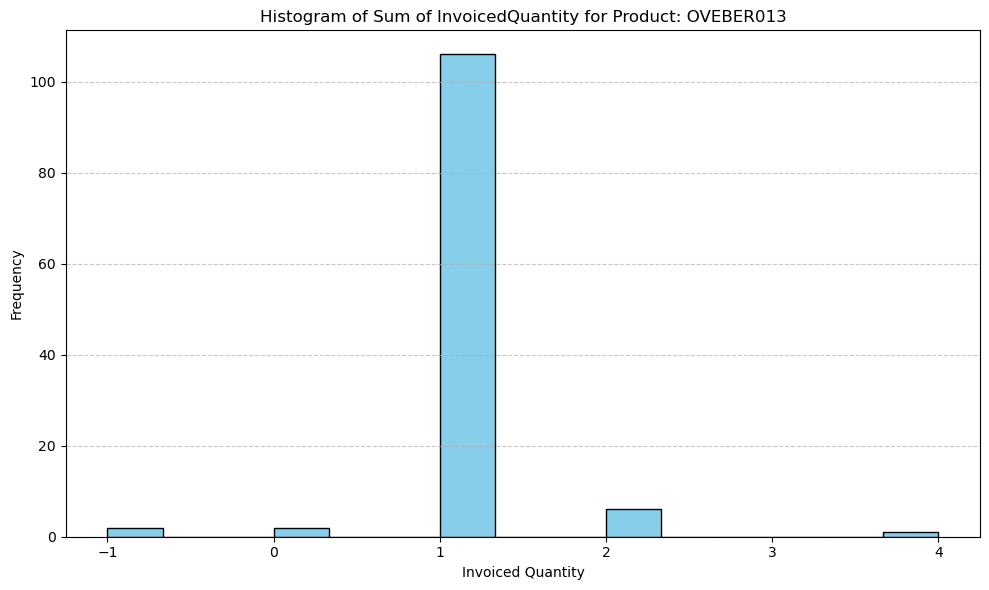

Raw data historical demand for Product: OVEBER014


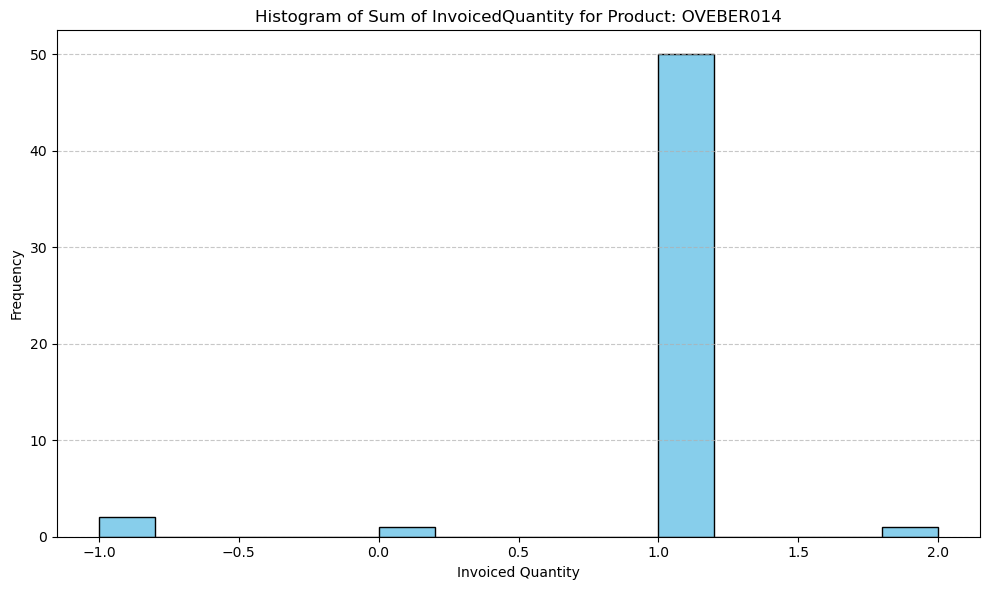

Raw data historical demand for Product: OVEBER015


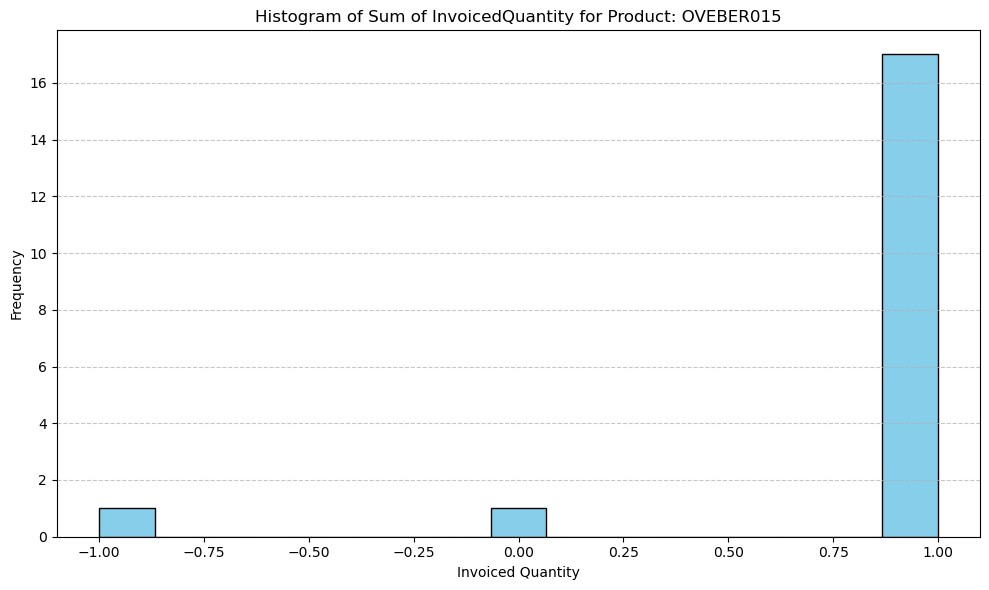

Raw data historical demand for Product: OVEBER016


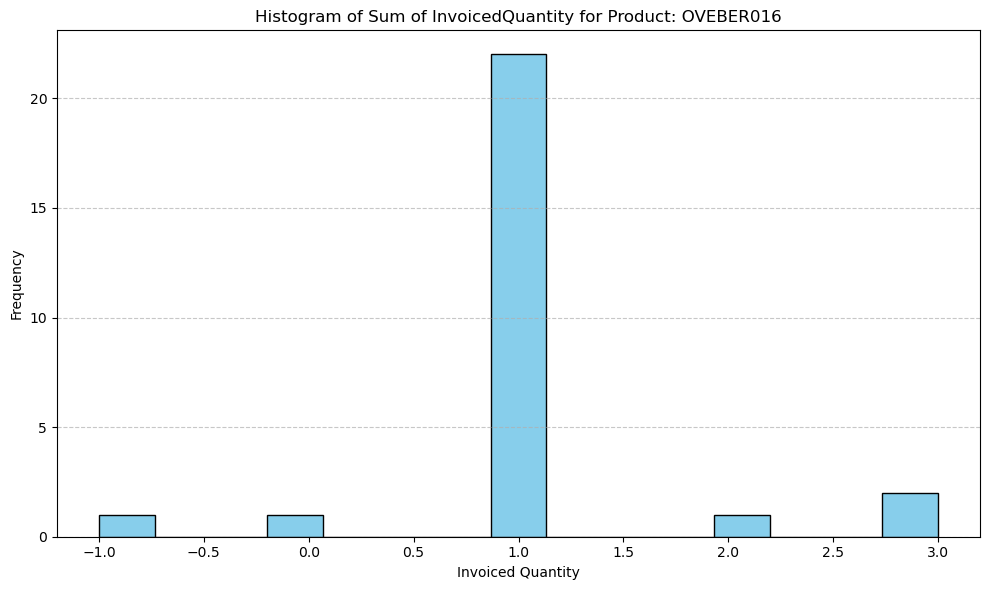

Raw data historical demand for Product: OVEBER017


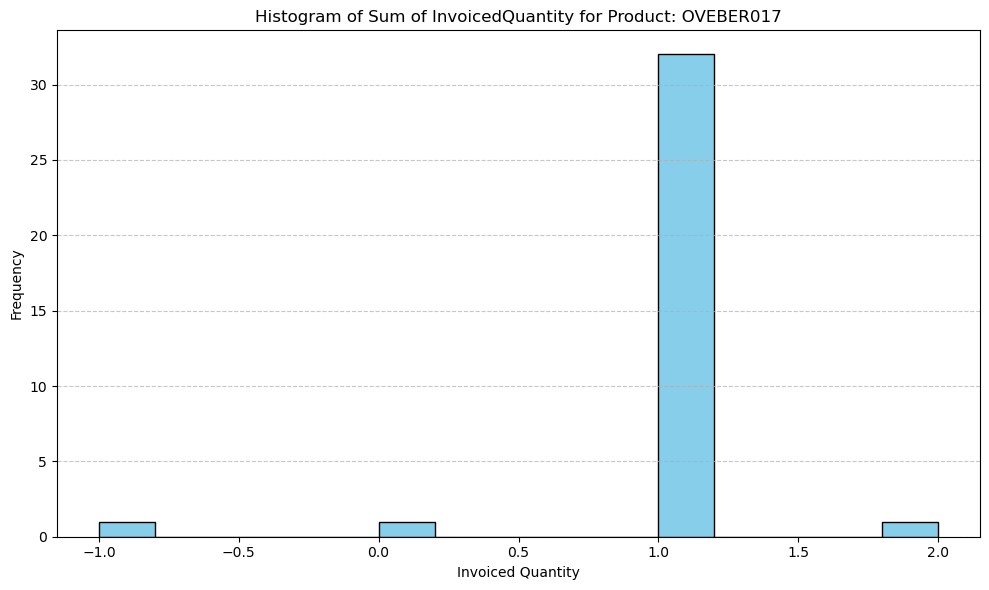

Raw data historical demand for Product: POPBER001


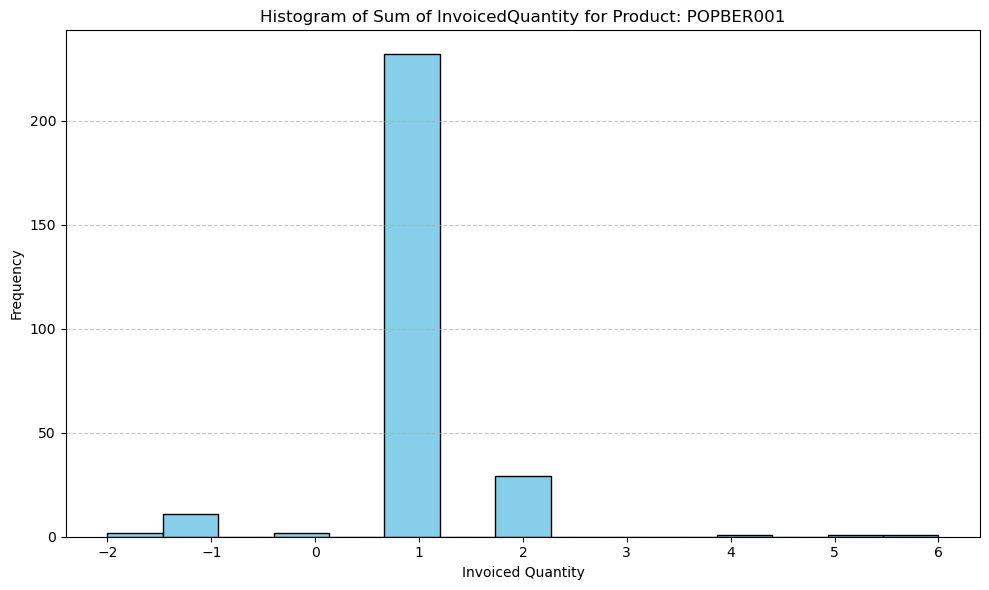

Raw data historical demand for Product: SOPBER001


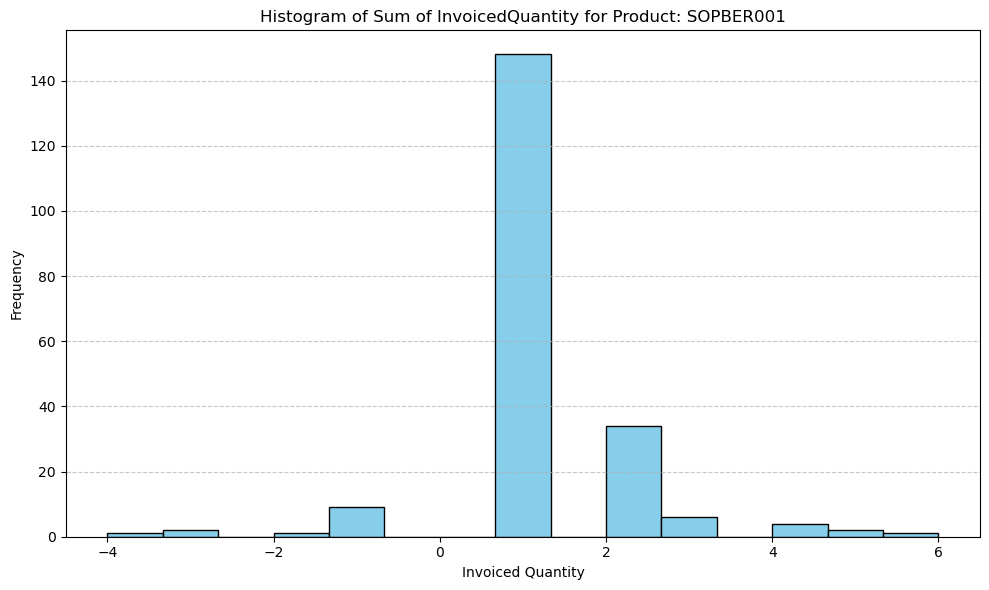

Raw data historical demand for Product: TROBER001


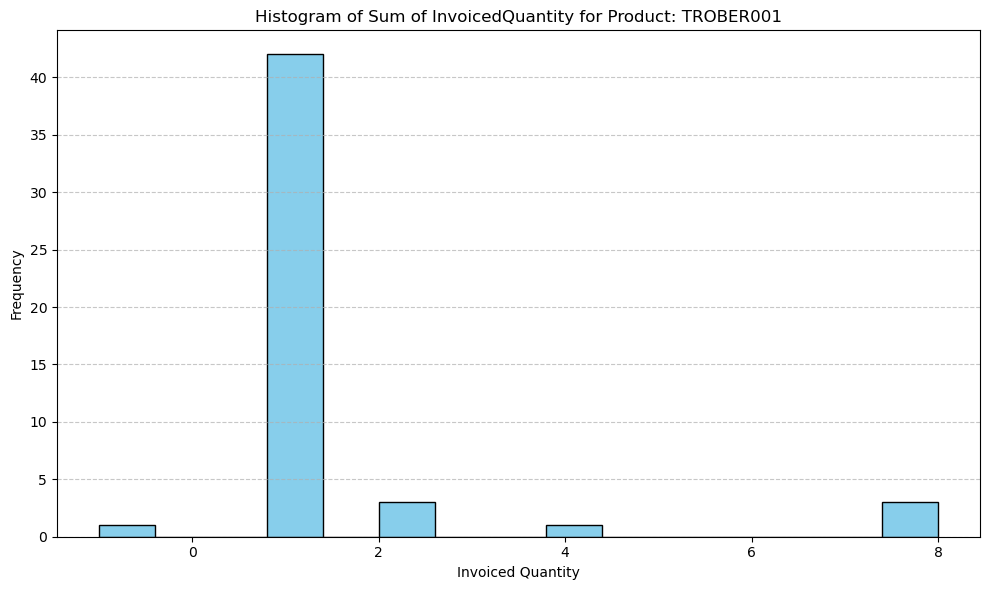

Raw data historical demand for Product: TROBER003


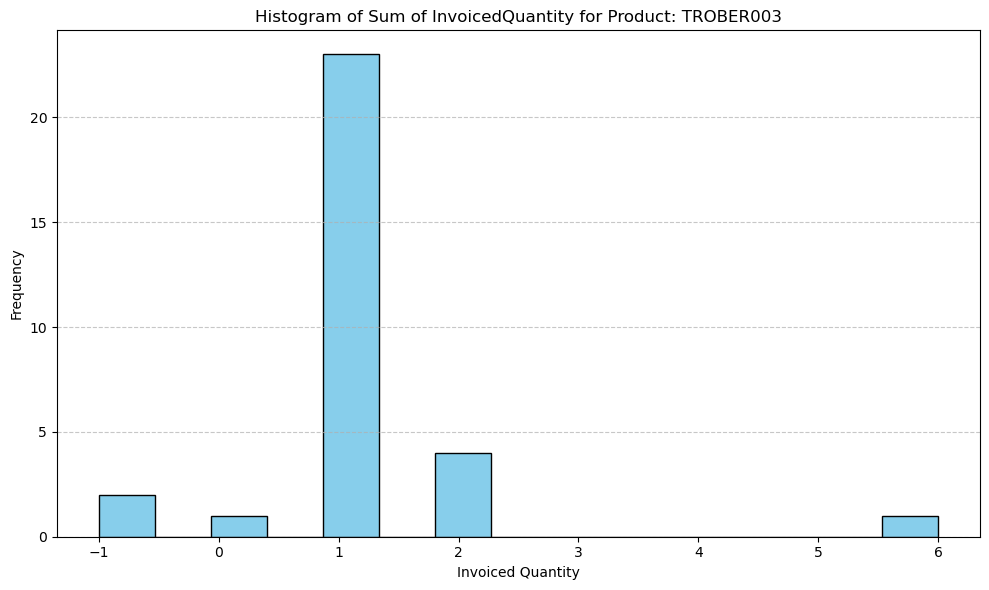

Raw data historical demand for Product: WARBER001


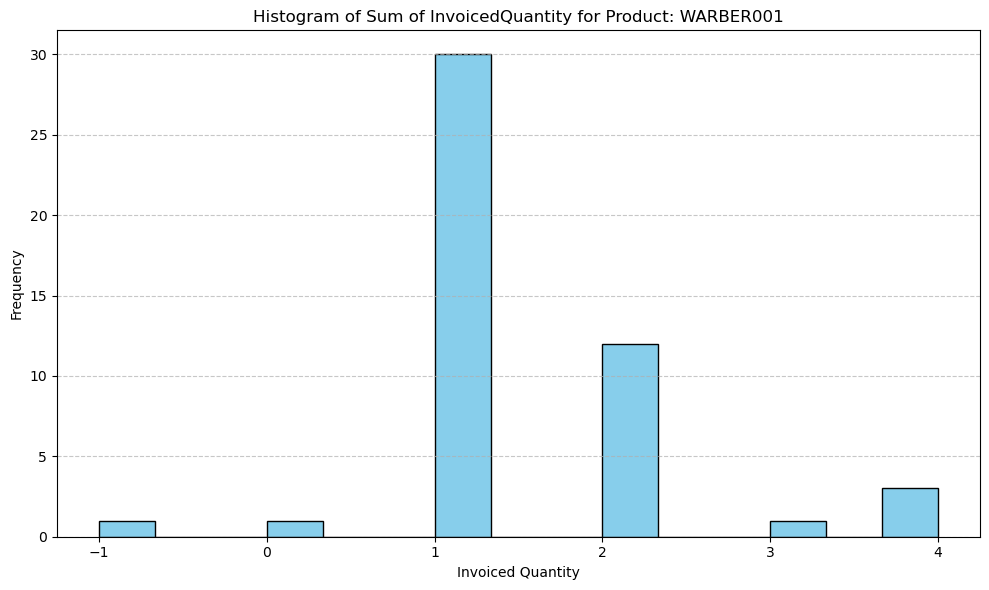

Raw data historical demand for Product: WARBER002


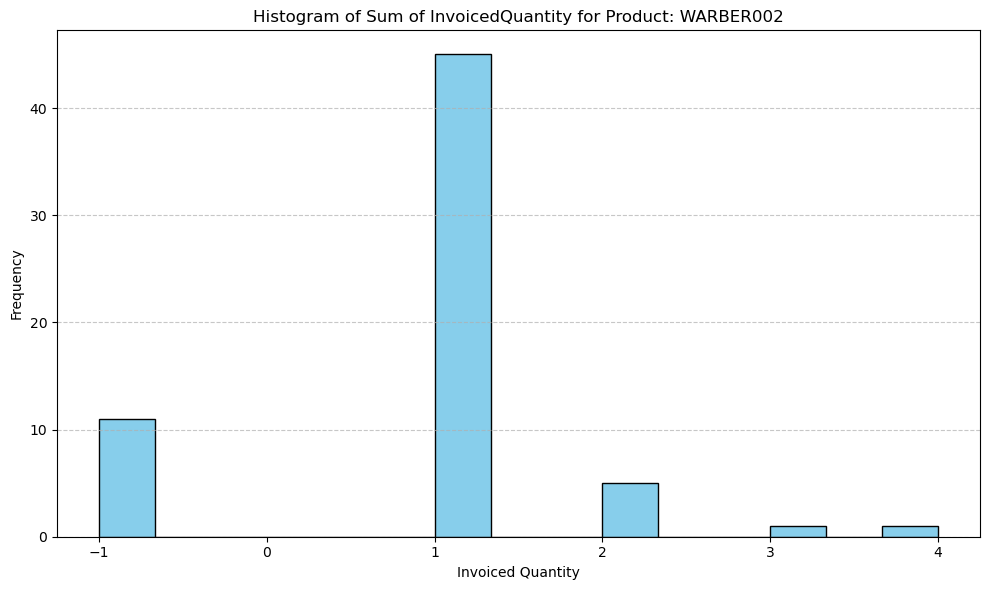

Raw data historical demand for Product: WARBER003


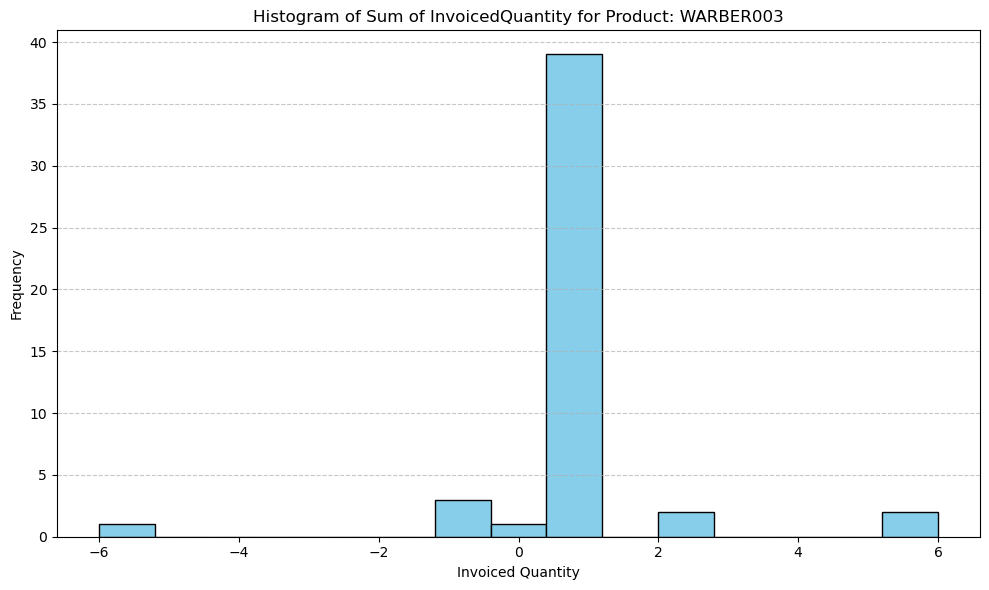

Raw data historical demand for Product: WARBER004


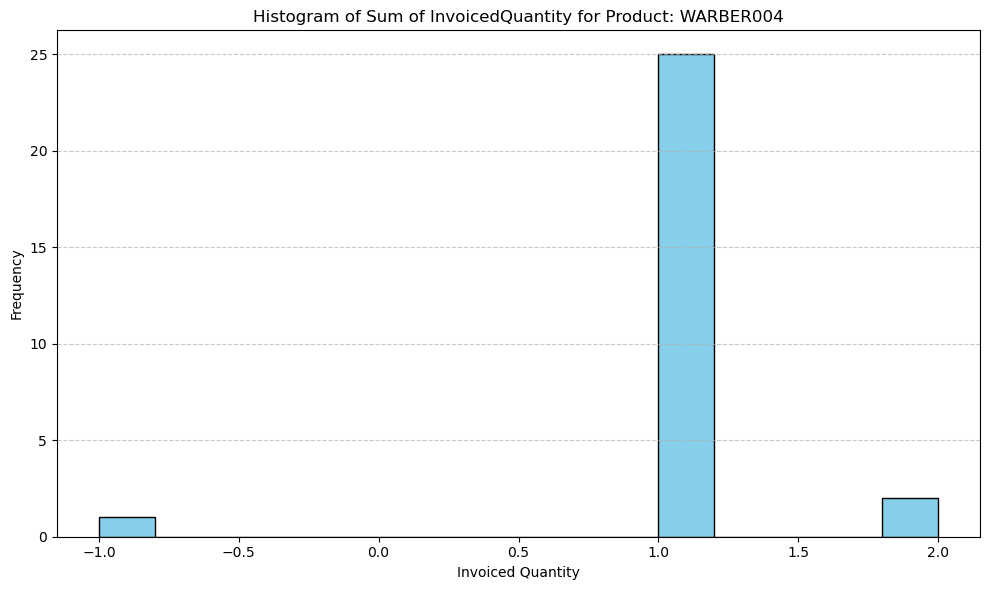

Raw data historical demand for Product: WARBER005


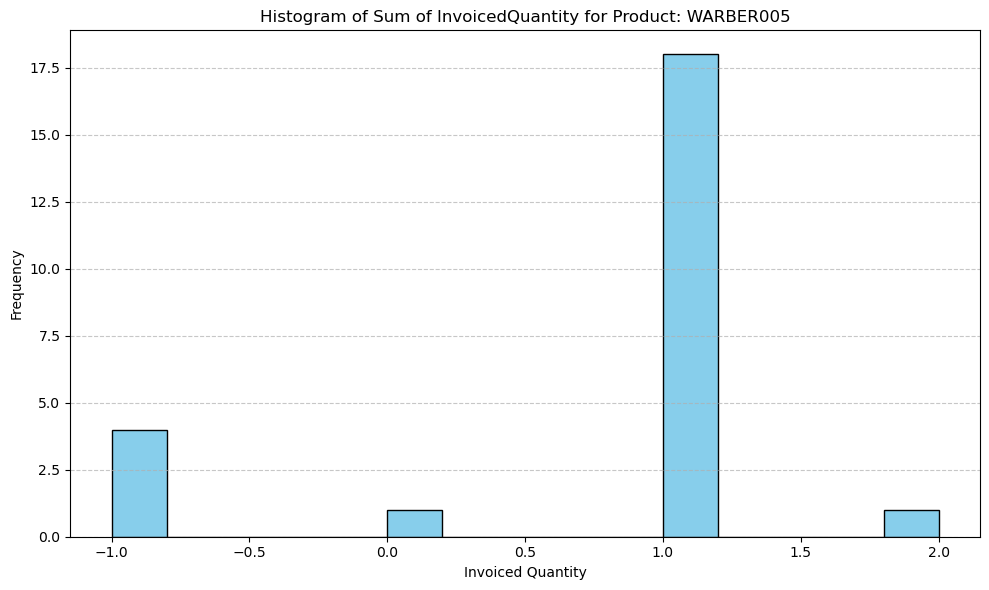

Raw data historical demand for Product: WARBER006


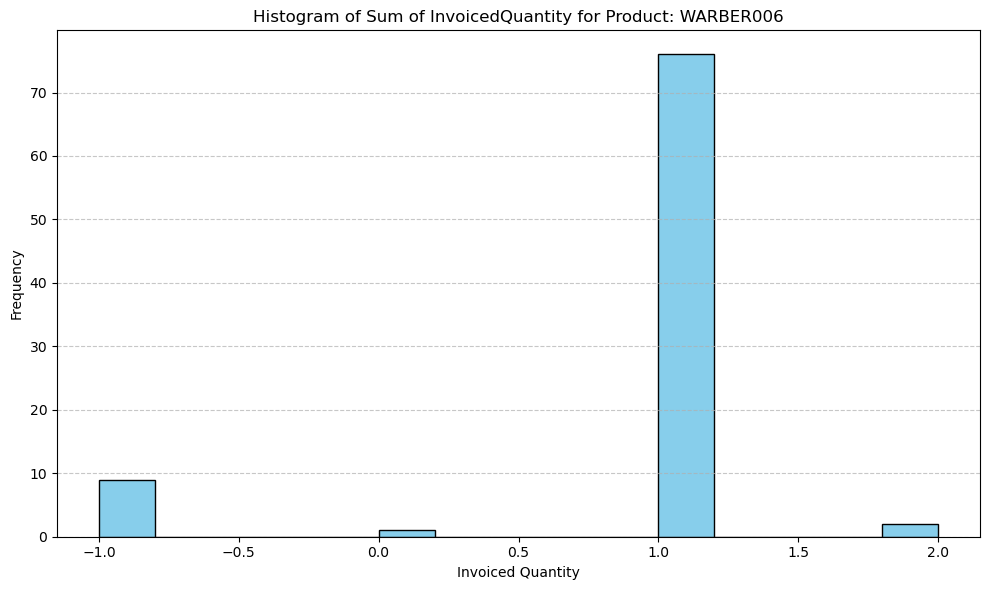

Raw data historical demand for Product: WARBER009


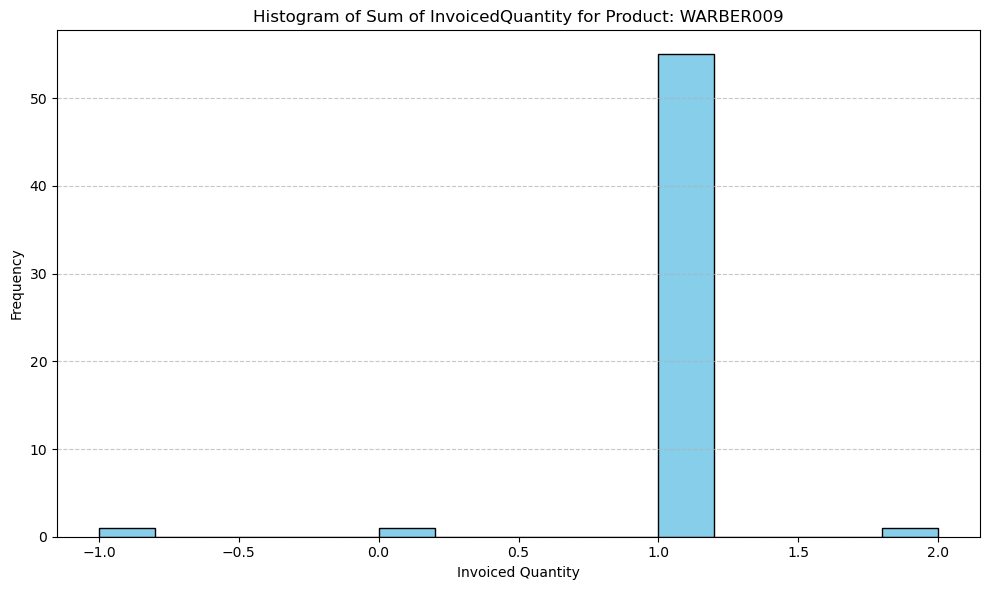

Raw data historical demand for Product: WARBER010


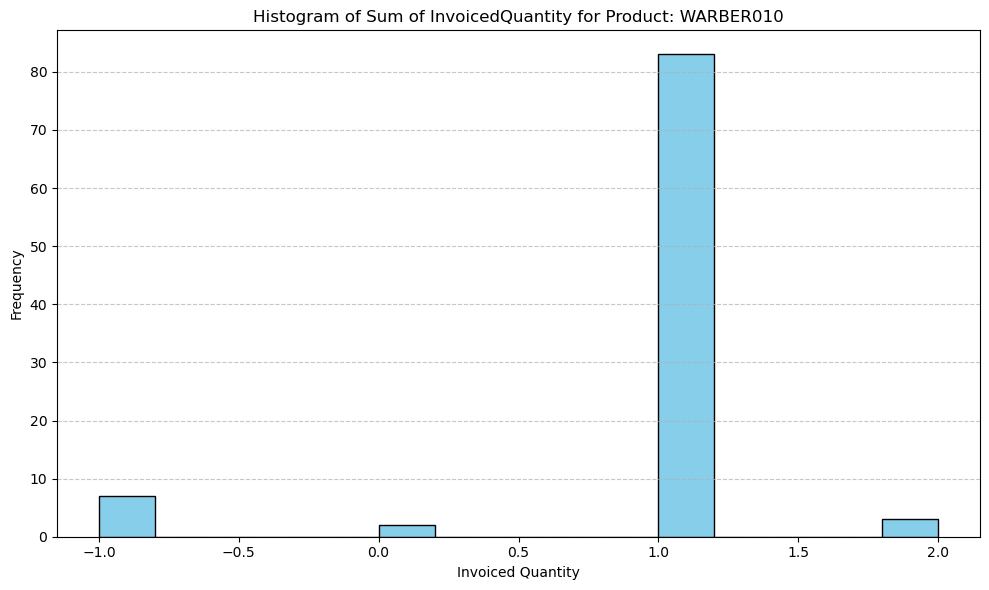

Raw data historical demand for Product: WARBER011


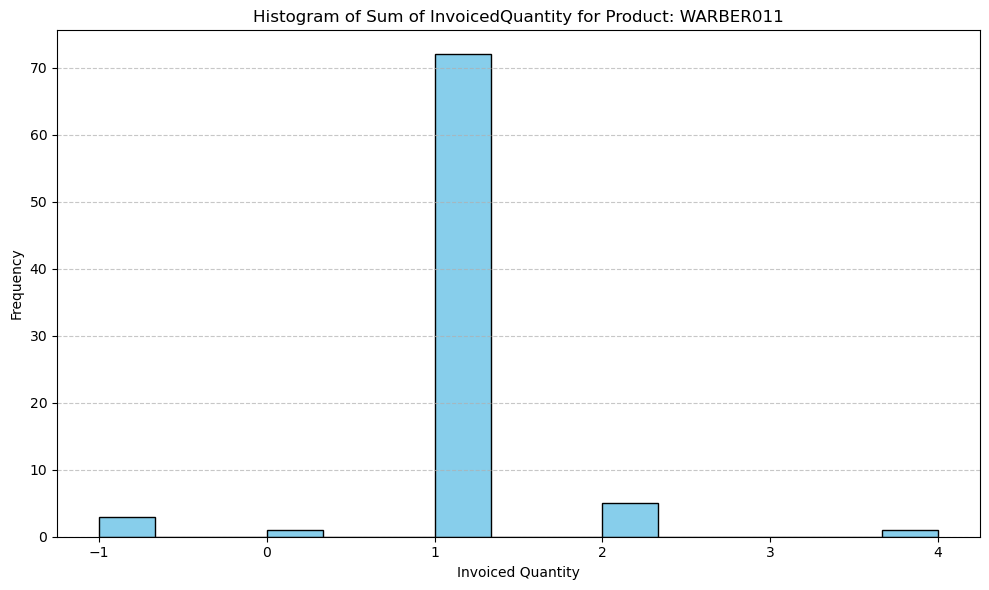

Raw data historical demand for Product: WARBER012


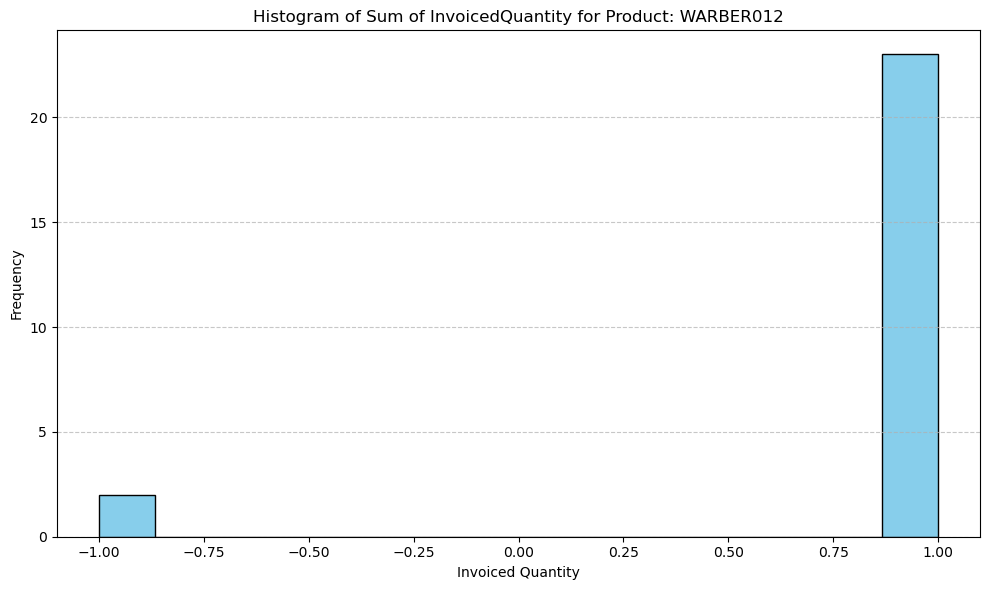

Raw data historical demand for Product: WARBER013


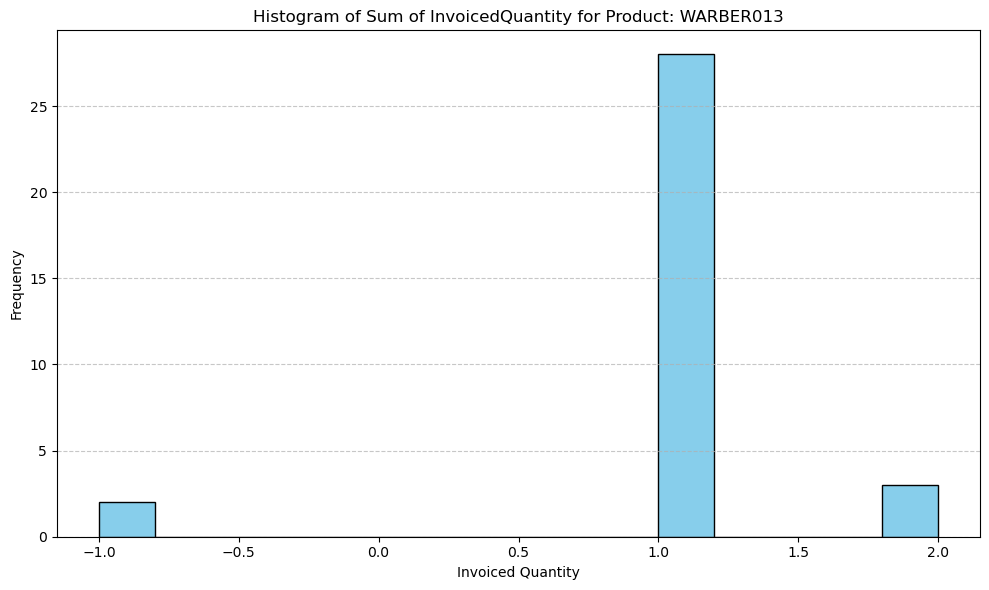

Raw data historical demand for Product: WARBER015


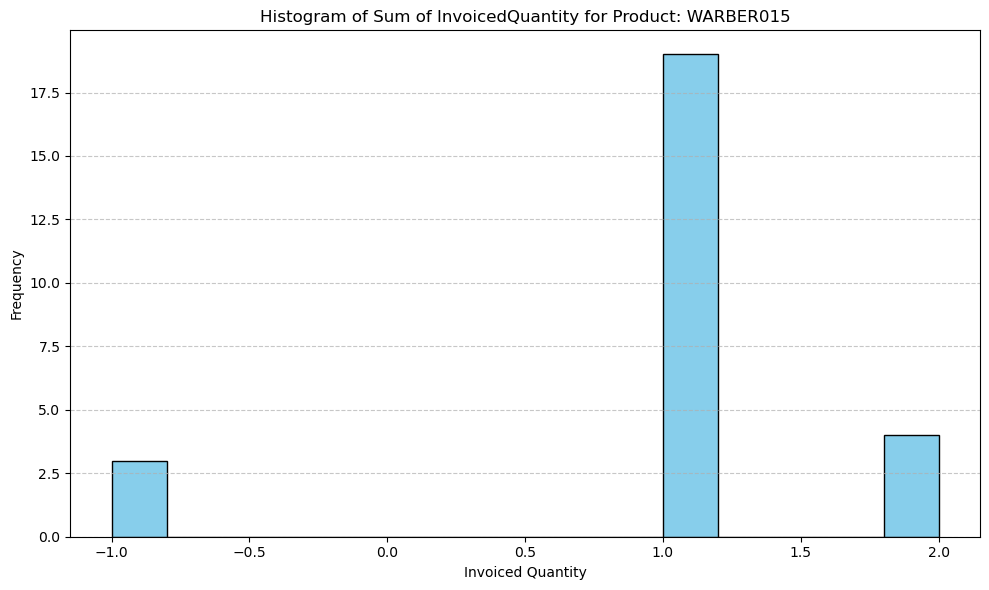

Raw data historical demand for Product: WARBER016


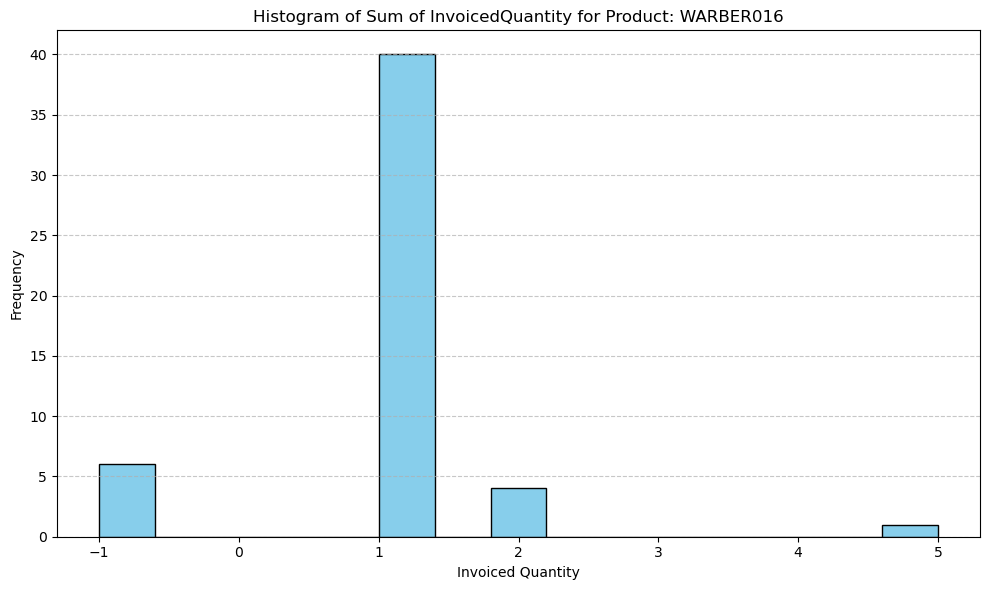

Raw data historical demand for Product: WARBER022


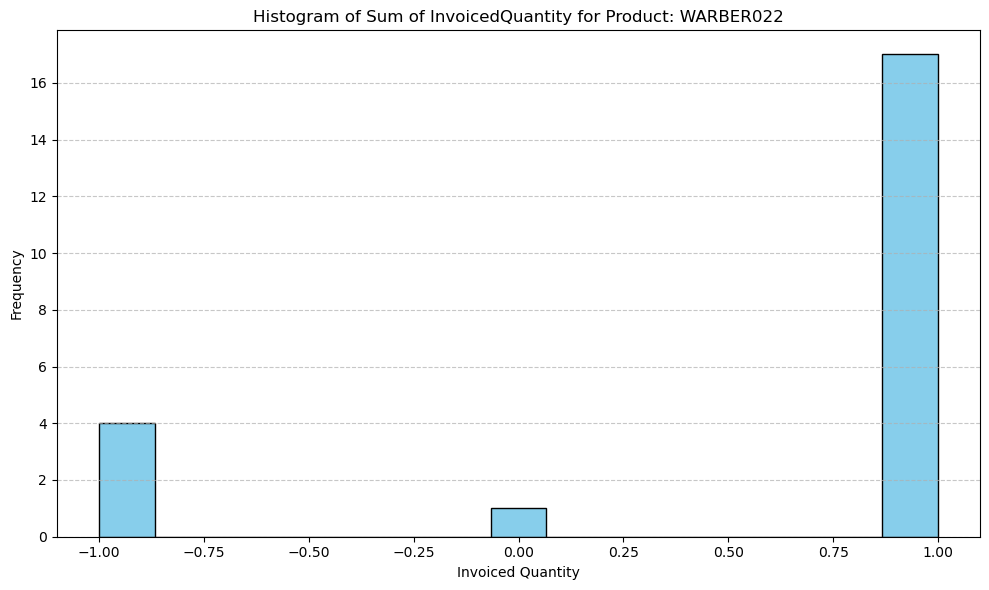

Raw data historical demand for Product: WARBER023


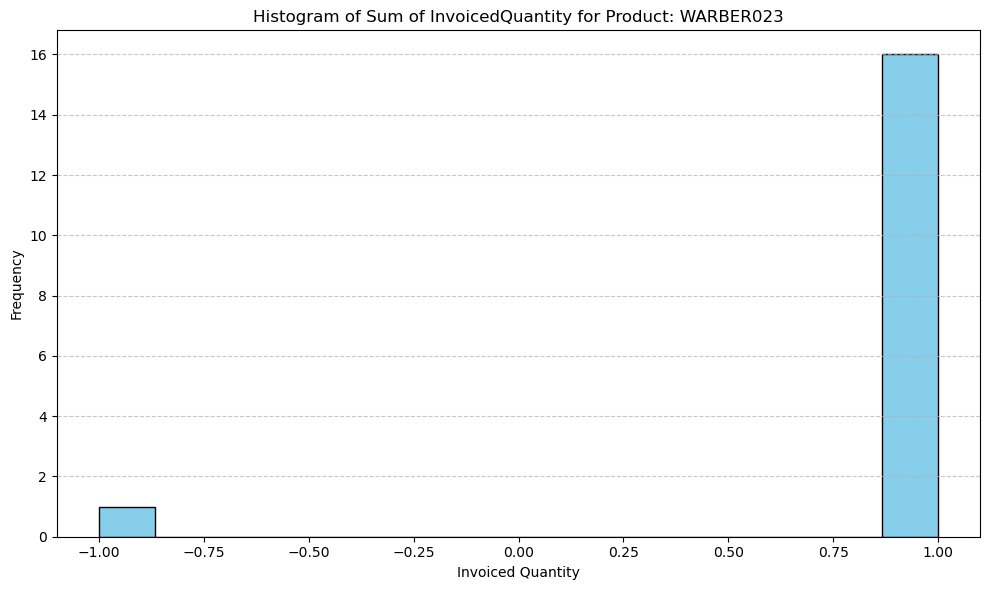

Raw data historical demand for Product: WARBER024


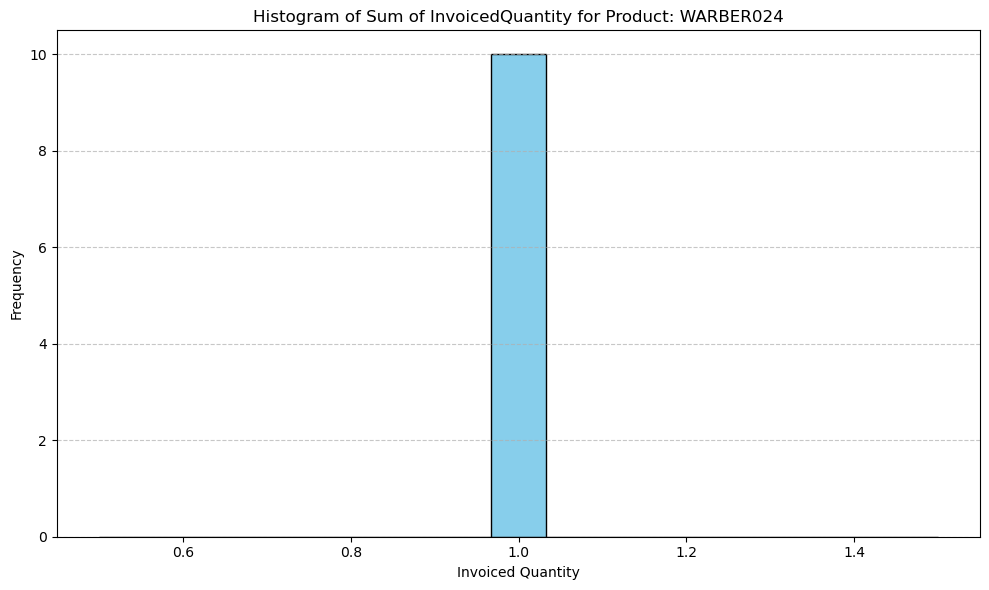

In [18]:
def raw_data_plot(ProductNumber, df):
    # Filter data for the specific product
    product_data = df[df['ProductNumber'] == ProductNumber]
    y = product_data['Sum of InvoicedQuantity']

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(y, bins=15, color='skyblue', edgecolor='black')  # Use column 'Sum of InvoicedQuantity'
        
    # Customize plot
    plt.title(f"Histogram of Sum of InvoicedQuantity for Product: {ProductNumber}")
    plt.xlabel("Invoiced Quantity")
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()  # Adjust layout for better visibility

    # Show the plot
    plt.show()
    
    return product_data

# Get unique ProductNumbers
item_comb = raw_data_group[['ProductNumber']].drop_duplicates()

# Plot histogram for each product
for _, row in item_comb.iterrows():
    ProductNumber = row['ProductNumber']
    print(f"Raw data historical demand for Product: {ProductNumber}")
    raw_historical = raw_data_plot(ProductNumber, df)


## Remove Outliers ##

In [19]:
# Function to remove outliers per group (store-item combination)
def remove_outliers_grouped(df, group_cols, value_col):
    def remove_outliers(df_group):
        # Calculate IQR for the group
        Q1 = df_group[value_col].quantile(0.25)
        Q3 = df_group[value_col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
            
        # Filter out rows with higher than IQR outliers
        return df_group[((df_group[value_col] <= upper_bound) & (df_group[value_col] >= lower_bound)) |
            ((df_group[value_col] >= 1) & (df_group[value_col] <= 5)) |
            ((df_group[value_col] >= -5) & (df_group[value_col] <= -1))]
        # Filter out rows with higher than and lower than outliers in addition normal sales values between 1 and 5.

    # Apply outlier removal for each group
    df_cleaned = df.groupby(group_cols, group_keys=False).apply(remove_outliers, include_groups=False)
    return df_cleaned

# Remove outliers on a per-store, per-item basis
data_cleaned = remove_outliers_grouped(df, group_cols=['InventoryWarehouseId_dup', 'ProductNumber_dup'], value_col='Sum of InvoicedQuantity').reset_index()
data_cleaned

,index,InvoiceDate,InventoryWarehouseId,ProductNumber,Sum of InvoicedQuantity
0,200,2020-01-30,DMSQR,BOLBER001,1
1,201,2020-01-30,DMSQR,BOLBER001,2
2,454,2020-03-08,DMSQR,BOLBER001,1
3,704,2020-06-21,DMSQR,BOLBER001,1
4,1158,2020-09-26,DMSQR,BOLBER001,1
...,...,...,...,...,...
7451,4342,2022-08-11,TKSQR,WARBER023,1
7452,4659,2022-10-06,TKSQR,WARBER023,1
7453,5922,2023-07-08,TKSQR,WARBER023,1
7454,6737,2024-02-07,TKSQR,WARBER024,1


In [20]:
data_cleaned.to_csv('data_cleaned.csv', index=False)

In [21]:
# Aggregate daily sales into monthly buckets
data_cleaned['month'] = data_cleaned['InvoiceDate'].dt.to_period('M').dt.to_timestamp() + pd.offsets.MonthEnd(0) 
monthly_data = data_cleaned.groupby(['ProductNumber', 'month'], as_index=False)['Sum of InvoicedQuantity'].sum()
monthly_data

,ProductNumber,month,Sum of InvoicedQuantity
0,BOLBER001,2020-01-31,5
1,BOLBER001,2020-02-29,0
2,BOLBER001,2020-03-31,4
3,BOLBER001,2020-06-30,10
4,BOLBER001,2020-07-31,2
...,...,...,...
1959,WARBER024,2023-01-31,1
1960,WARBER024,2023-02-28,2
1961,WARBER024,2023-03-31,1
1962,WARBER024,2024-02-29,1


In [22]:
monthly_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1964 entries, 0 to 1963
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   ProductNumber            1964 non-null   object        
 1   month                    1964 non-null   datetime64[ns]
 2   Sum of InvoicedQuantity  1964 non-null   int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 46.2+ KB


In [23]:
monthly_data.to_csv('monthly_data.csv', index=False)

## Generate a complete date range for time series analysis

In [24]:
# Fill missing months in historical demand data up to a specified end date with 0 sales.
def fill_missing_months(data):

    # Ensure 'month' is in datetime format
    data['month'] = pd.to_datetime(data['month'])
    #end_date = pd.to_datetime(end_date)
    
    # Find the start date (earliest month in the data)
    start_date = data['month'].min()
    end_date = data['month'].max()
    
    # Generate a complete range of months
    all_months = pd.date_range(start=start_date, end=end_date, freq='ME') 
    
    # Get all unique store-item combinations
    Unique_item = data[['ProductNumber']].drop_duplicates()
    
    # Create a cartesian product of all store-item combinations with the complete month range
    full_index = pd.MultiIndex.from_product(
        [Unique_item['ProductNumber'], 
         all_months],
        names=['ProductNumber', 'month']
    )
    
    # Create a full DataFrame from the cartesian product
    full_data = pd.DataFrame(index=full_index).reset_index()
    
    # Merge the original data with the full DataFrame
    data_filled = pd.merge(full_data, data, on=['ProductNumber', 'month'], how='left')
    
    # Fill missing sales with 0
    data_filled['Sum of InvoicedQuantity'] = data_filled['Sum of InvoicedQuantity'].fillna(0)
    
    return data_filled

# Fill missing months up to 30/11/2024
data_filled = fill_missing_months(monthly_data)

# Remove any potential duplicates introduced during merging
data_filled = data_filled.drop_duplicates(subset=['ProductNumber', 'month'])

In [25]:
data_filled

,ProductNumber,month,Sum of InvoicedQuantity
0,BOLBER001,2020-01-31,5.0
1,BOLBER001,2020-02-29,0.0
2,BOLBER001,2020-03-31,4.0
3,BOLBER001,2020-04-30,0.0
4,BOLBER001,2020-05-31,0.0
...,...,...,...
3655,WARBER024,2024-08-31,0.0
3656,WARBER024,2024-09-30,0.0
3657,WARBER024,2024-10-31,1.0
3658,WARBER024,2024-11-30,0.0


In [26]:
data_filled.to_csv('data_filled.csv', index=False)

## Explore the monthly sales historical data as pivot table

In [27]:
Pivot_table = pd.pivot_table(monthly_data, values='Sum of InvoicedQuantity', index='ProductNumber',
                       columns=['month'], aggfunc="sum", fill_value=0)
Pivot_table

month,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,...,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31,2024-11-30,2024-12-31
ProductNumber,,,,,,,,,,,,,,,,,,,,,
BOLBER001,5,0,4,0,0,10,2,2,6,4,...,0,0,0,0,0,0,0,0,0,0
BOLBER002,5,11,7,2,5,10,2,3,3,0,...,1,0,0,0,0,0,0,0,0,0
BOLBER003,1,0,4,-1,1,2,0,6,1,2,...,0,4,0,0,0,1,1,1,0,0
BOLBER005,0,2,1,0,0,1,0,2,0,0,...,0,0,0,0,0,0,0,1,1,0
BURBER001,0,0,2,0,1,4,0,2,0,1,...,1,0,0,0,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WARBER015,2,0,2,0,0,0,0,0,0,0,...,1,0,0,0,0,1,2,0,0,0
WARBER016,2,2,0,0,0,0,1,0,0,2,...,0,1,0,0,0,0,0,0,0,0
WARBER022,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
Pivot_table.to_csv('Pivot_table-monthly_data.csv', index=True) 

Historical demand for Item: BOLBER001


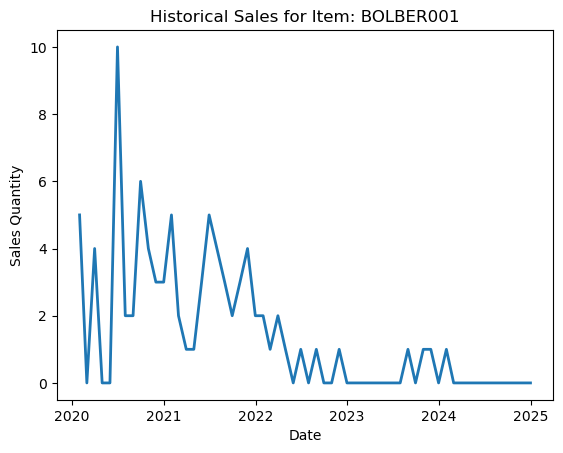

Historical demand for Item: BOLBER002


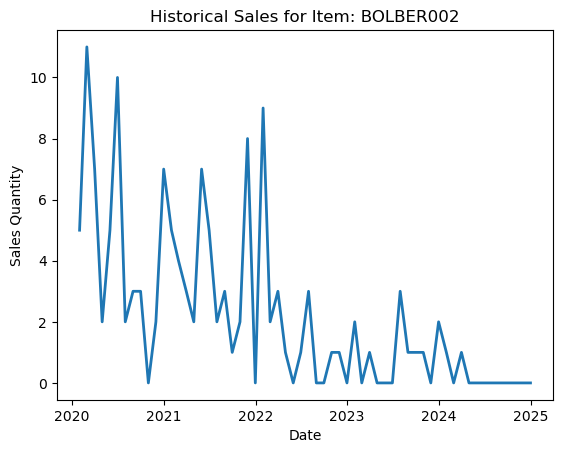

Historical demand for Item: BOLBER003


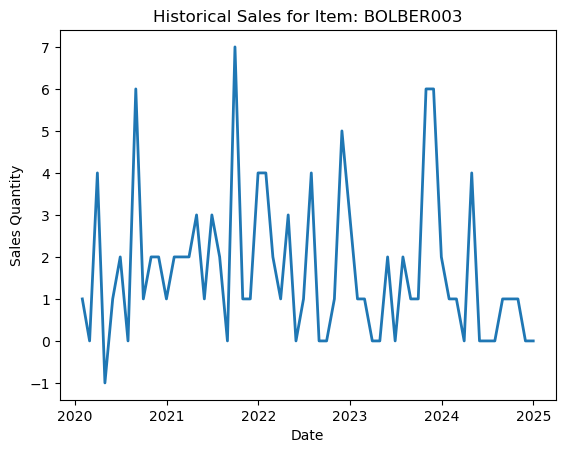

Historical demand for Item: BOLBER005


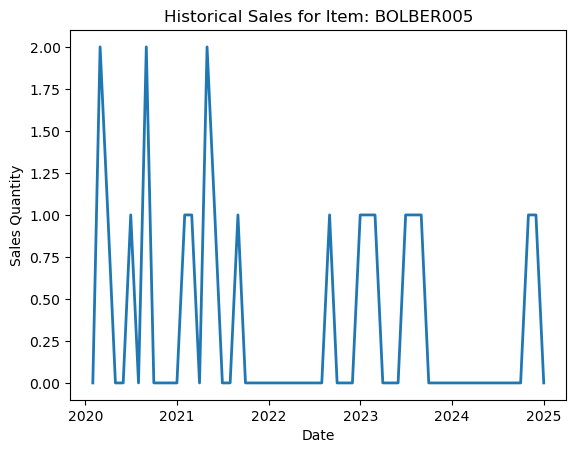

Historical demand for Item: BURBER001


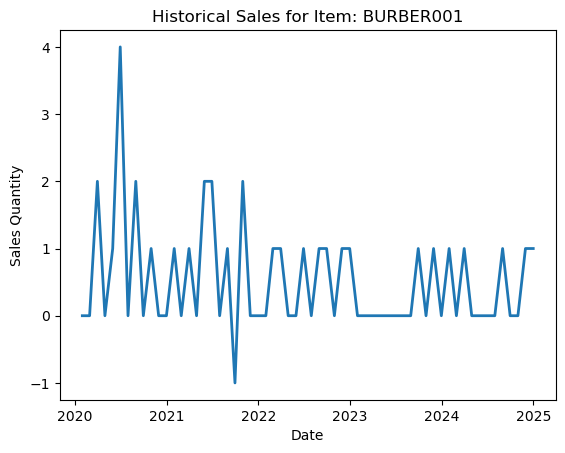

Historical demand for Item: BURBER002


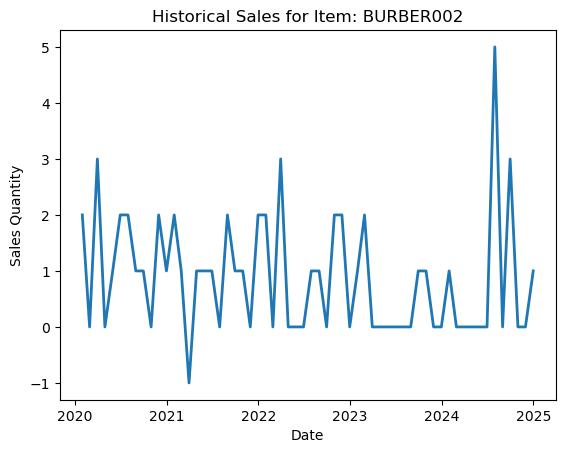

Historical demand for Item: BURBER003


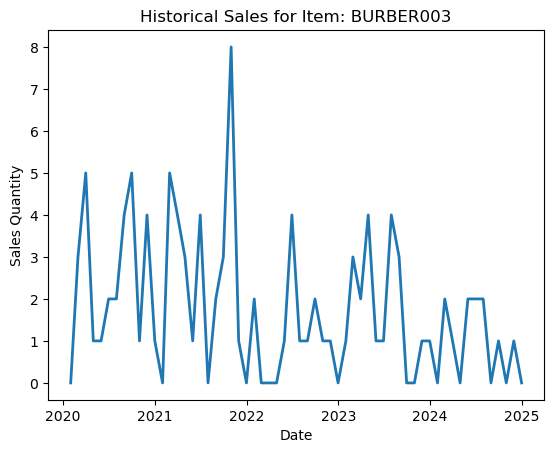

Historical demand for Item: BURBER004


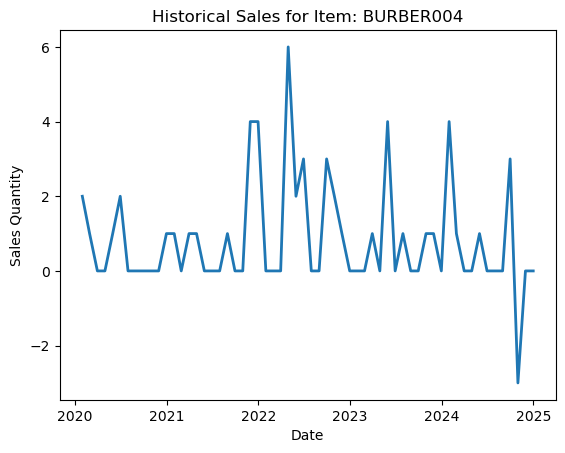

Historical demand for Item: BURBER007


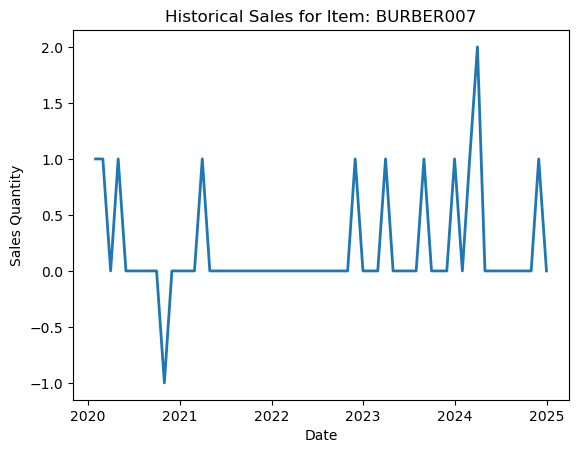

Historical demand for Item: COFBER001


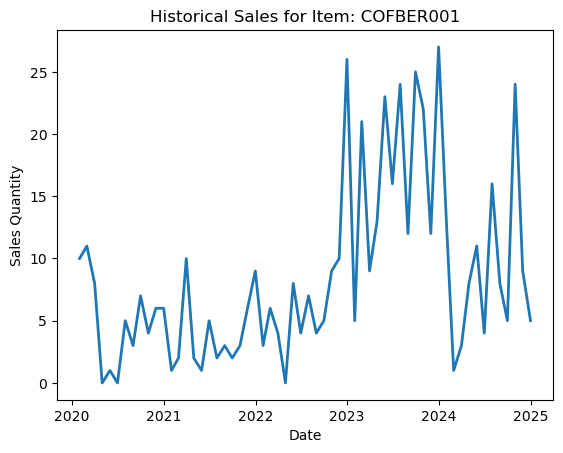

Historical demand for Item: COKBER001


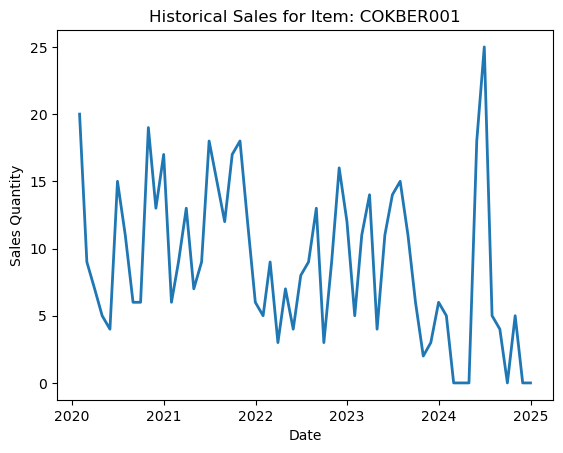

Historical demand for Item: FRYBER002


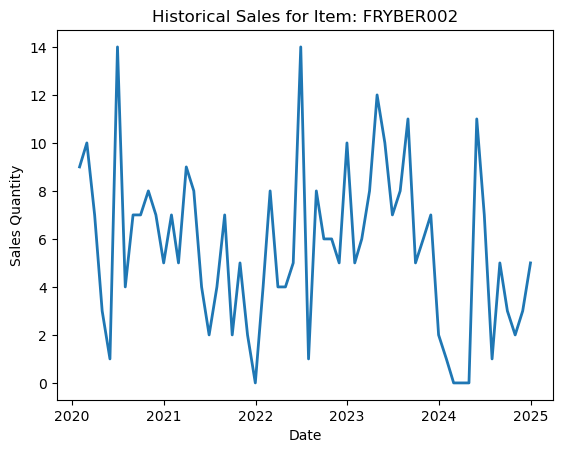

Historical demand for Item: FRYBER003


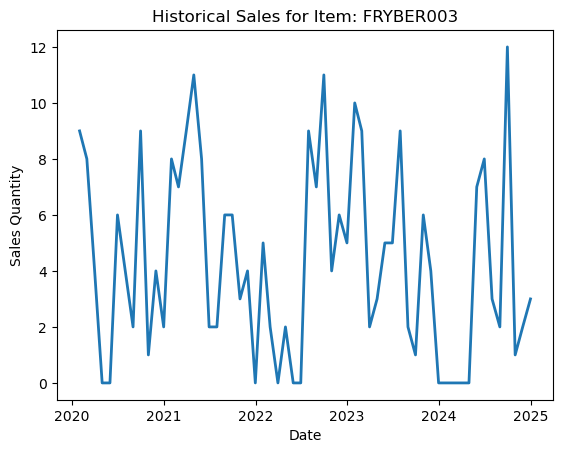

Historical demand for Item: FRYBER005


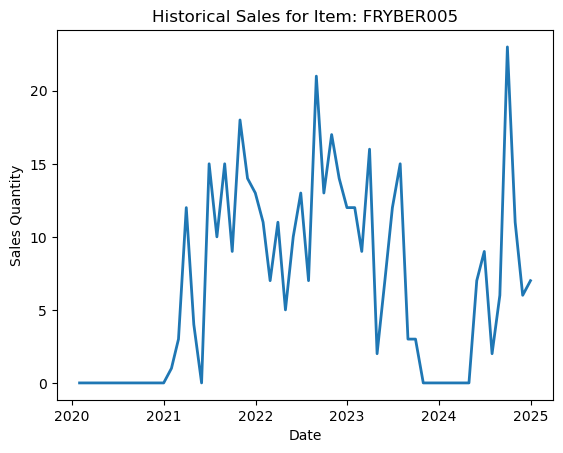

Historical demand for Item: GRLBER003


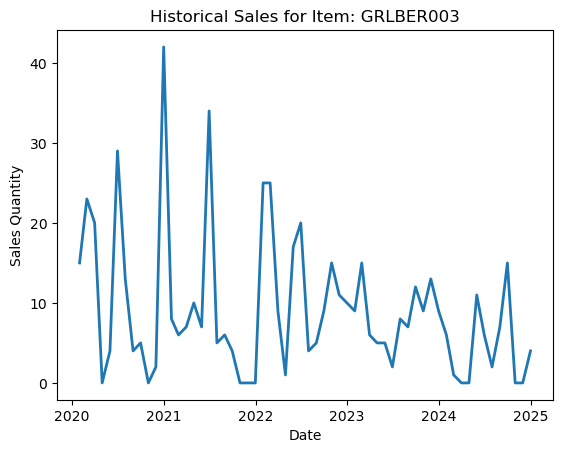

Historical demand for Item: GRLBER004


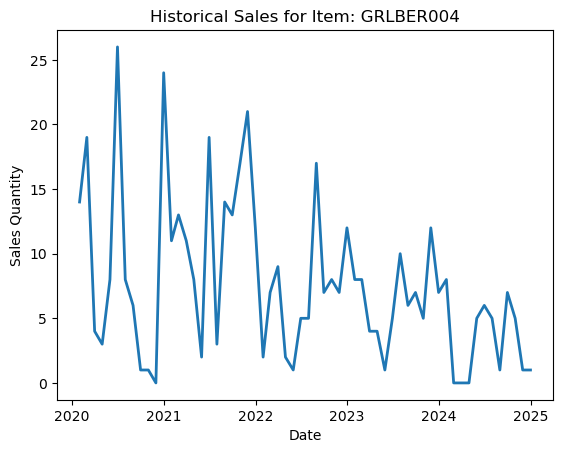

Historical demand for Item: GRLBER009


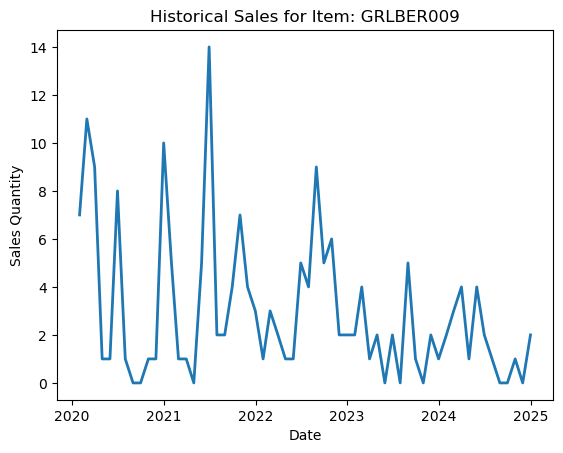

Historical demand for Item: GRLBER010


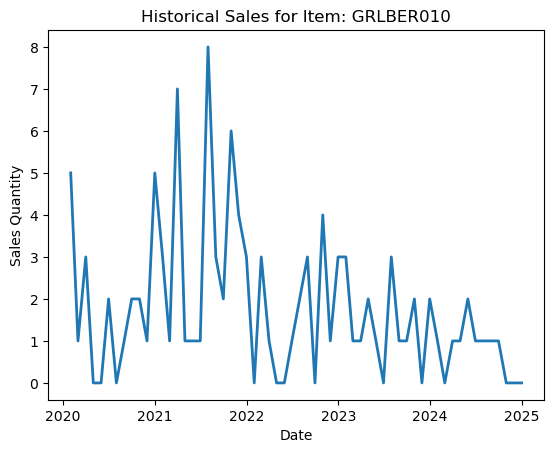

Historical demand for Item: GRLBER011


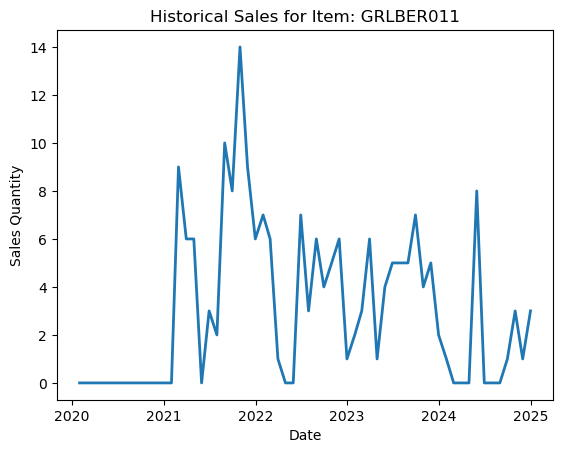

Historical demand for Item: GRLBER012


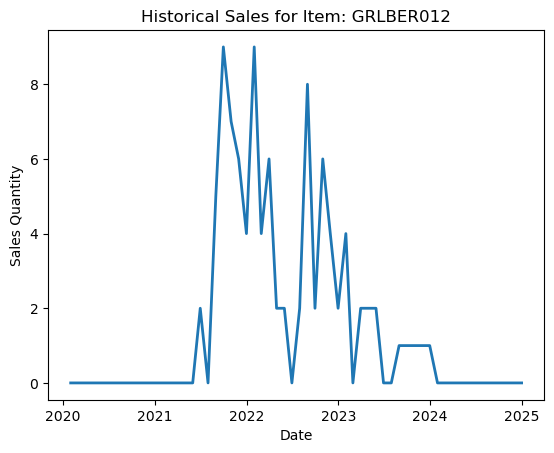

Historical demand for Item: GRLBER015


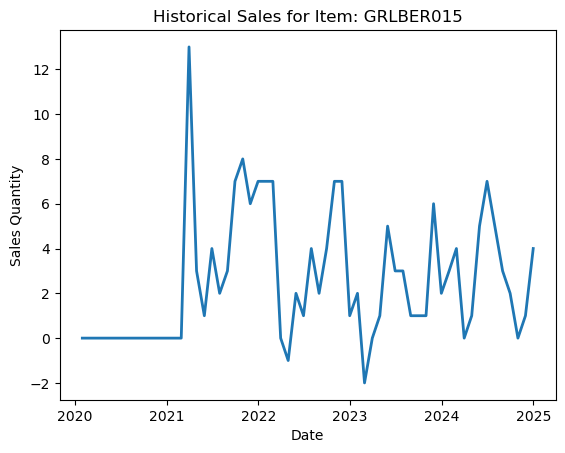

Historical demand for Item: GRLBER019


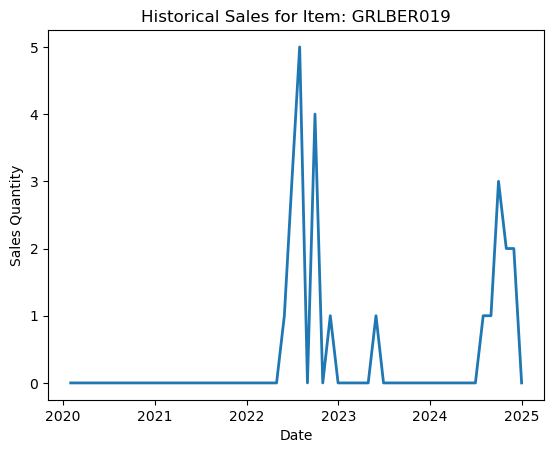

Historical demand for Item: GRLBER020


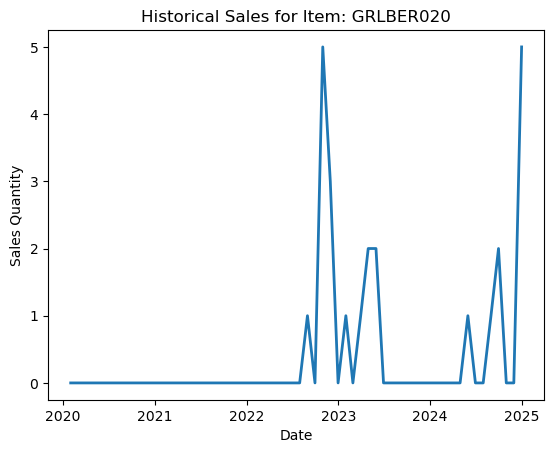

Historical demand for Item: HEABER001


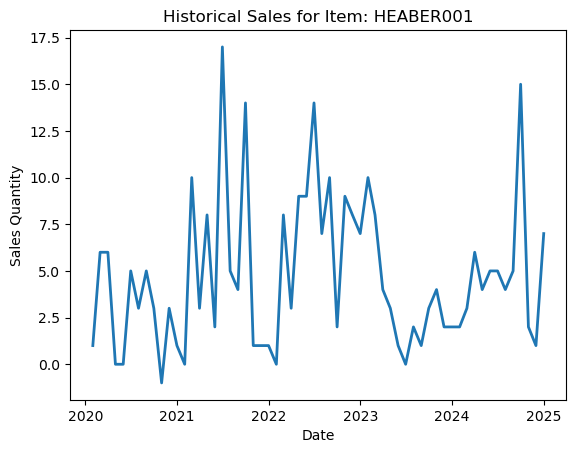

Historical demand for Item: HOTBER001


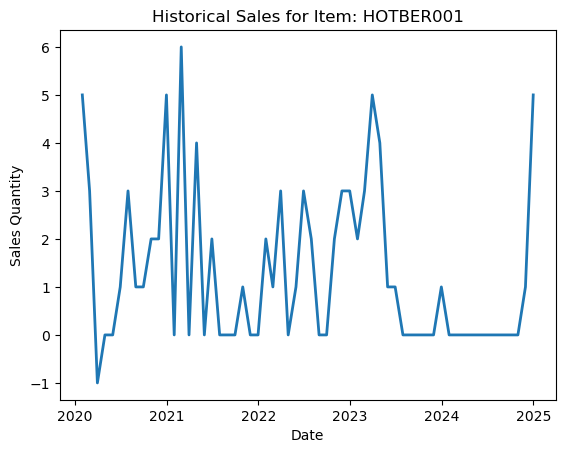

Historical demand for Item: HOTBER002


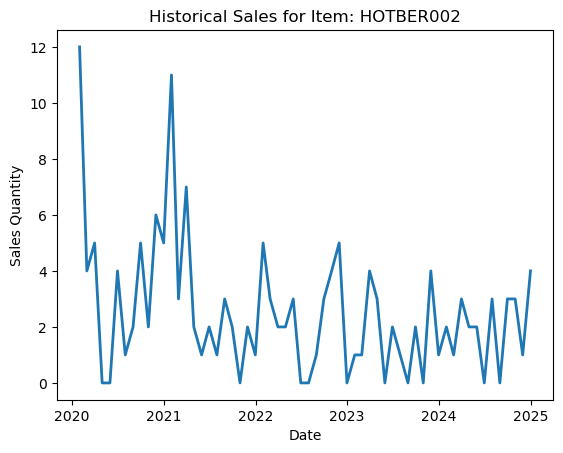

Historical demand for Item: HOTBER003


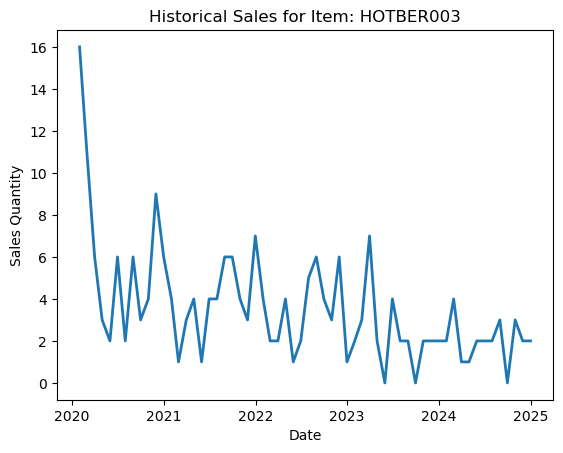

Historical demand for Item: ICMBER002


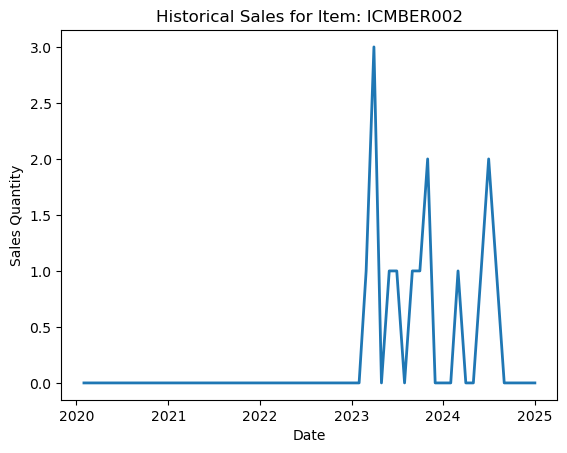

Historical demand for Item: ICMBER003


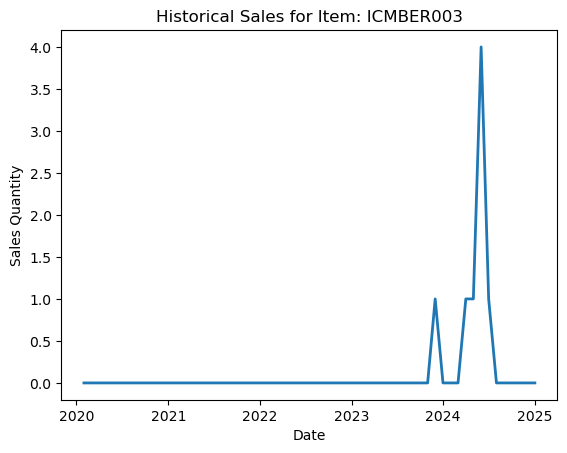

Historical demand for Item: MIXBER001


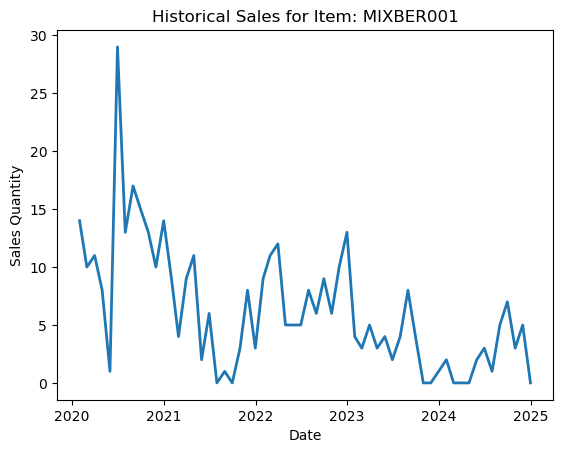

Historical demand for Item: MIXBER003


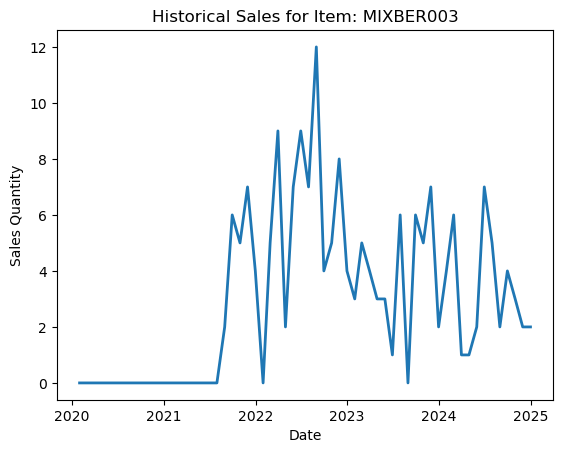

Historical demand for Item: OVEBER002


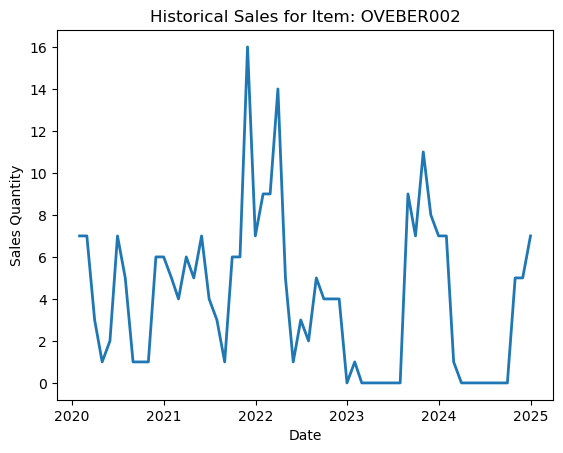

Historical demand for Item: OVEBER005


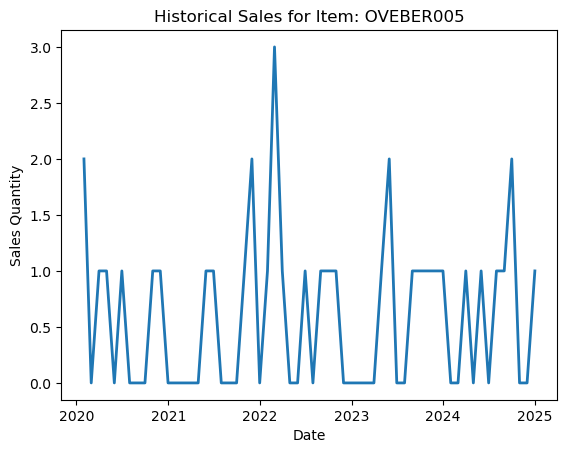

Historical demand for Item: OVEBER006


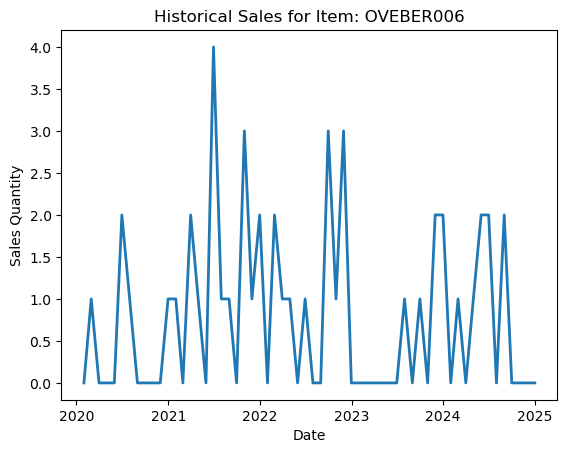

Historical demand for Item: OVEBER011


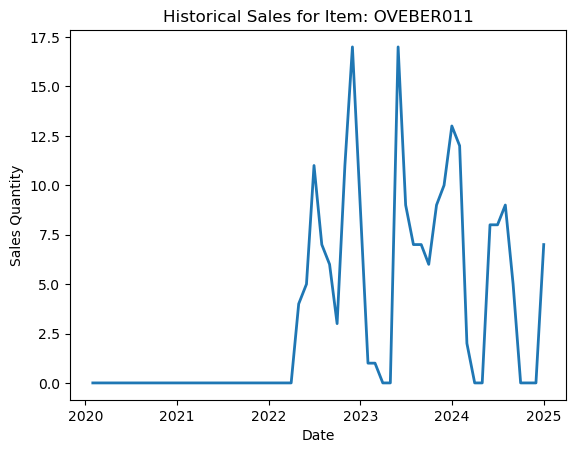

Historical demand for Item: OVEBER012


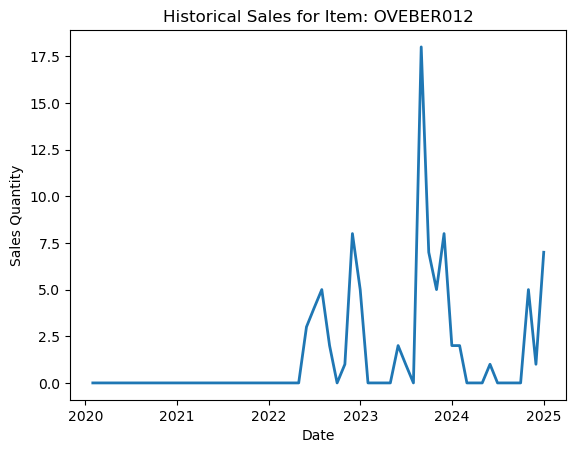

Historical demand for Item: OVEBER013


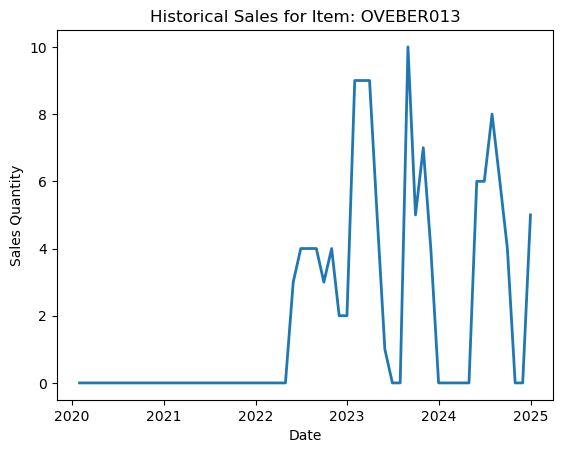

Historical demand for Item: OVEBER014


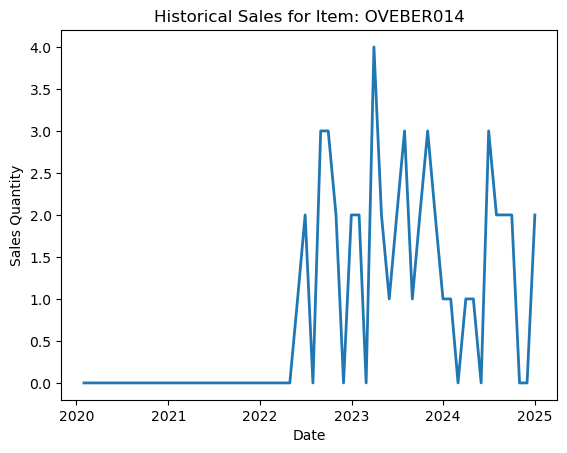

Historical demand for Item: OVEBER015


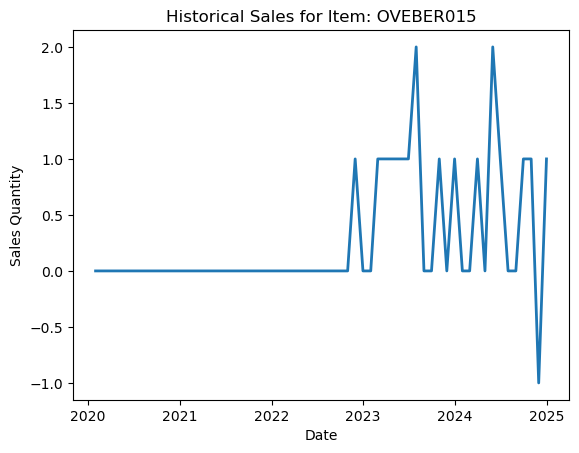

Historical demand for Item: OVEBER016


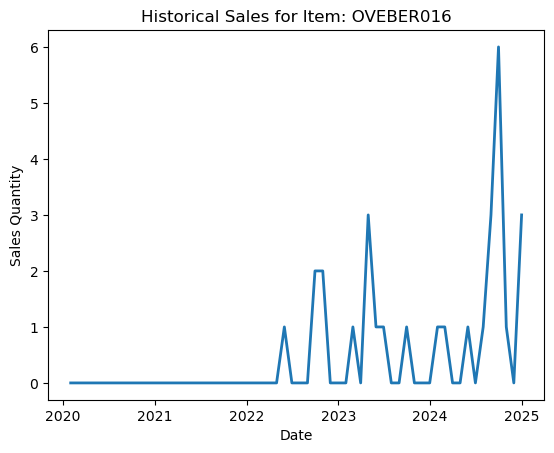

Historical demand for Item: OVEBER017


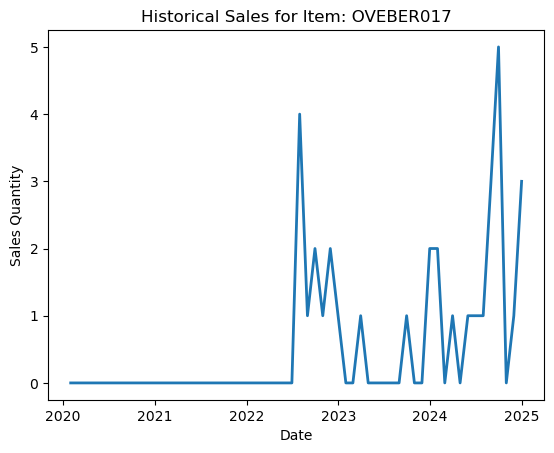

Historical demand for Item: POPBER001


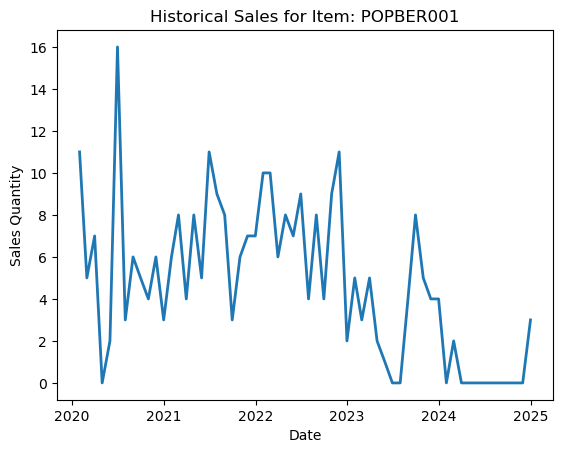

Historical demand for Item: SOPBER001


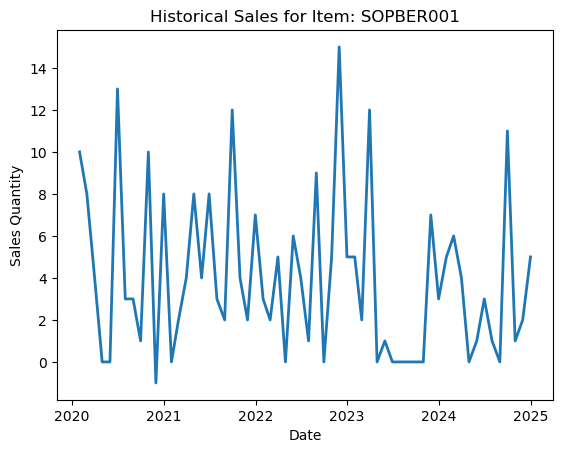

Historical demand for Item: TROBER001


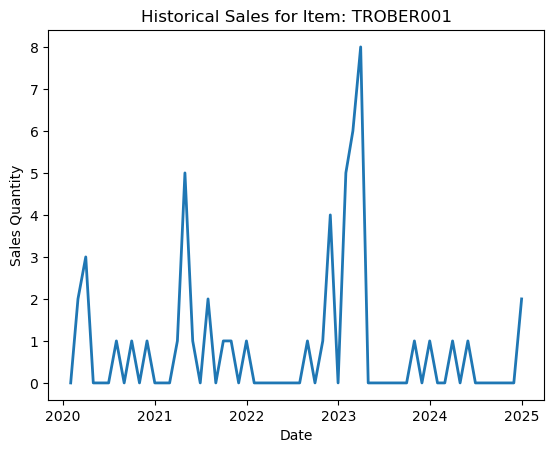

Historical demand for Item: TROBER003


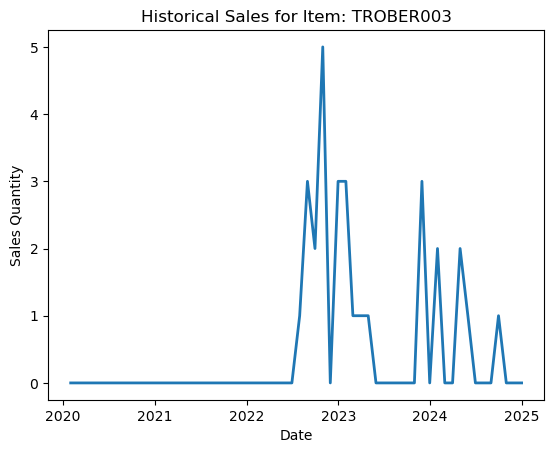

Historical demand for Item: WARBER001


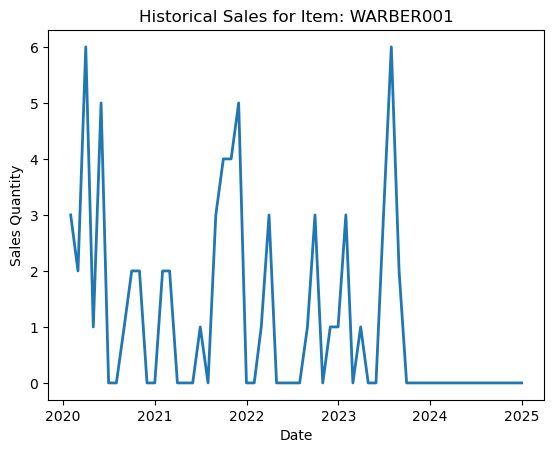

Historical demand for Item: WARBER002


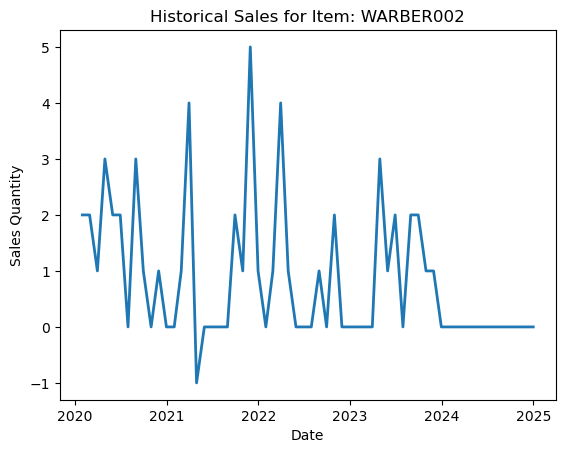

Historical demand for Item: WARBER003


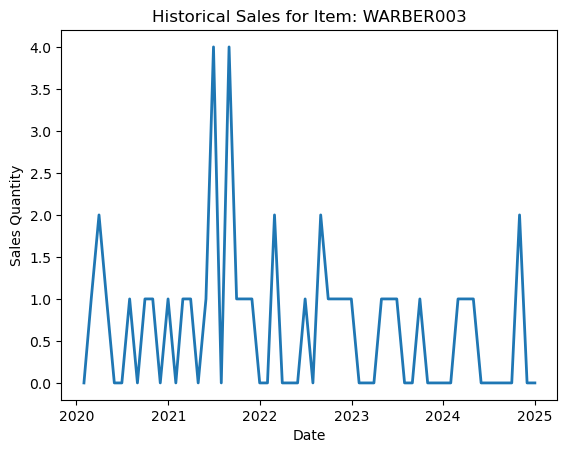

Historical demand for Item: WARBER004


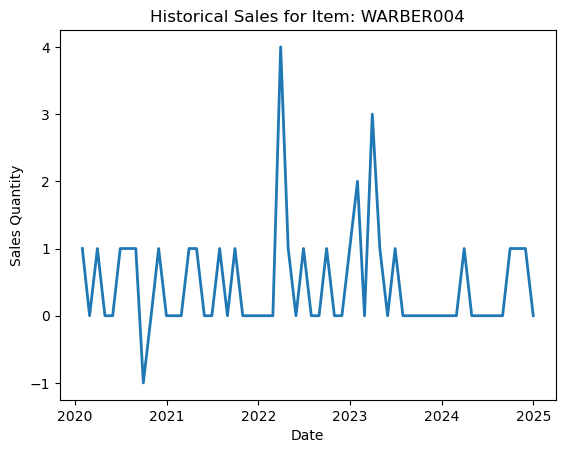

Historical demand for Item: WARBER005


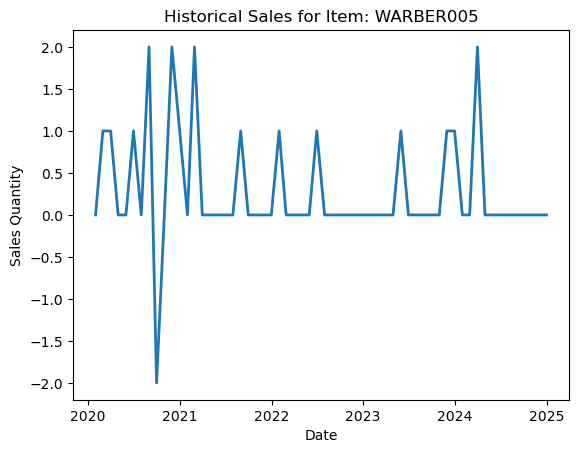

Historical demand for Item: WARBER006


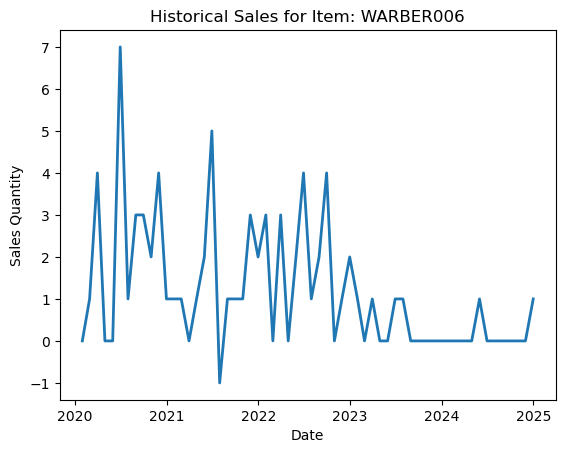

Historical demand for Item: WARBER009


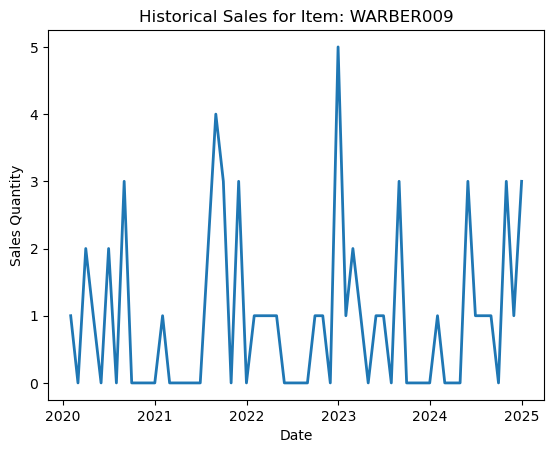

Historical demand for Item: WARBER010


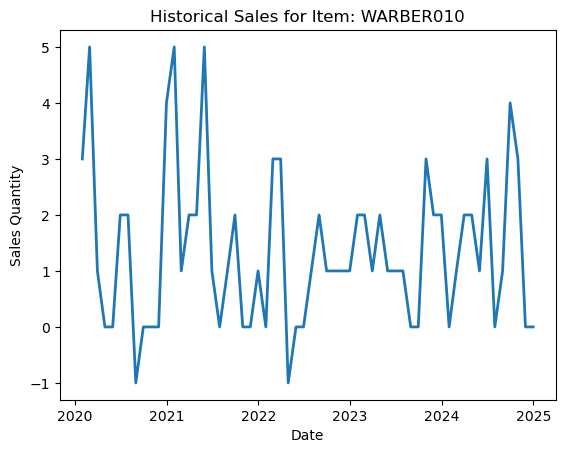

Historical demand for Item: WARBER011


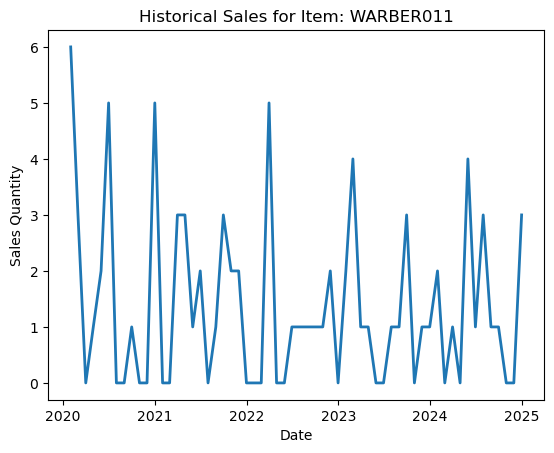

Historical demand for Item: WARBER012


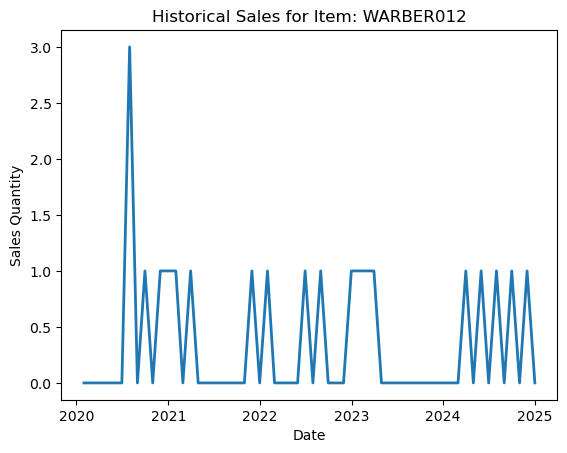

Historical demand for Item: WARBER013


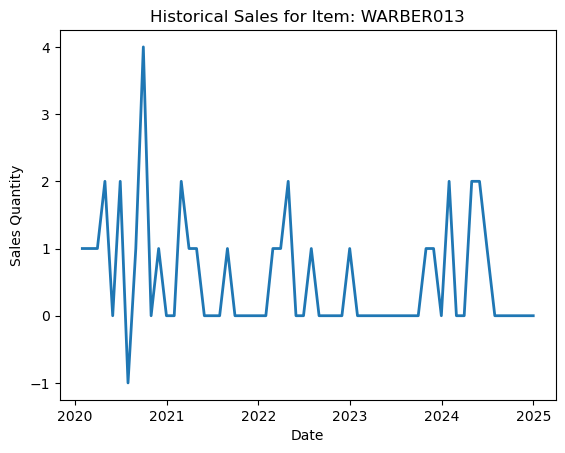

Historical demand for Item: WARBER015


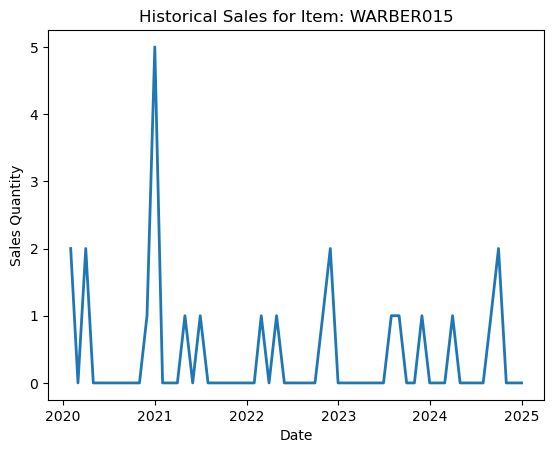

Historical demand for Item: WARBER016


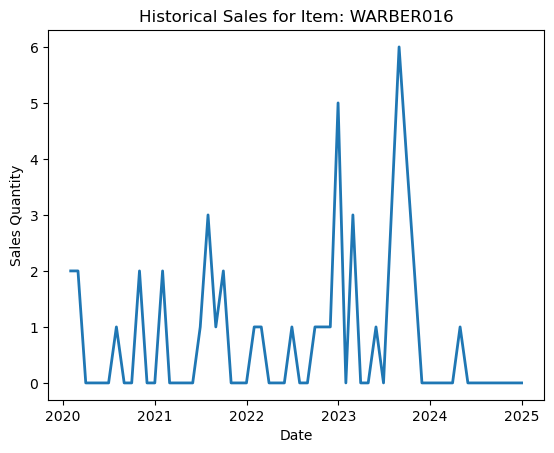

Historical demand for Item: WARBER022


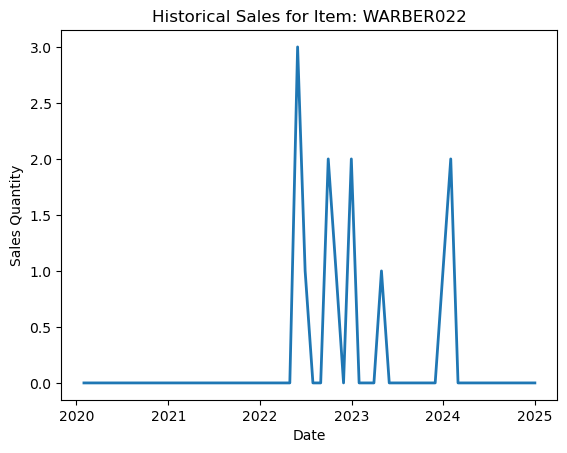

Historical demand for Item: WARBER023


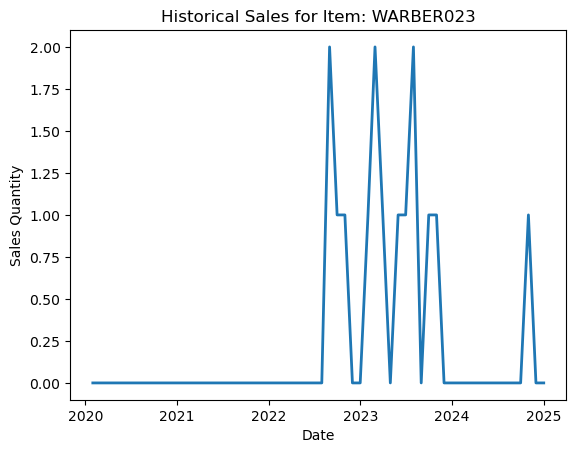

Historical demand for Item: WARBER024


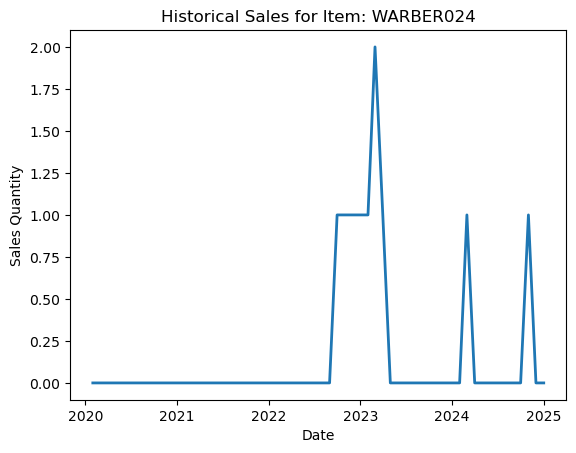

In [29]:
def EDA(ProductNumber, data_filled):
    # Filter data for the specific store and item
    filtered_data = data_filled[(data_filled['ProductNumber'] == ProductNumber)]
    x = filtered_data['month']
    y = filtered_data['Sum of InvoicedQuantity']
    
    # plot
    fig, ax = plt.subplots()
    ax.plot(x, y, linewidth=2.0)

    #plot = (filtered_data)
    plt.title(f"Historical Sales for Item: {ProductNumber}")
    plt.xlabel("Date")
    plt.ylabel("Sales Quantity")
    plt.show()
    
    return filtered_data

item_combinations = data_filled[['ProductNumber']].drop_duplicates()

for _, row in item_combinations.iterrows():
    ProductNumber = row['ProductNumber']
    print(f"Historical demand for Item: {ProductNumber}")
    Historical = EDA(ProductNumber, data_filled)
    

## XGBoost Feature engineering and forecasting

Forecasting for Item: BOLBER001
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 0.06 seconds


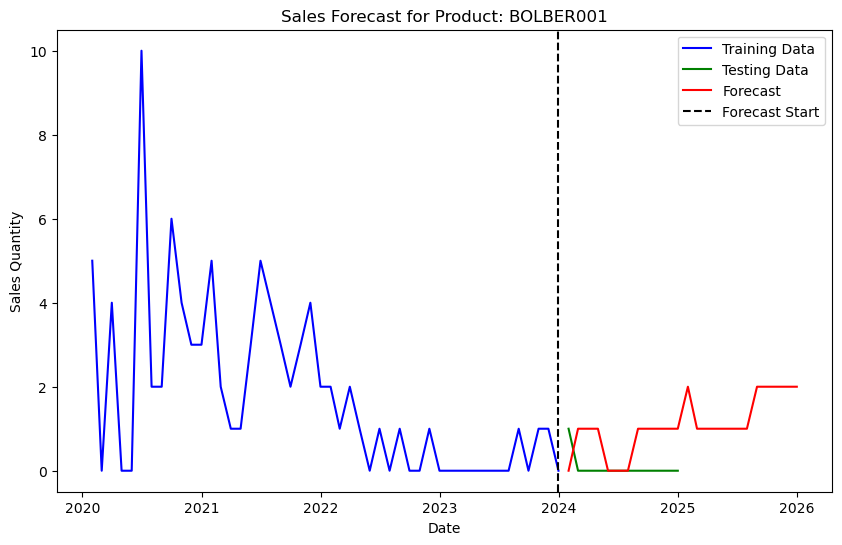

Forecasting for Item: BOLBER002
MAE: 1.6666666666666667, MSE: 3.5, RMSE: 1.8708286933869707
Execution time: 0.07 seconds


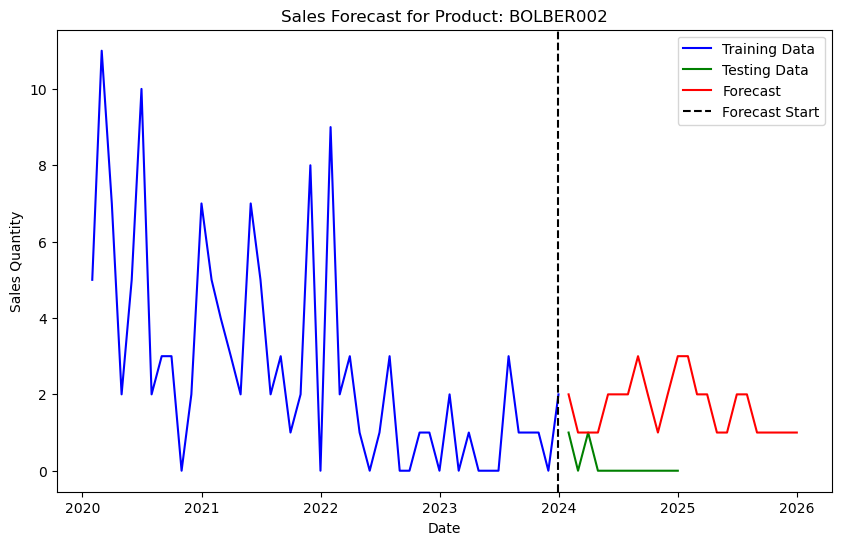

Forecasting for Item: BOLBER003
MAE: 2.25, MSE: 8.25, RMSE: 2.8722813232690143
Execution time: 0.05 seconds


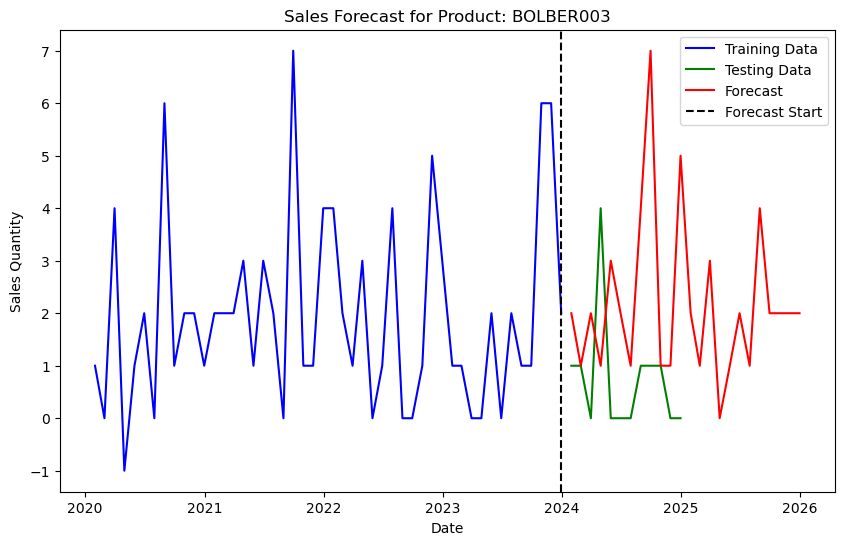

Forecasting for Item: BOLBER005
MAE: 0.9166666666666666, MSE: 1.0833333333333333, RMSE: 1.0408329997330663
Execution time: 0.05 seconds


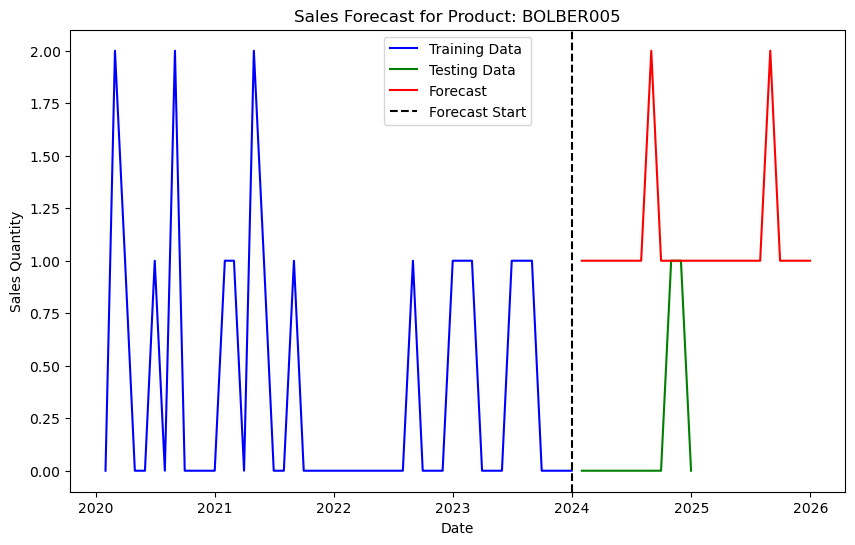

Forecasting for Item: BURBER001
MAE: 0.5, MSE: 0.5, RMSE: 0.7071067811865476
Execution time: 0.06 seconds


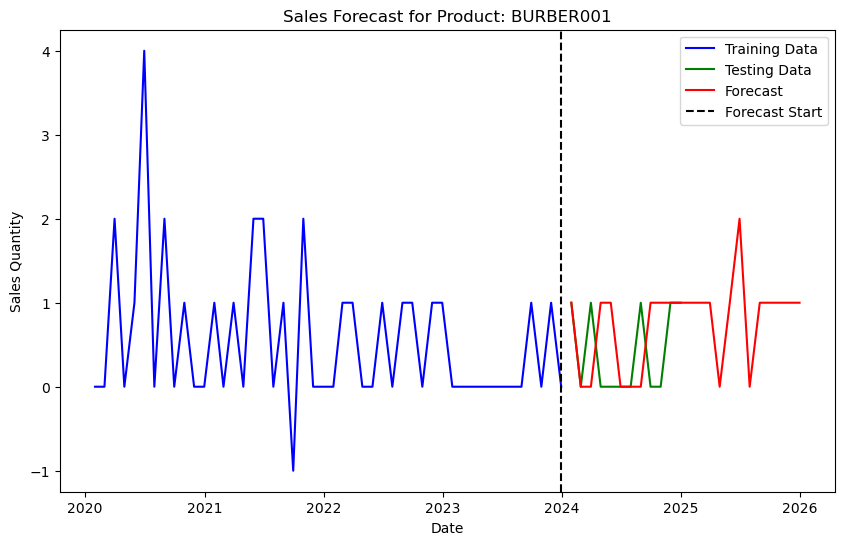

Forecasting for Item: BURBER002
MAE: 1.0833333333333333, MSE: 2.5833333333333335, RMSE: 1.6072751268321592
Execution time: 0.06 seconds


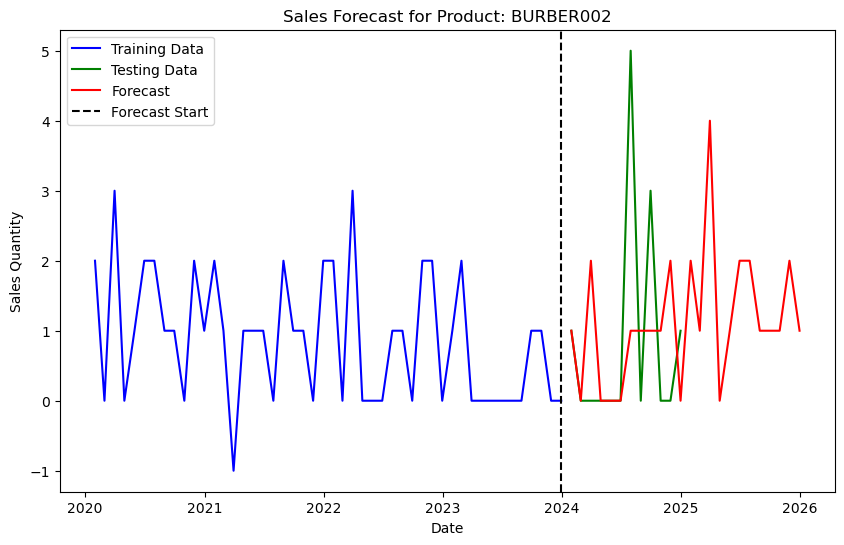

Forecasting for Item: BURBER003
MAE: 1.4166666666666667, MSE: 2.9166666666666665, RMSE: 1.707825127659933
Execution time: 0.05 seconds


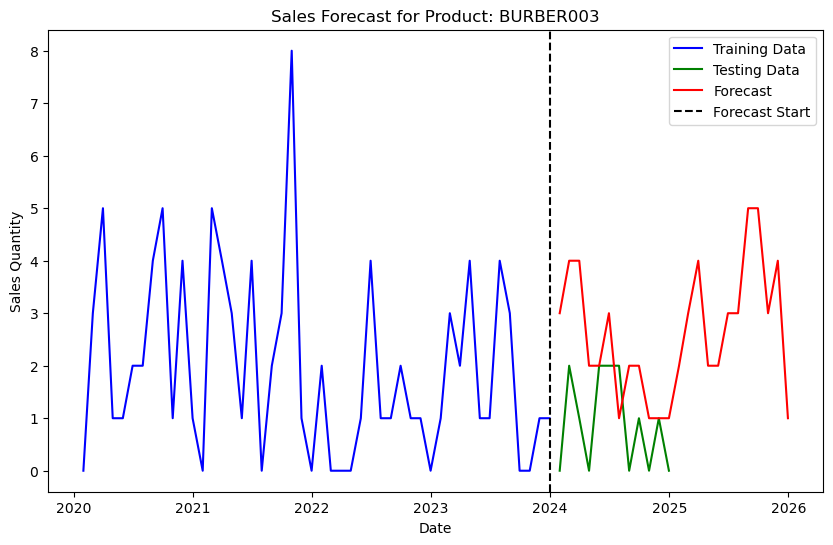

Forecasting for Item: BURBER004
MAE: 1.75, MSE: 4.583333333333333, RMSE: 2.140872096444188
Execution time: 0.05 seconds


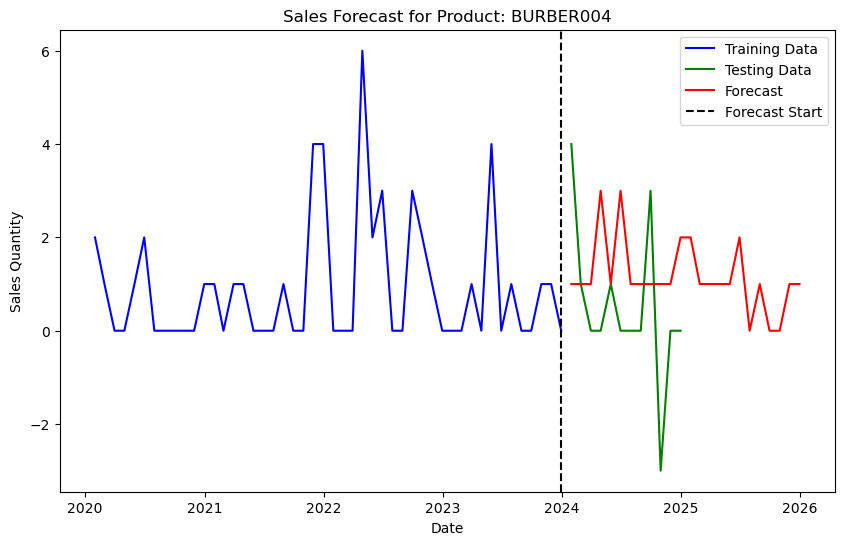

Forecasting for Item: BURBER007
MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 0.04 seconds


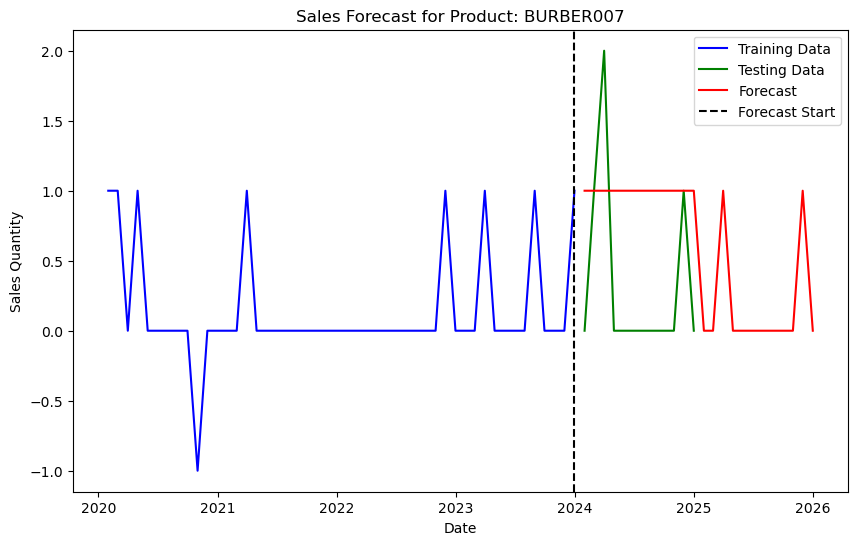

Forecasting for Item: COFBER001
MAE: 11.666666666666666, MSE: 175.16666666666666, RMSE: 13.235054464061214
Execution time: 0.05 seconds


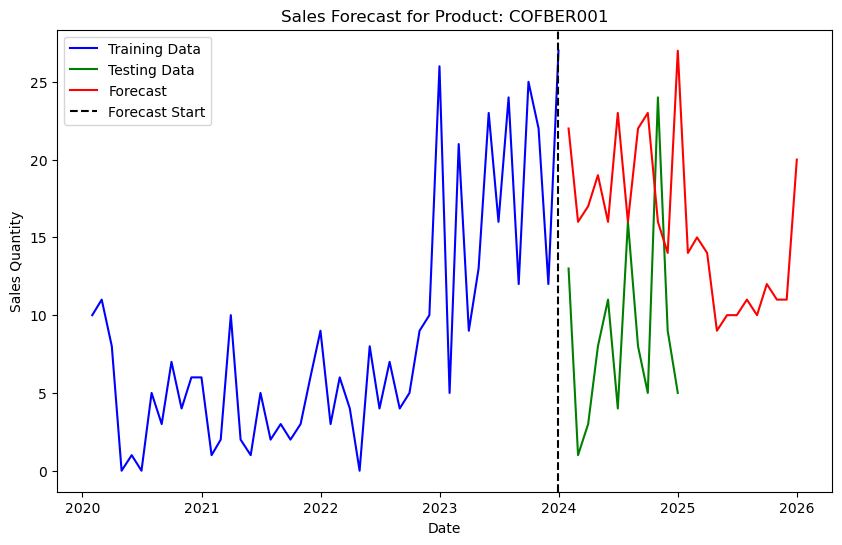

Forecasting for Item: COKBER001
MAE: 8.166666666666666, MSE: 92.83333333333333, RMSE: 9.635005621863089
Execution time: 0.06 seconds


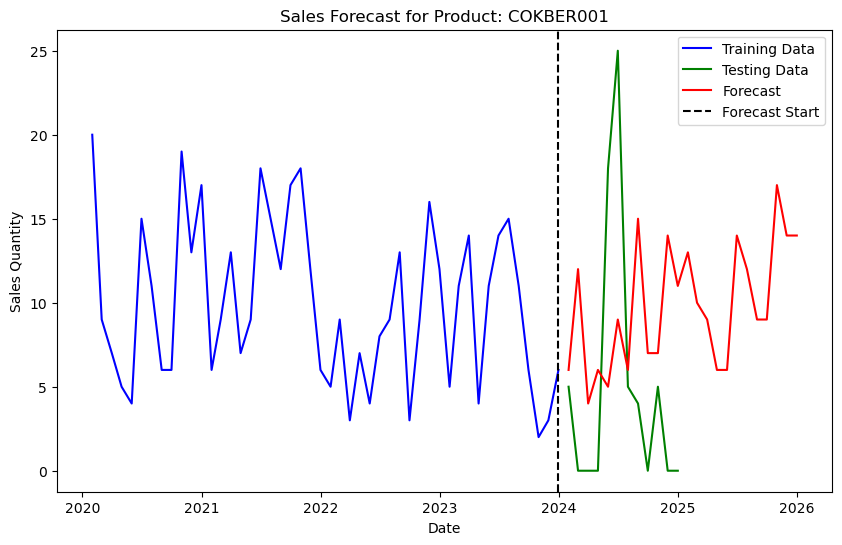

Forecasting for Item: FRYBER002
MAE: 5.583333333333333, MSE: 35.75, RMSE: 5.979130371550699
Execution time: 0.05 seconds


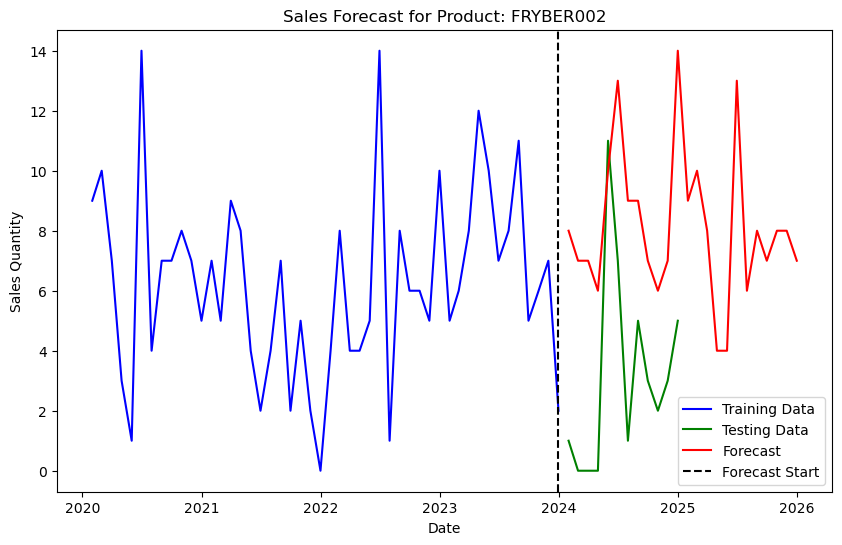

Forecasting for Item: FRYBER003
MAE: 4.583333333333333, MSE: 28.583333333333332, RMSE: 5.346338310781813
Execution time: 0.06 seconds


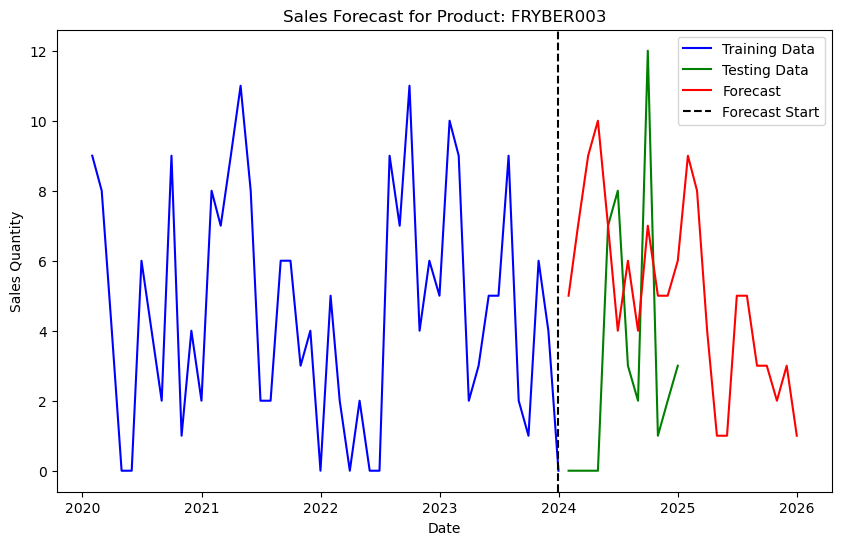

Forecasting for Item: FRYBER005
MAE: 7.833333333333333, MSE: 102.33333333333333, RMSE: 10.115993936995679
Execution time: 0.07 seconds


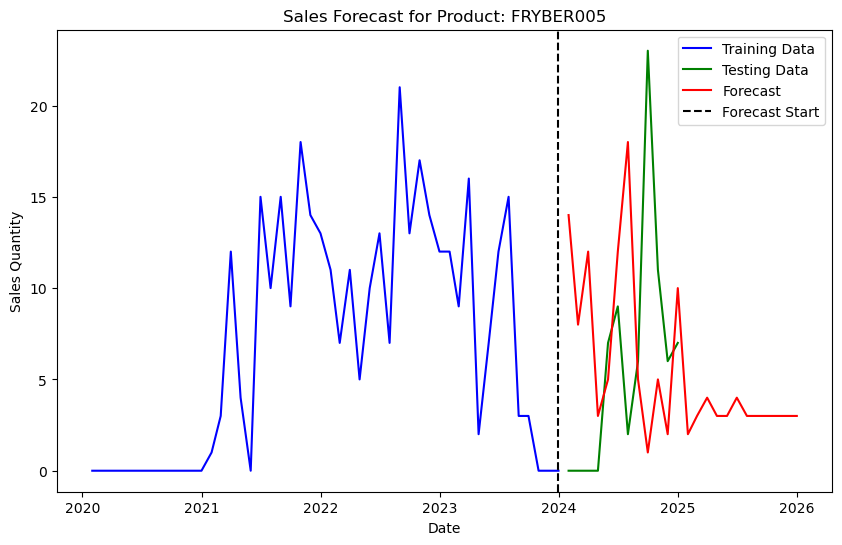

Forecasting for Item: GRLBER003
MAE: 6.0, MSE: 51.333333333333336, RMSE: 7.164728420068226
Execution time: 0.07 seconds


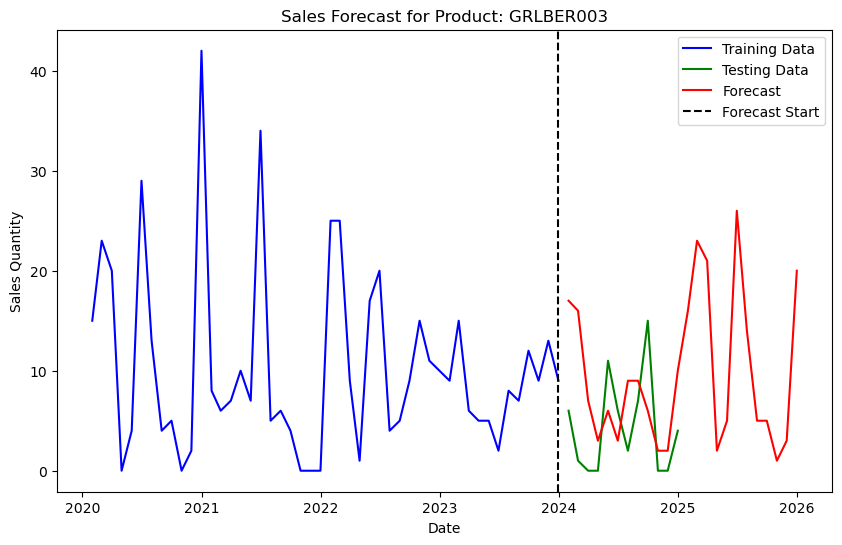

Forecasting for Item: GRLBER004
MAE: 3.5833333333333335, MSE: 19.916666666666668, RMSE: 4.4628092796652945
Execution time: 0.06 seconds


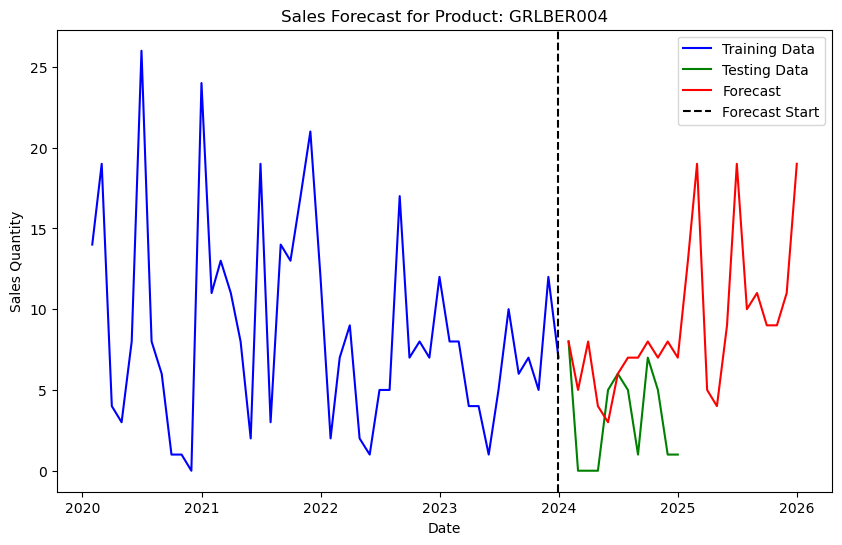

Forecasting for Item: GRLBER009
MAE: 1.0833333333333333, MSE: 2.25, RMSE: 1.5
Execution time: 0.06 seconds


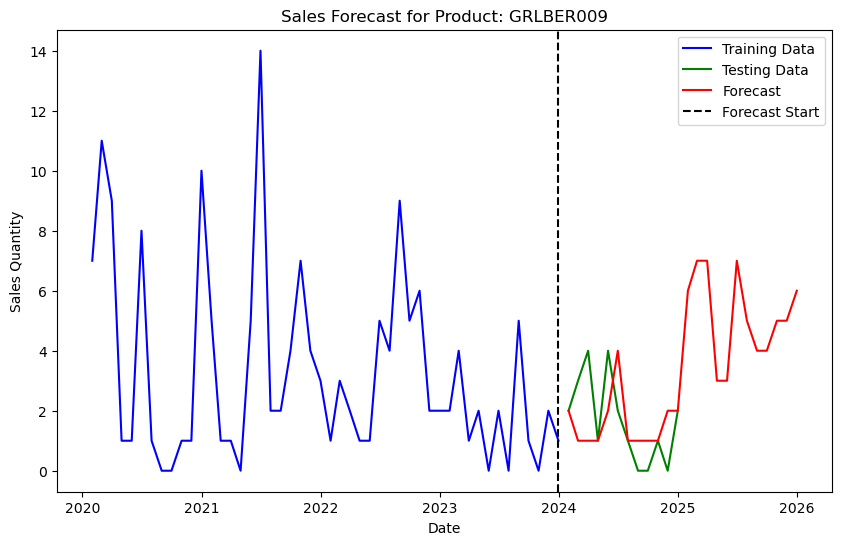

Forecasting for Item: GRLBER010
MAE: 1.0, MSE: 1.5, RMSE: 1.224744871391589
Execution time: 0.08 seconds


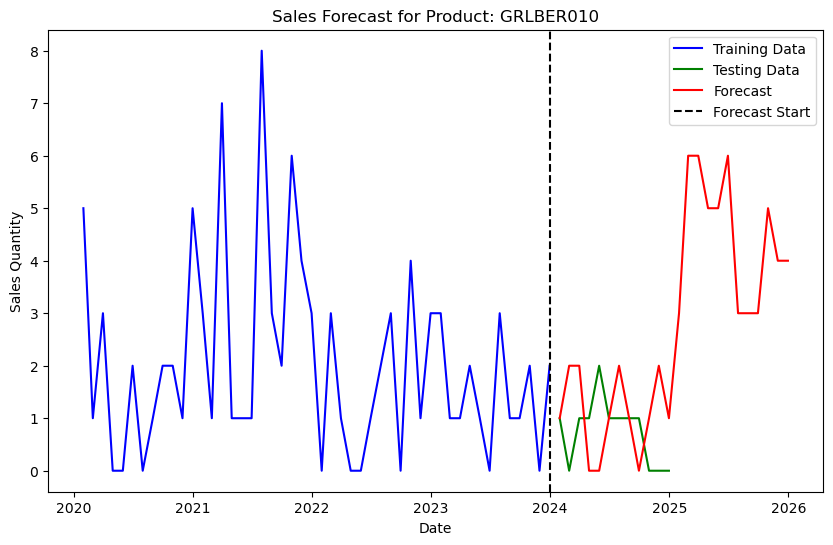

Forecasting for Item: GRLBER011
MAE: 4.333333333333333, MSE: 22.166666666666668, RMSE: 4.708148963941845
Execution time: 0.06 seconds


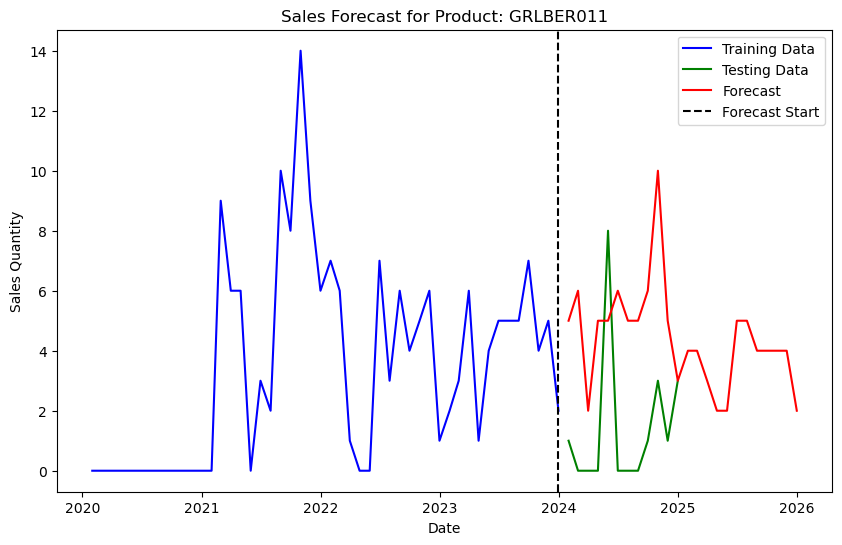

Forecasting for Item: GRLBER012
MAE: 1.6666666666666667, MSE: 3.8333333333333335, RMSE: 1.9578900207451218
Execution time: 0.06 seconds


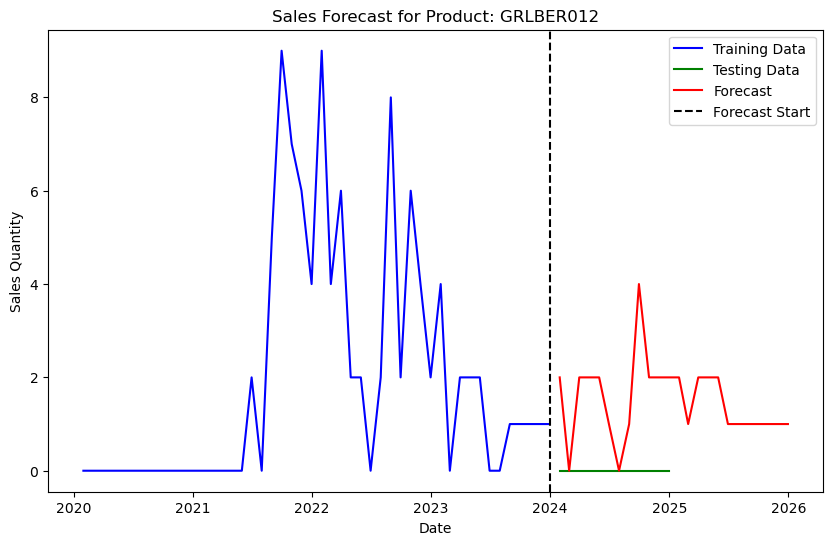

Forecasting for Item: GRLBER015
MAE: 2.25, MSE: 7.25, RMSE: 2.692582403567252
Execution time: 0.06 seconds


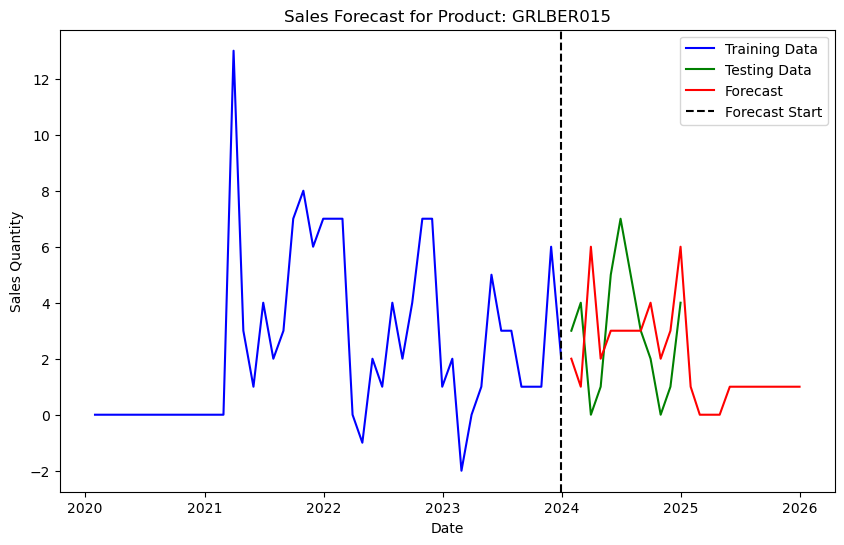

Forecasting for Item: GRLBER019
MAE: 1.0, MSE: 1.3333333333333333, RMSE: 1.1547005383792515
Execution time: 0.05 seconds


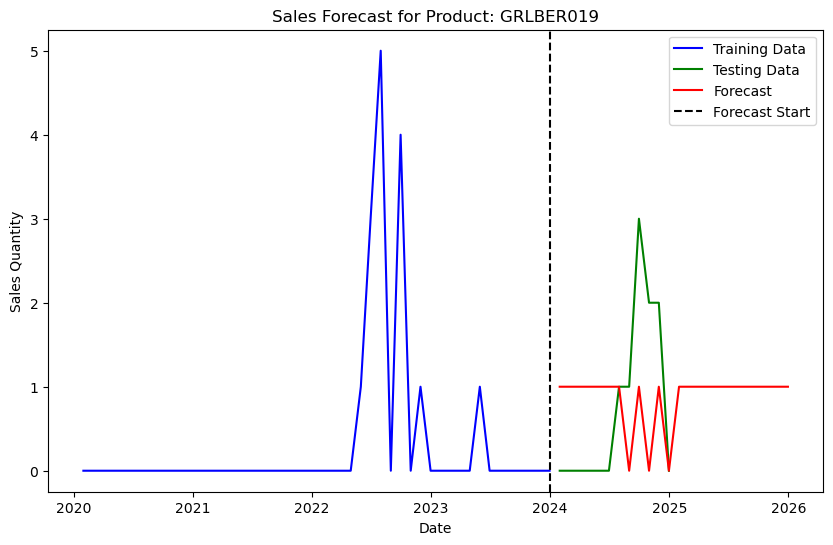

Forecasting for Item: GRLBER020
MAE: 1.4166666666666667, MSE: 3.4166666666666665, RMSE: 1.848422751068236
Execution time: 0.05 seconds


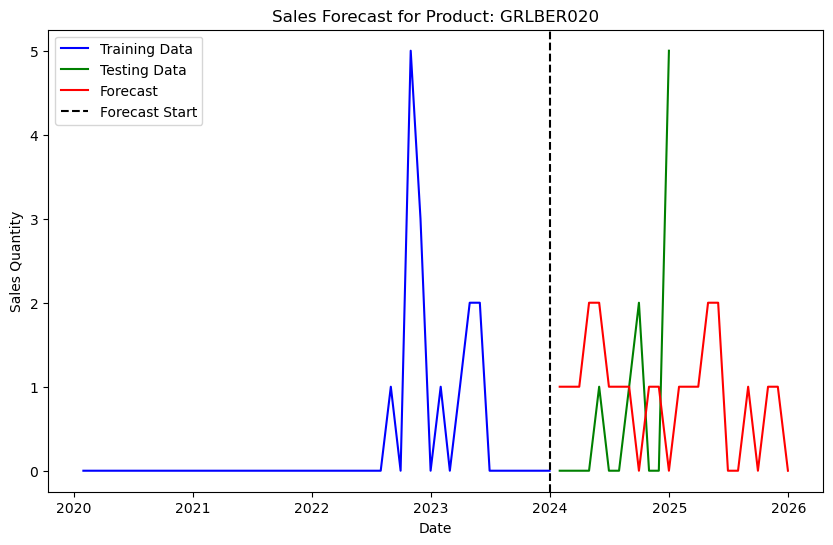

Forecasting for Item: HEABER001
MAE: 3.5833333333333335, MSE: 17.25, RMSE: 4.153311931459037
Execution time: 0.07 seconds


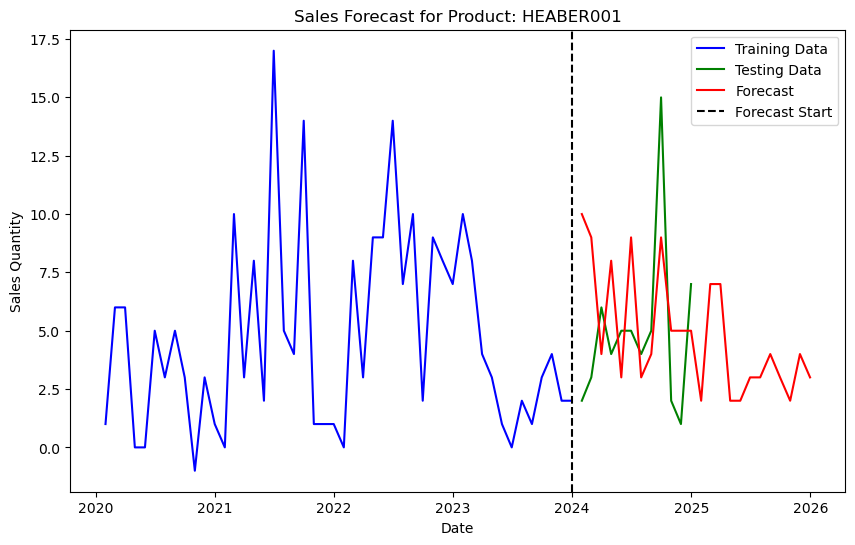

Forecasting for Item: HOTBER001
MAE: 2.1666666666666665, MSE: 6.166666666666667, RMSE: 2.48327740429189
Execution time: 0.07 seconds


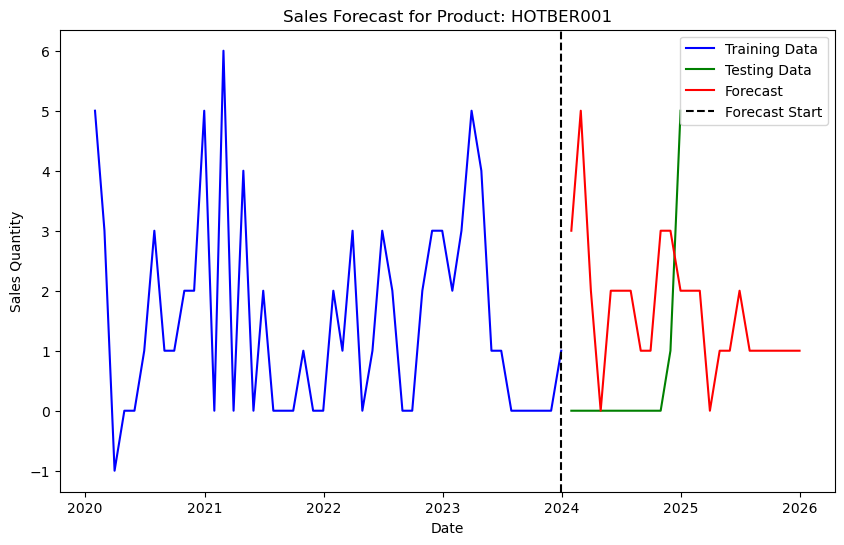

Forecasting for Item: HOTBER002
MAE: 1.1666666666666667, MSE: 2.1666666666666665, RMSE: 1.4719601443879744
Execution time: 0.06 seconds


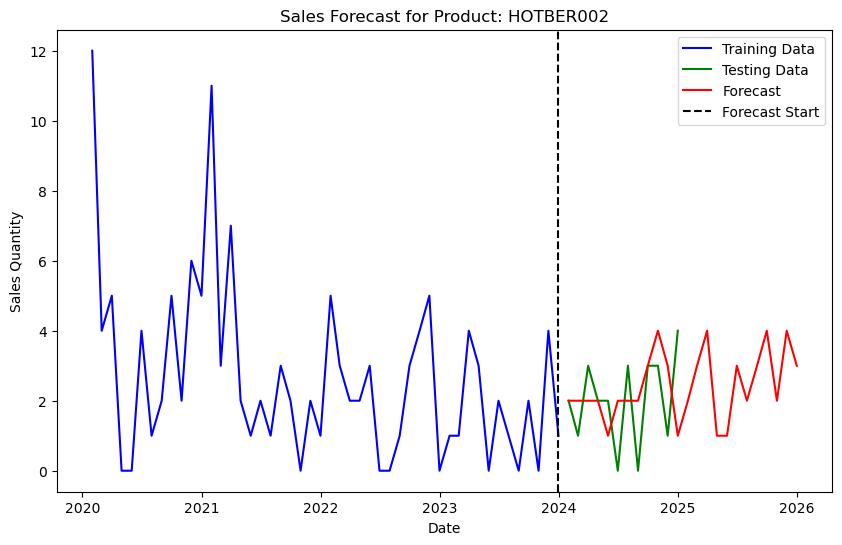

Forecasting for Item: HOTBER003
MAE: 1.6666666666666667, MSE: 3.8333333333333335, RMSE: 1.9578900207451218
Execution time: 0.06 seconds


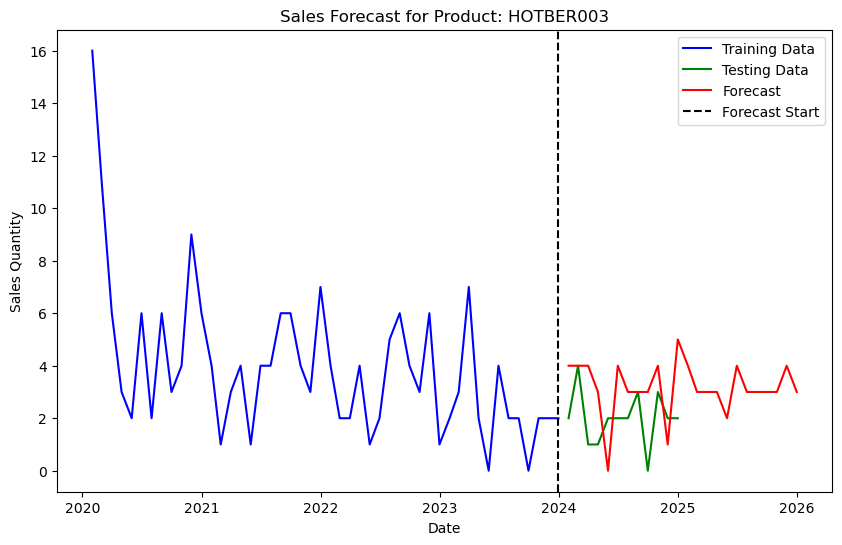

Forecasting for Item: ICMBER002
MAE: 1.1666666666666667, MSE: 2.1666666666666665, RMSE: 1.4719601443879744
Execution time: 0.05 seconds


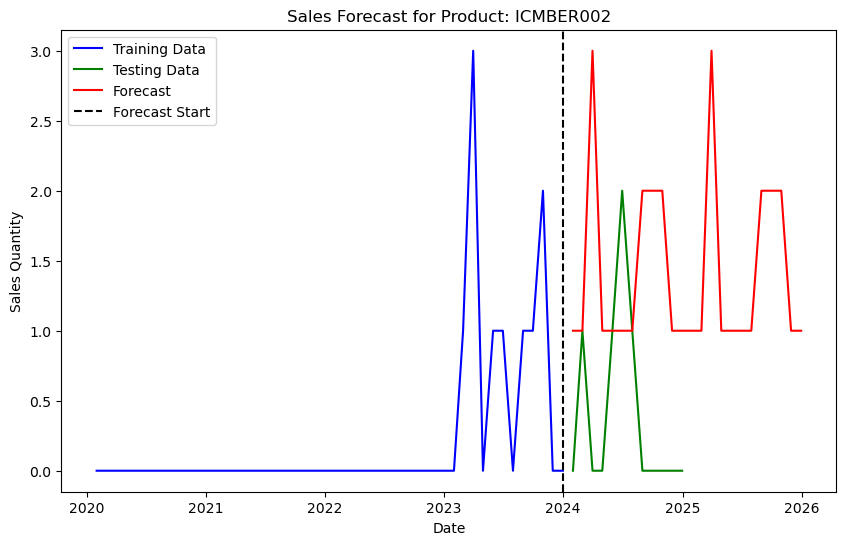

Forecasting for Item: ICMBER003
MAE: 0.9166666666666666, MSE: 1.4166666666666667, RMSE: 1.1902380714238083
Execution time: 0.04 seconds


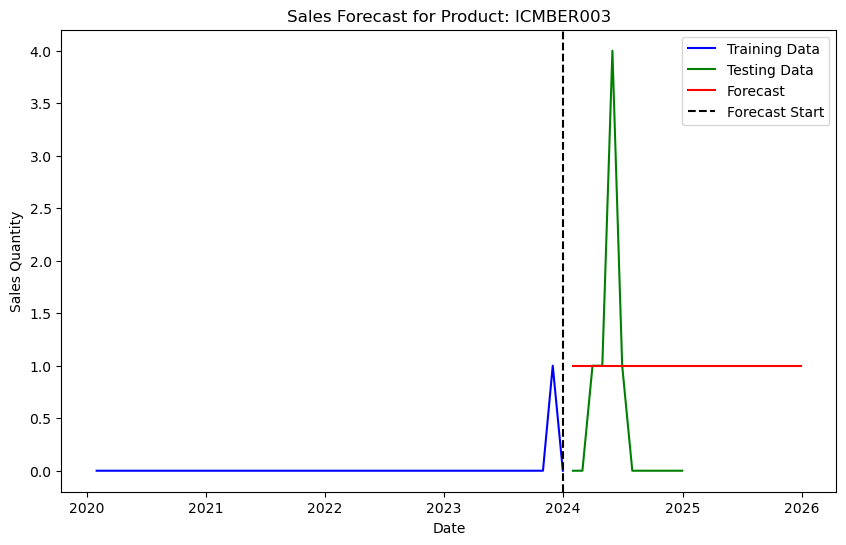

Forecasting for Item: MIXBER001
MAE: 2.3333333333333335, MSE: 8.333333333333334, RMSE: 2.886751345948129
Execution time: 0.06 seconds


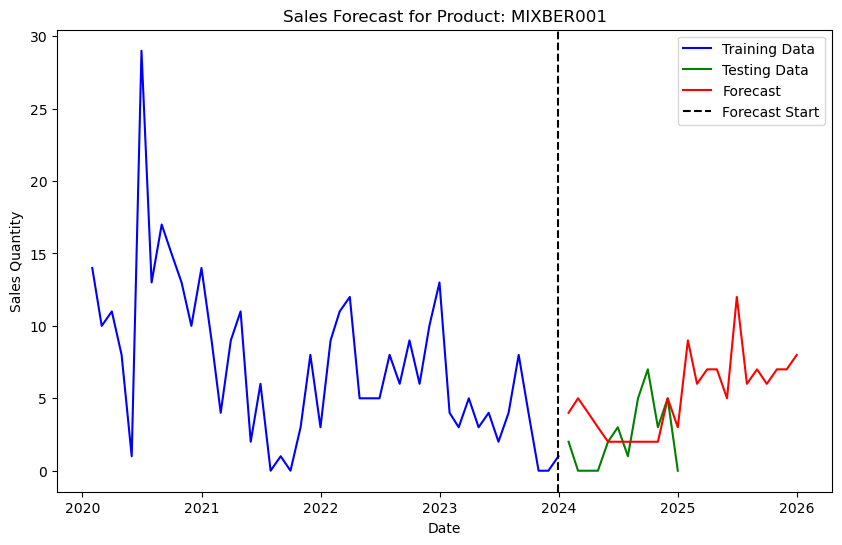

Forecasting for Item: MIXBER003
MAE: 2.4166666666666665, MSE: 11.083333333333334, RMSE: 3.3291640592396967
Execution time: 0.06 seconds


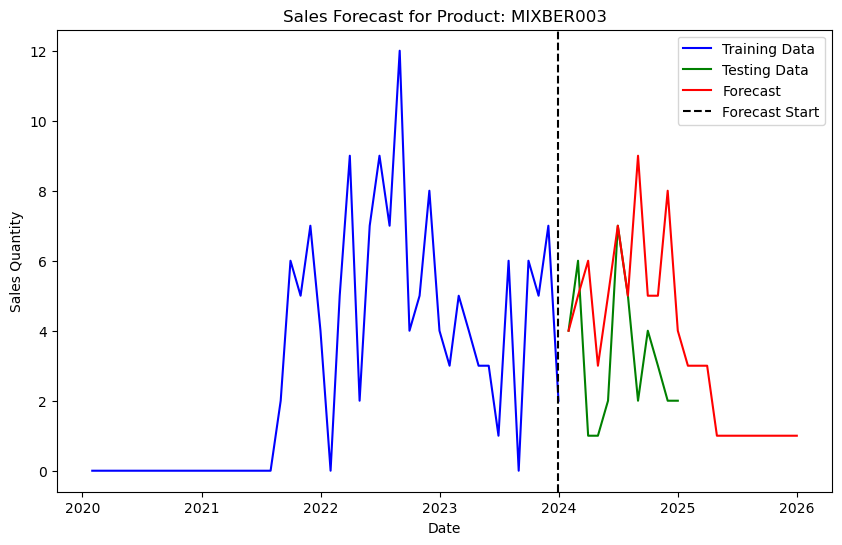

Forecasting for Item: OVEBER002
MAE: 2.5833333333333335, MSE: 9.916666666666666, RMSE: 3.1490739379485304
Execution time: 0.06 seconds


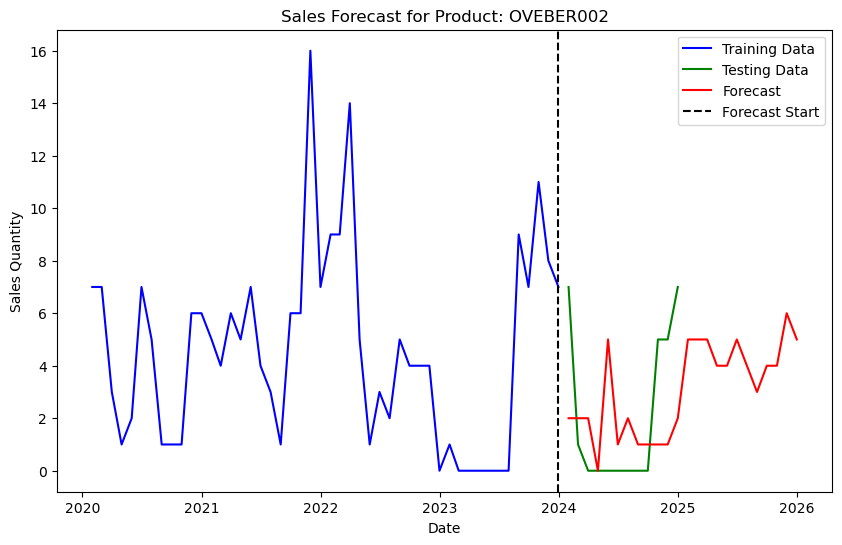

Forecasting for Item: OVEBER005
MAE: 1.0833333333333333, MSE: 1.4166666666666667, RMSE: 1.1902380714238083
Execution time: 0.06 seconds


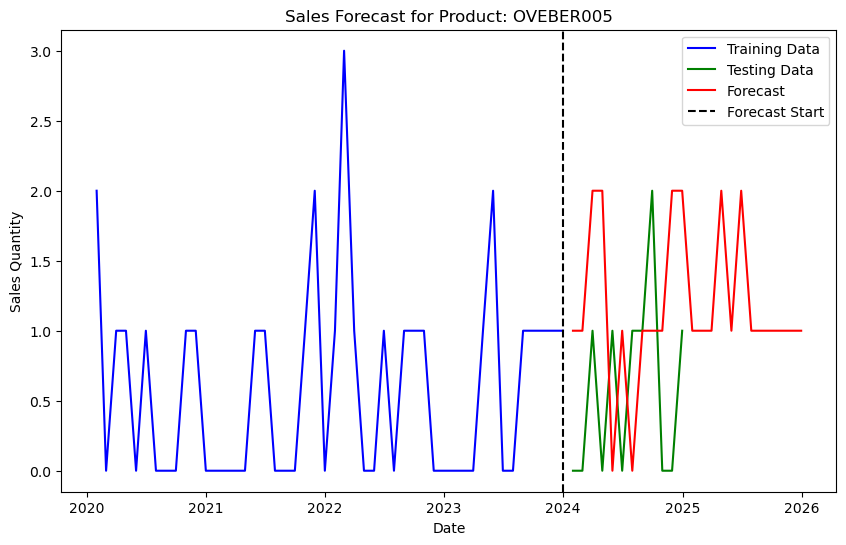

Forecasting for Item: OVEBER006
MAE: 1.0833333333333333, MSE: 1.75, RMSE: 1.3228756555322954
Execution time: 0.05 seconds


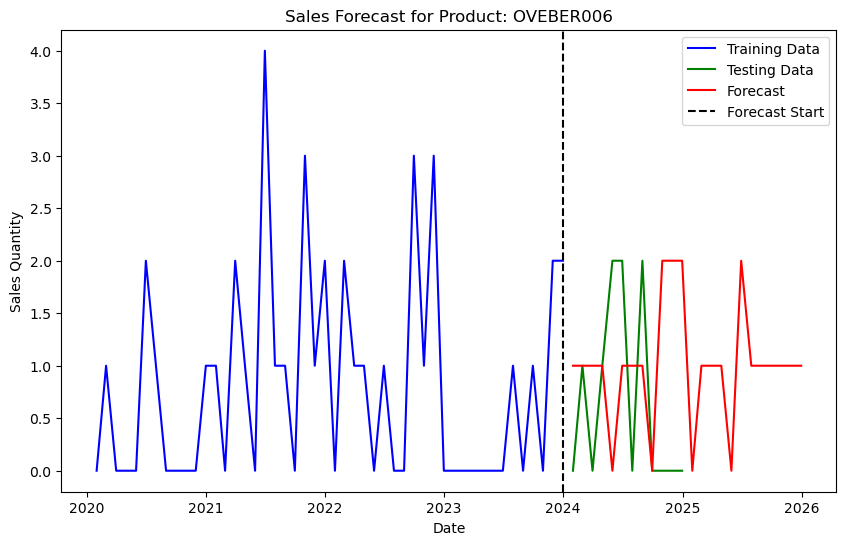

Forecasting for Item: OVEBER011
MAE: 5.166666666666667, MSE: 43.5, RMSE: 6.59545297913646
Execution time: 0.06 seconds


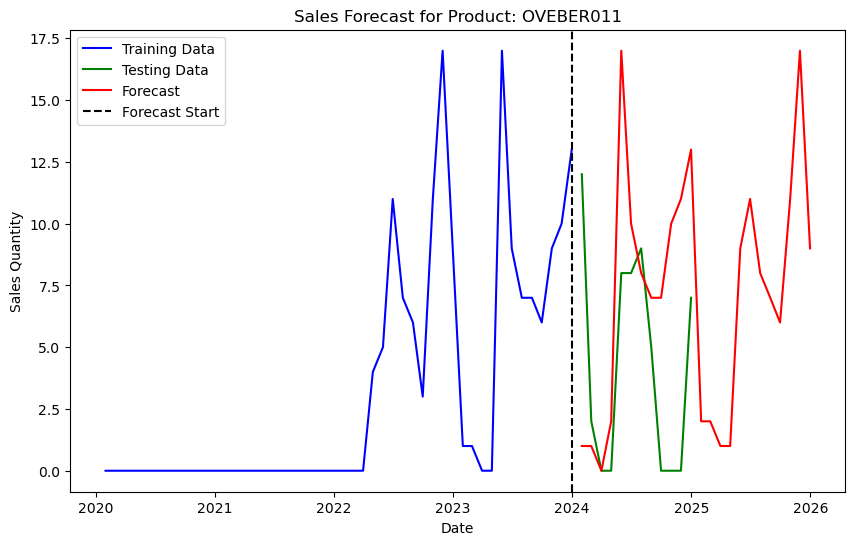

Forecasting for Item: OVEBER012
MAE: 4.5, MSE: 35.333333333333336, RMSE: 5.94418483337567
Execution time: 0.05 seconds


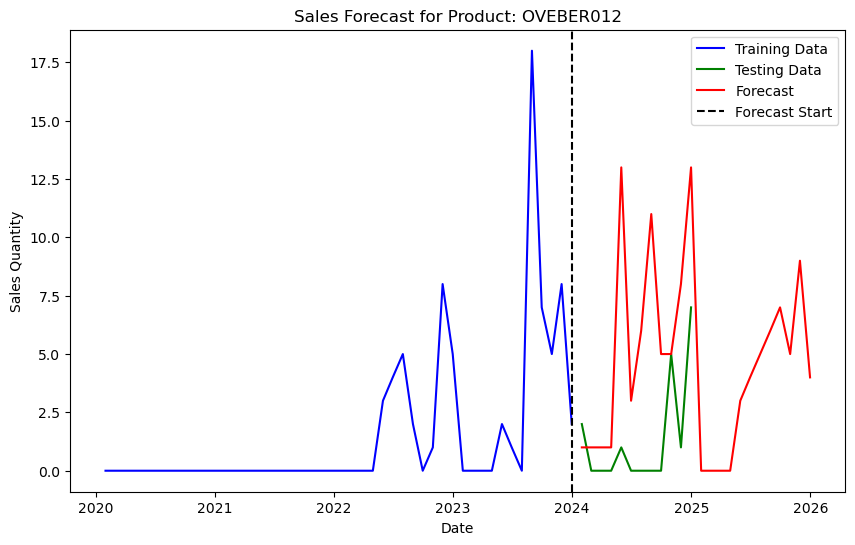

Forecasting for Item: OVEBER013
MAE: 6.166666666666667, MSE: 42.166666666666664, RMSE: 6.493586579592718
Execution time: 0.05 seconds


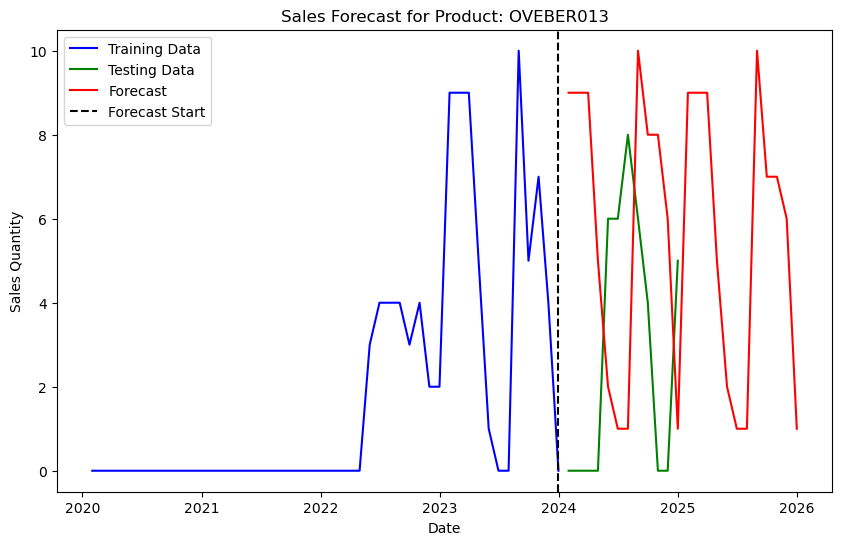

Forecasting for Item: OVEBER014
MAE: 1.1666666666666667, MSE: 2.0, RMSE: 1.4142135623730951
Execution time: 0.05 seconds


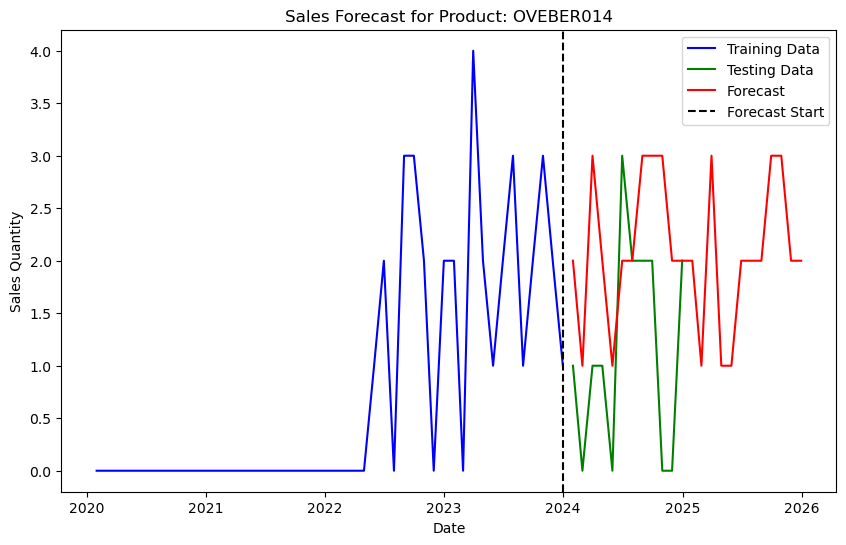

Forecasting for Item: OVEBER015
MAE: 0.75, MSE: 1.0833333333333333, RMSE: 1.0408329997330663
Execution time: 0.05 seconds


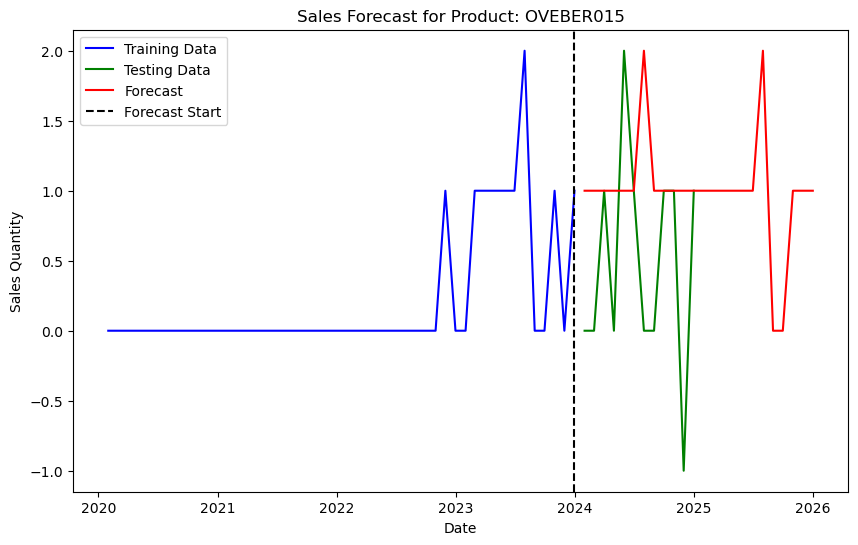

Forecasting for Item: OVEBER016
MAE: 1.3333333333333333, MSE: 4.166666666666667, RMSE: 2.041241452319315
Execution time: 0.05 seconds


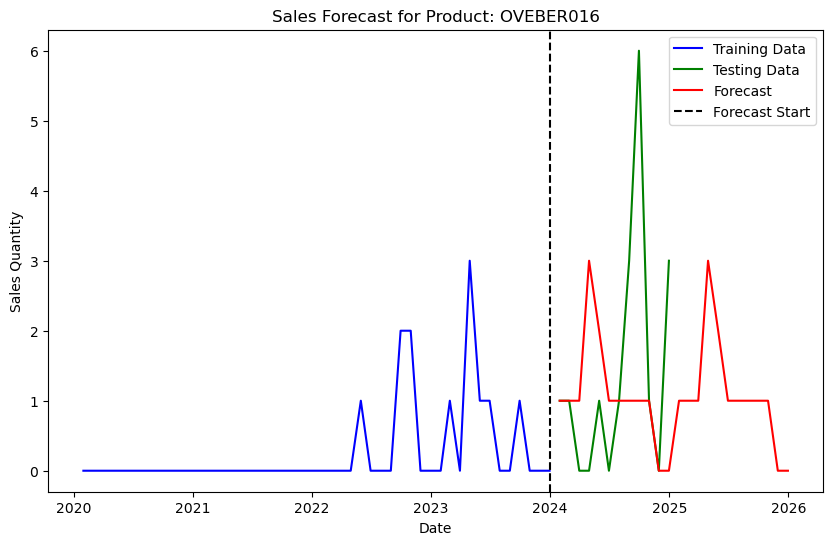

Forecasting for Item: OVEBER017
MAE: 0.8333333333333334, MSE: 1.8333333333333333, RMSE: 1.35400640077266
Execution time: 0.05 seconds


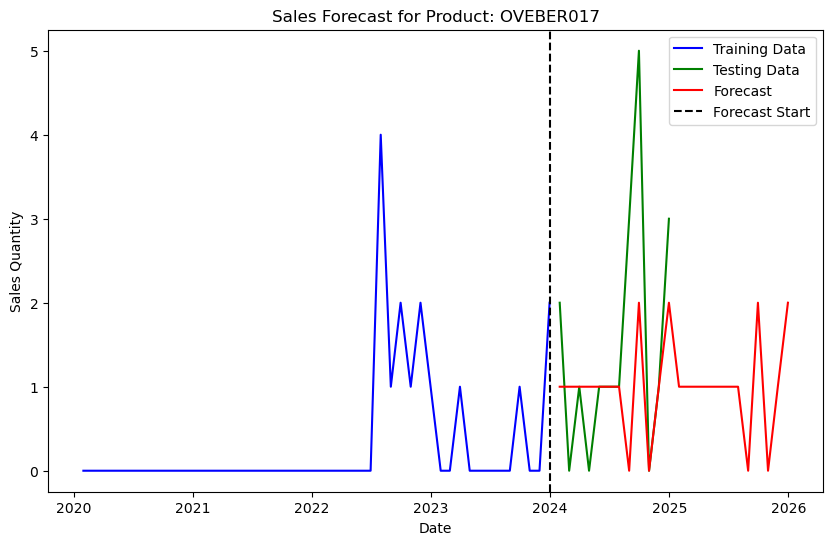

Forecasting for Item: POPBER001
MAE: 3.25, MSE: 13.75, RMSE: 3.7080992435478315
Execution time: 0.06 seconds


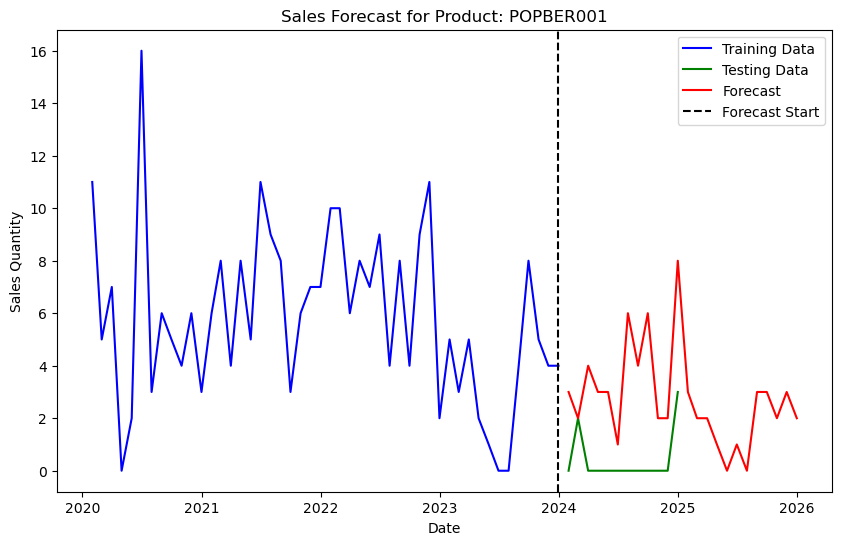

Forecasting for Item: SOPBER001
MAE: 2.5833333333333335, MSE: 9.083333333333334, RMSE: 3.013856886670854
Execution time: 0.07 seconds


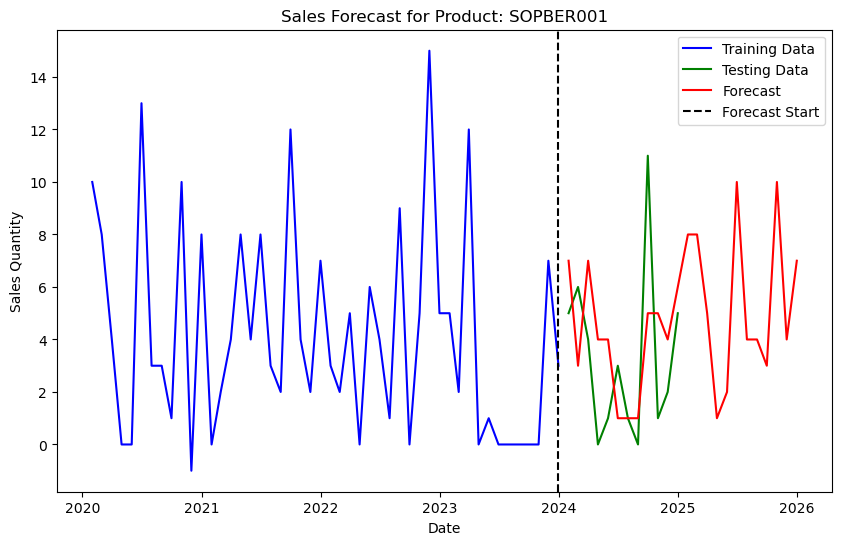

Forecasting for Item: TROBER001
MAE: 2.1666666666666665, MSE: 10.666666666666666, RMSE: 3.265986323710904
Execution time: 0.05 seconds


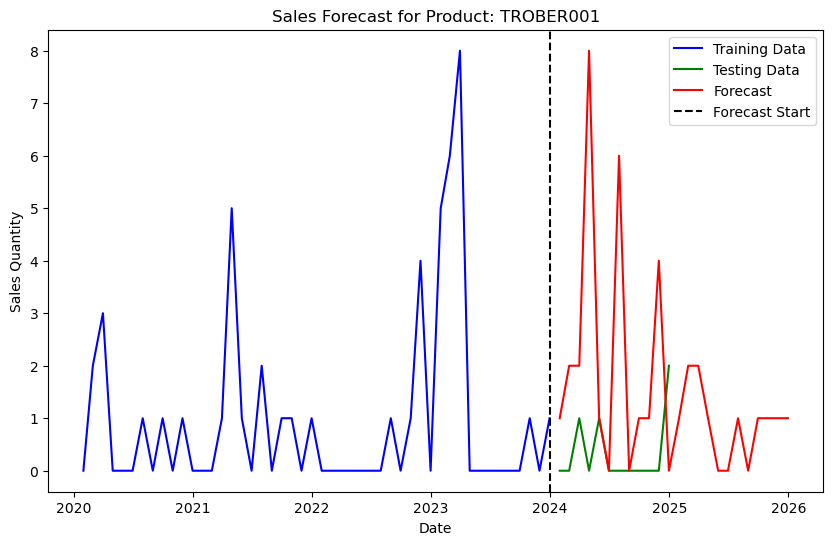

Forecasting for Item: TROBER003
MAE: 1.5, MSE: 3.8333333333333335, RMSE: 1.9578900207451218
Execution time: 0.05 seconds


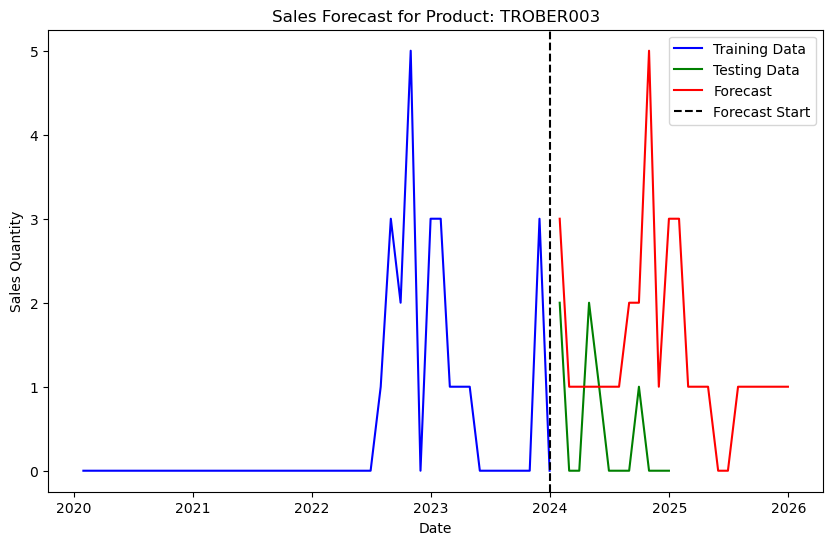

Forecasting for Item: WARBER001
MAE: 2.5, MSE: 7.833333333333333, RMSE: 2.798809270624444
Execution time: 0.05 seconds


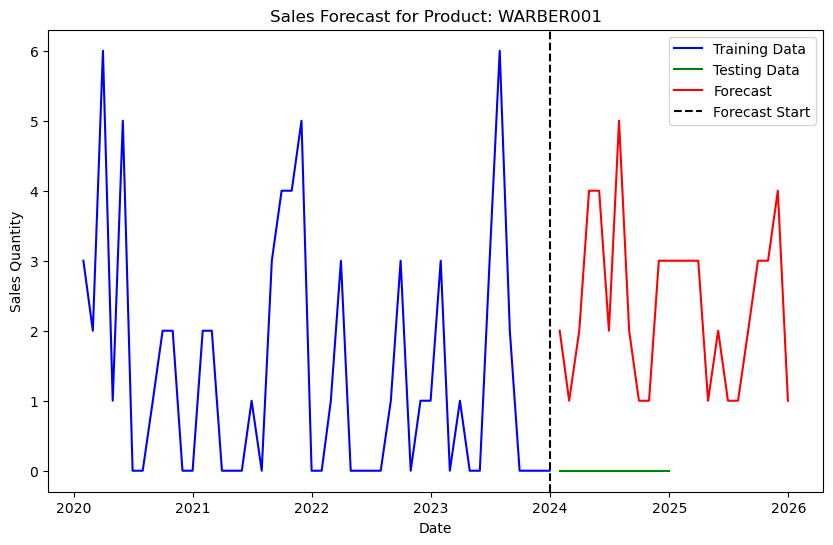

Forecasting for Item: WARBER002
MAE: 1.1666666666666667, MSE: 1.8333333333333333, RMSE: 1.35400640077266
Execution time: 0.05 seconds


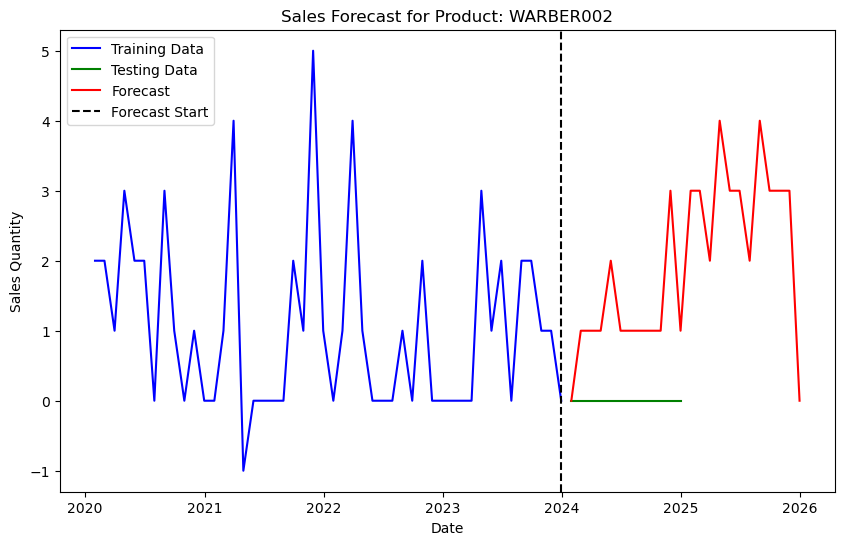

Forecasting for Item: WARBER003
MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 0.05 seconds


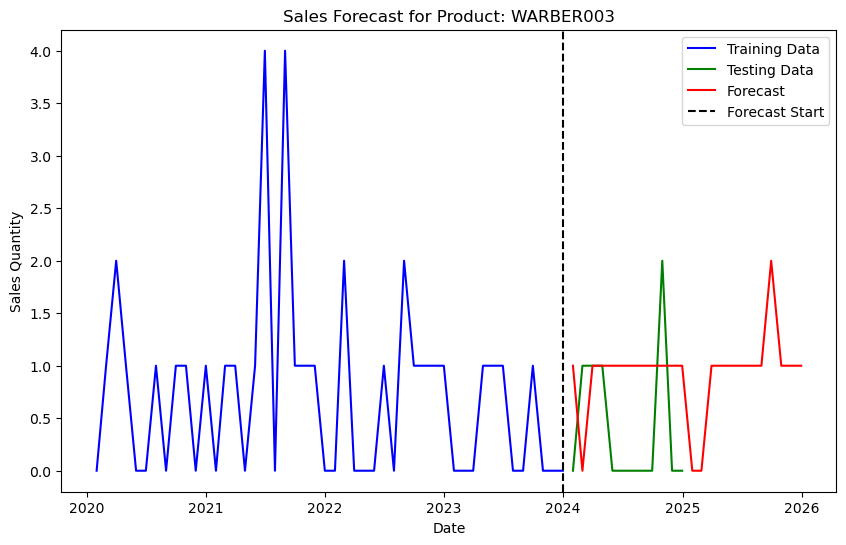

Forecasting for Item: WARBER004
MAE: 0.9166666666666666, MSE: 1.4166666666666667, RMSE: 1.1902380714238083
Execution time: 0.05 seconds


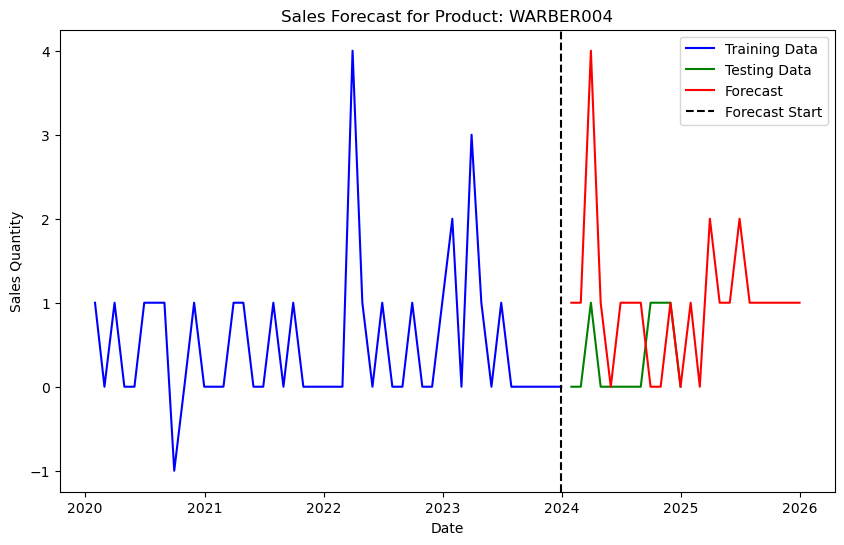

Forecasting for Item: WARBER005
MAE: 0.8333333333333334, MSE: 1.0, RMSE: 1.0
Execution time: 0.06 seconds


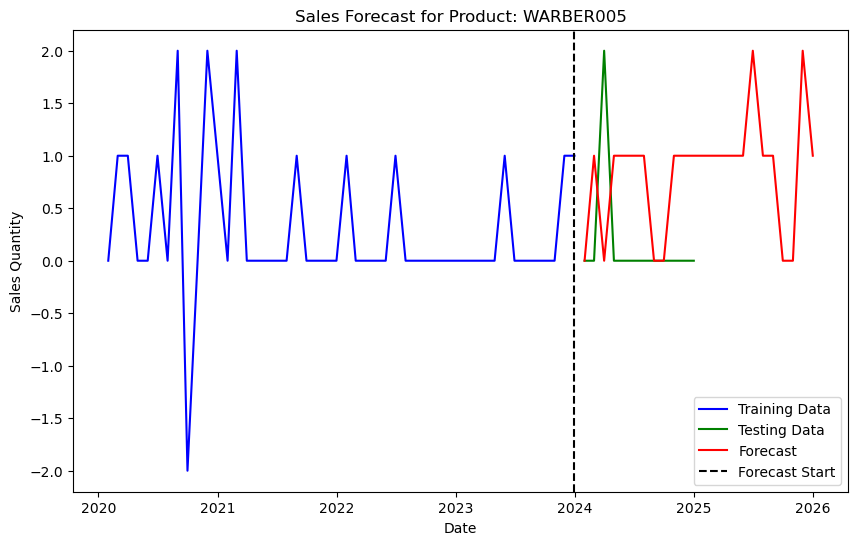

Forecasting for Item: WARBER006
MAE: 1.0, MSE: 1.3333333333333333, RMSE: 1.1547005383792515
Execution time: 0.05 seconds


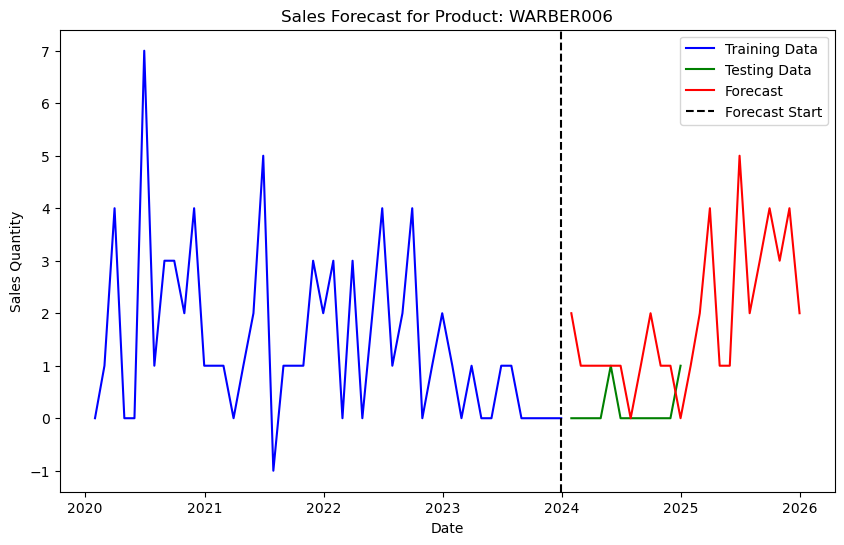

Forecasting for Item: WARBER009
MAE: 1.75, MSE: 3.9166666666666665, RMSE: 1.9790570145063195
Execution time: 0.05 seconds


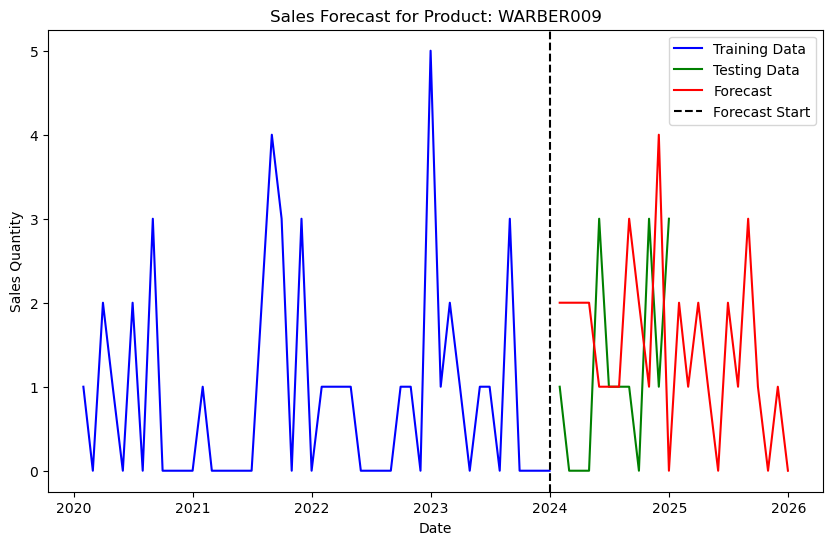

Forecasting for Item: WARBER010
MAE: 1.5, MSE: 2.8333333333333335, RMSE: 1.6832508230603465
Execution time: 0.06 seconds


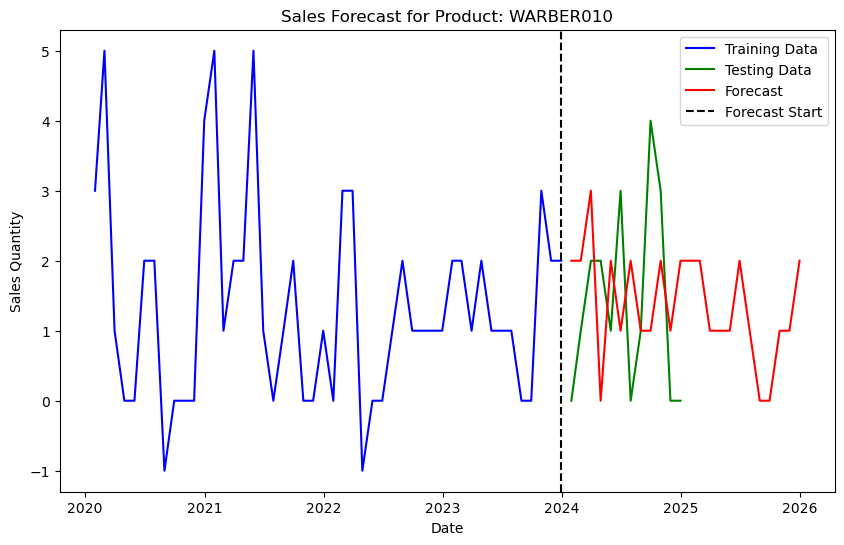

Forecasting for Item: WARBER011
MAE: 1.5833333333333333, MSE: 4.75, RMSE: 2.179449471770337
Execution time: 0.05 seconds


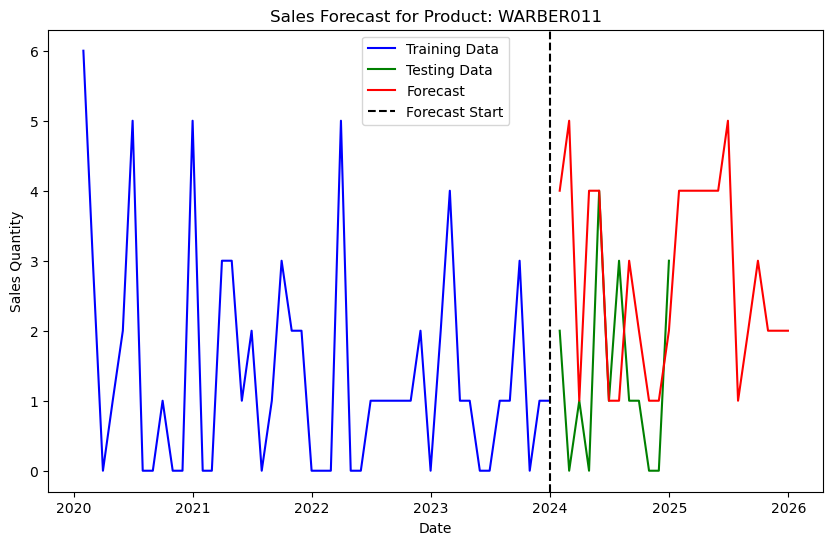

Forecasting for Item: WARBER012
MAE: 0.4166666666666667, MSE: 0.4166666666666667, RMSE: 0.6454972243679028
Execution time: 0.06 seconds


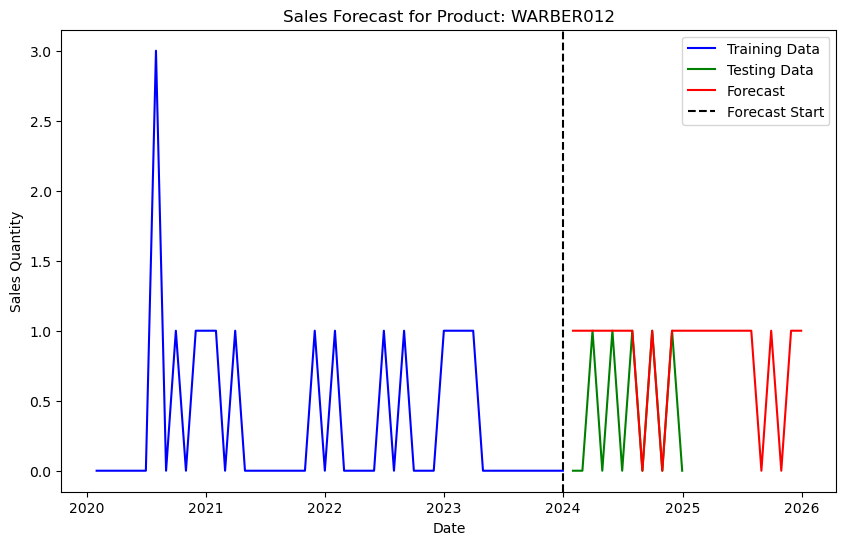

Forecasting for Item: WARBER013
MAE: 0.8333333333333334, MSE: 1.0, RMSE: 1.0
Execution time: 0.06 seconds


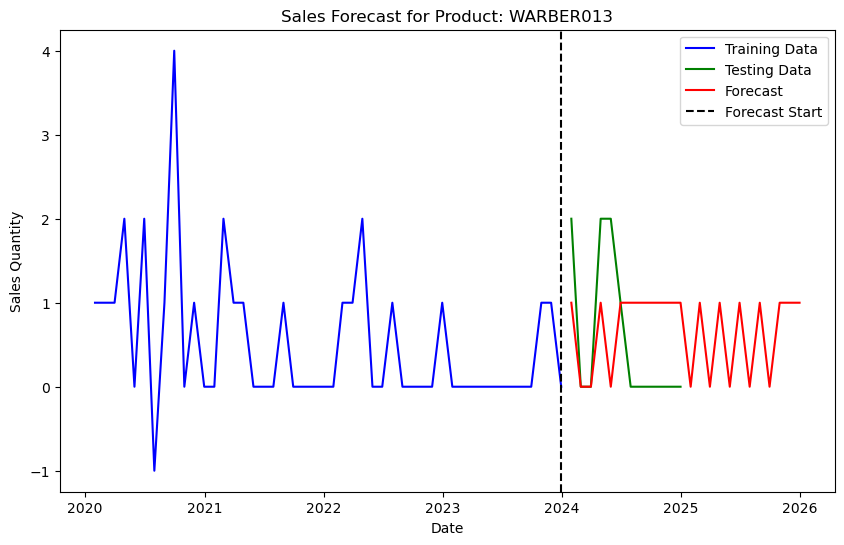

Forecasting for Item: WARBER015
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 0.06 seconds


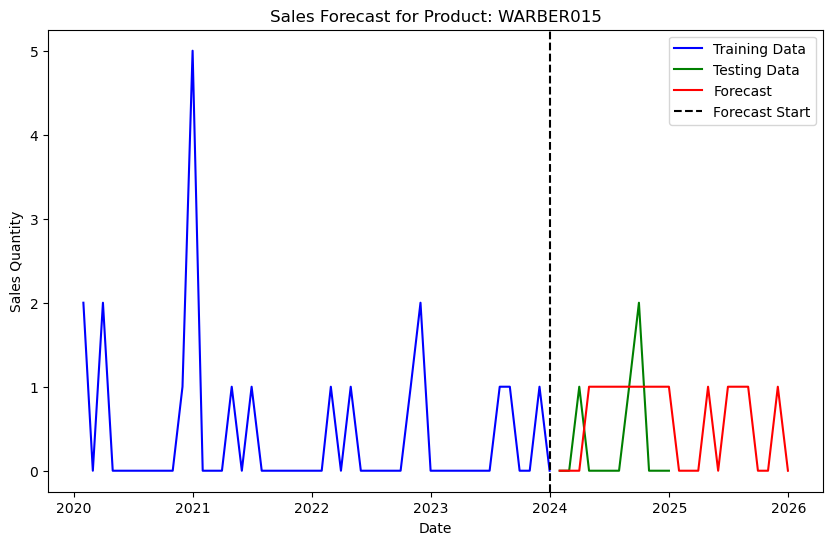

Forecasting for Item: WARBER016
MAE: 1.75, MSE: 4.25, RMSE: 2.0615528128088303
Execution time: 0.05 seconds


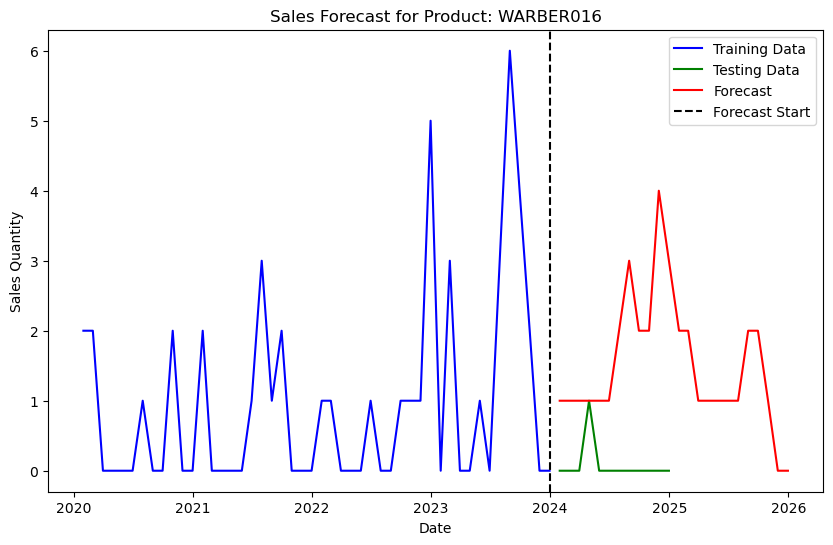

Forecasting for Item: WARBER022
MAE: 1.0, MSE: 1.1666666666666667, RMSE: 1.0801234497346435
Execution time: 0.06 seconds


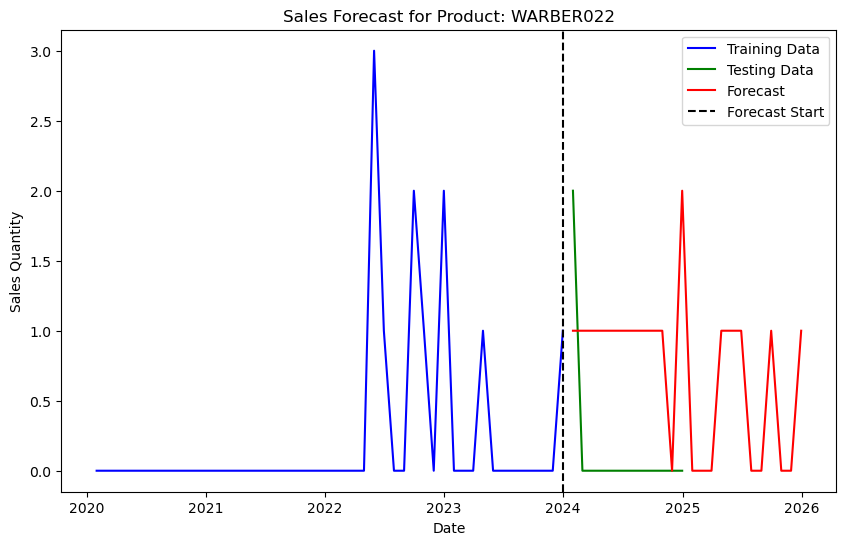

Forecasting for Item: WARBER023
MAE: 1.1666666666666667, MSE: 1.6666666666666667, RMSE: 1.2909944487358056
Execution time: 0.05 seconds


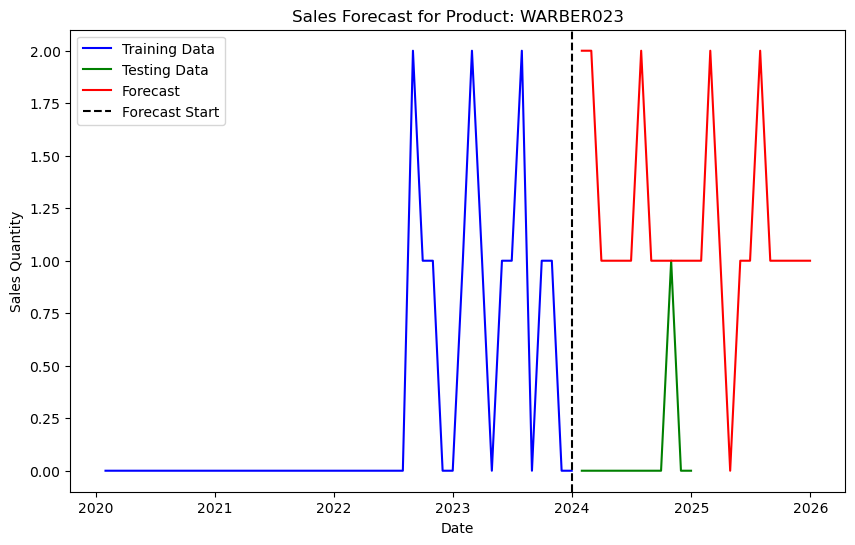

Forecasting for Item: WARBER024
MAE: 0.5, MSE: 0.5, RMSE: 0.7071067811865476
Execution time: 0.05 seconds


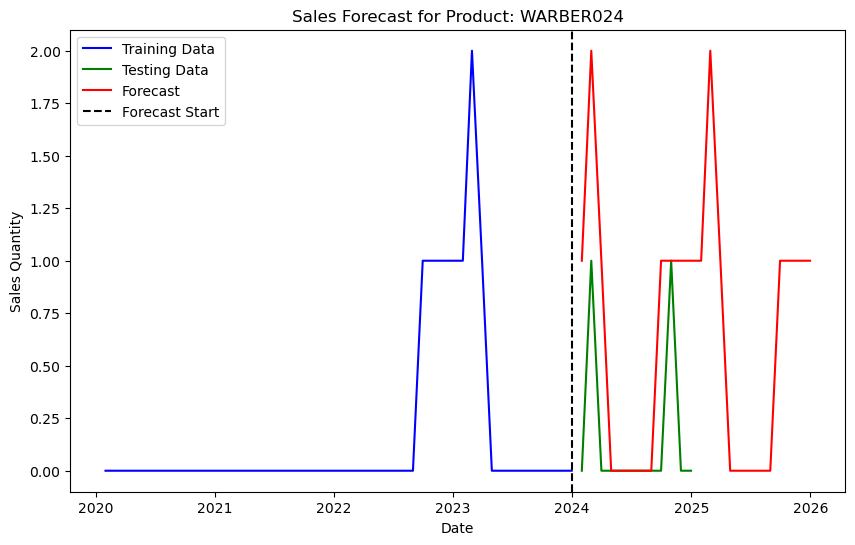

In [32]:
def forecast_sales_xgb(ProductNumber, data_filled, horizon_months=12):
    # Record the start time
    start_time = time.time()
    
    # Filter data for the specific product
    filtered_data = data_filled[data_filled['ProductNumber'] == ProductNumber]
    
    if filtered_data.empty:
       print(f"No data available for Item: {ProductNumber}")
       return None, None
    
    # Prepare data
    df = filtered_data[['month', 'Sum of InvoicedQuantity']].rename(columns={'month': 'ds', 'Sum of InvoicedQuantity': 'y'})
    df['ds'] = pd.to_datetime(df['ds']) 
    df = df.sort_values('ds').reset_index(drop=True)
    
    # Feature engineering
    df['month'] = df['ds'].dt.month
    df['year'] = df['ds'].dt.year  
   
    for lag_year in range(1, 5):  # Loop for 1, 2, 3, and 4 years
        df[f'lag_{lag_year}_year'] = df['y'].shift(12 * lag_year)
    
    # Split the data into training and testing sets
    split_date = pd.Timestamp("2024-01-01") 
    train_data = df[df['ds'] < split_date]
    test_data = df[df['ds'] >= split_date]

        
    # Prepare input features and labels
    features = [col for col in df.columns if col not in ['ds', 'y']]
    X_train, y_train = train_data[features], train_data['y']
    X_test, y_test = test_data[features], test_data['y']

    
    # Train the XGBoost model
    model = XGBRegressor()
    model.fit(X_train, y_train)

    test_data = test_data.copy()
    
    # Generate predictions for the test period
    test_data.loc[:, 'forecasted_y'] = model.predict(X_test)
    test_data.loc[:, 'forecasted_y'] = np.ceil(test_data['forecasted_y']).clip(lower=0)
    
    # Calculate accuracy metrics
    mae = mean_absolute_error(y_test, test_data['forecasted_y'])
    mse = mean_squared_error(y_test, test_data['forecasted_y'])
    rmse = root_mean_squared_error(y_test, test_data['forecasted_y'])
    test_data.loc[:, 'MAE'] = mae
    test_data.loc[:, 'MSE'] = mse
    test_data.loc[:, 'RMSE'] = rmse
    print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}")
    
    # Generate future forecasts
    future_dates = pd.date_range(start=df['ds'].max(), periods = horizon_months + 1, freq='ME')[1:]
    future_df = pd.DataFrame({'ds': future_dates}).copy()
    
    for lag_year in range(1, 5):
        future_df[f'lag_{lag_year}_year'] = df['y'].shift(12 * lag_year)
        
    future_df['month'] = future_df['ds'].dt.month
    future_df['year'] = future_df['ds'].dt.year
    
    future_df['forecasted_y'] = model.predict(future_df[features])
    future_df['forecasted_y'] = np.ceil(future_df['forecasted_y']).clip(lower=0)
    
    # Combine test and future forecasts
    forecast = pd.concat([test_data[['ds', 'y', 'forecasted_y']], future_df[['ds', 'forecasted_y']]], ignore_index=True)
    
    # Record the end time
    end_time = time.time()
    execution_time = end_time - start_time
    
    # Append execution time as a column
    test_data.loc[:, 'execution_time_seconds'] = execution_time
    print(f"Execution time: {execution_time:.2f} seconds")
    
    # Plot the results
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(train_data['ds'], train_data['y'], label="Training Data", color="blue")
    ax.plot(test_data['ds'], test_data['y'], label="Testing Data", color="green")
    ax.plot(forecast['ds'], forecast['forecasted_y'], label="Forecast", color="red")
    ax.axvline(train_data['ds'].iloc[-1], color='black', linestyle='--', label="Forecast Start")
    ax.set_title(f"Sales Forecast for Product: {ProductNumber}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Sales Quantity")
    ax.legend()
    plt.show()
    
    # return test_data
    return test_data, forecast     

# Get unique product combinations
product_combinations = data_filled[['ProductNumber']].drop_duplicates()

# Initialize containers for results
evaluation_results = []
forecast_results = []

# Perform forecasting for each product
for _, row in product_combinations.iterrows():
    ProductNumber = row['ProductNumber']
    print(f"Forecasting for Item: {ProductNumber}")
    evaluation_df, forecast_df = forecast_sales_xgb(ProductNumber, data_filled, horizon_months=12)
    
    if evaluation_df is not None and forecast_df is not None:
        evaluation_df['ProductNumber'] = ProductNumber
        forecast_df['ProductNumber'] = ProductNumber
        
        evaluation_results.append(evaluation_df)
        forecast_results.append(forecast_df)

# Combine all results into separate DataFrames
evaluation_df_combined = pd.concat(evaluation_results, ignore_index=True)
forecast_df_combined = pd.concat(forecast_results, ignore_index=True)

In [33]:
# Save results to a CSV file
evaluation_df_combined.to_csv("XGB_evaluation_results.csv", index=False)
forecast_df_combined.to_csv("XGB_sales_forecast_results.csv", index=False)

## Extract the forecasted values for the 12 months horizon in Pivot table

In [34]:
# Create the pivot table using the filtered DataFrame
filtered_forecast_df = forecast_df_combined[forecast_df_combined['ds'] > '2025-01-01']

Pivot_table2 = pd.pivot_table(
    filtered_forecast_df, 
    values='forecasted_y', 
    index='ProductNumber',
    columns='ds', 
    aggfunc='sum', 
    fill_value=0
)

Pivot_table2

ds,2025-01-31,2025-02-28,2025-03-31,2025-04-30,2025-05-31,2025-06-30,2025-07-31,2025-08-31,2025-09-30,2025-10-31,2025-11-30,2025-12-31
ProductNumber,,,,,,,,,,,,
BOLBER001,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0
BOLBER002,3.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0
BOLBER003,2.0,1.0,3.0,0.0,1.0,2.0,1.0,4.0,2.0,2.0,2.0,2.0
BOLBER005,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0
BURBER001,1.0,1.0,1.0,0.0,1.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
WARBER015,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0
WARBER016,2.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,0.0,0.0
WARBER022,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0


In [35]:
Pivot_table2.to_csv("Pivot_table2-filtered-sales_forecast_results.csv", index=True)

## Cross validation 

In [36]:
# Function for cross-validation and performance metrics for each fold
def forecast_sales_with_cv(ProductNumber, data_filled, n_splits=5):
    
    # Filter data for the specific product
    filtered_data = data_filled[data_filled['ProductNumber'] == ProductNumber]
    
    if filtered_data.empty:
        print(f"No data available for Product: {ProductNumber}")
        return None
    
    # Prepare data
    filtered_data = filtered_data[['month', 'Sum of InvoicedQuantity']]
    filtered_data['month'] = pd.to_datetime(filtered_data['month']) + pd.offsets.MonthEnd(0)
    filtered_data.set_index('month', inplace=True)

    # Create lag features for capturing trend/seasonality
    for lag_year in range(1, 5):  # Loop for 1, 2, 3, and 4 years
        filtered_data[f'lag_{lag_year}_year'] = filtered_data['Sum of InvoicedQuantity'].shift(12 * lag_year)
    # filtered_data = filtered_data.dropna()

    # Define X and y
    X = filtered_data.drop(columns=['Sum of InvoicedQuantity'])
    y = filtered_data['Sum of InvoicedQuantity']

    # Define rolling cross-validation with n_splits
    tscv = TimeSeriesSplit(n_splits=n_splits)

    # Performance metrics for each fold
    metrics = []
    fold = 1

    for train_index, test_index in tscv.split(X):
        # Split data into training and testing
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        # Initialize and train the XGBoost model
        model = XGBRegressor()
        model.fit(X_train, y_train)
        
        # Forecast and evaluate
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        rmse = root_mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)

        # Store metrics for this fold
        metrics.append({
            'fold': fold,
            'train_start': X_train.index.min(),
            'train_end': X_train.index.max(),
            'test_start': X_test.index.min(),
            'test_end': X_test.index.max(),
            'mse': mse,
            'rmse': rmse,
            'mae': mae
        })
        print(f"Fold {fold} - RMSE: {rmse:.2f}, MAE: {mae:.2f}")
        fold += 1

    # Convert metrics to a DataFrame
    df_metrics = pd.DataFrame(metrics)

    # Print overall performance
    print("\nCross-Validation Results:")
    print(df_metrics[['fold', 'train_start', 'train_end', 'test_start', 'test_end', 'mse', 'rmse', 'mae']])

    return df_metrics


# Example usage for the top 5 products
top_5_products = data_filled[data_filled['month'] >= '2023-01-01'].groupby('ProductNumber')['Sum of InvoicedQuantity'].sum().nlargest(5).index.tolist()

results = []

for ProductNumber in top_5_products:
    print(f"\nCross-validating for Product: {ProductNumber}")
    metrics = forecast_sales_with_cv(ProductNumber, data_filled, n_splits=5)      # n_splits (int): Number of cross-validation splits.
    results.append({'ProductNumber': ProductNumber, 'Metrics': metrics})
    


Cross-validating for Product: COFBER001
Fold 1 - RMSE: 2.96, MAE: 2.58
Fold 2 - RMSE: 3.96, MAE: 3.10
Fold 3 - RMSE: 7.13, MAE: 5.19
Fold 4 - RMSE: 10.80, MAE: 8.09
Fold 5 - RMSE: 8.15, MAE: 7.20

Cross-Validation Results:
   fold train_start  train_end test_start   test_end         mse       rmse  \
0     1  2020-01-31 2020-10-31 2020-11-30 2021-08-31    8.770000   2.961419   
1     2  2020-01-31 2021-08-31 2021-09-30 2022-06-30   15.691248   3.961218   
2     3  2020-01-31 2022-06-30 2022-07-31 2023-04-30   50.784061   7.126294   
3     4  2020-01-31 2023-04-30 2023-05-31 2024-02-29  116.652871  10.800596   
4     5  2020-01-31 2024-02-29 2024-03-31 2024-12-31   66.345118   8.145251   

        mae  
0  2.580000  
1  3.099309  
2  5.189693  
3  8.088464  
4  7.198048  

Cross-validating for Product: COKBER001
Fold 1 - RMSE: 4.24, MAE: 3.66
Fold 2 - RMSE: 7.29, MAE: 6.00
Fold 3 - RMSE: 4.76, MAE: 3.86
Fold 4 - RMSE: 6.49, MAE: 5.32
Fold 5 - RMSE: 10.88, MAE: 7.84

Cross-Validation Re

In [42]:
results

[{'ProductNumber': 'COFBER001',
  'Metrics':    fold train_start  train_end test_start   test_end         mse       rmse  \
  0     1  2020-01-31 2020-10-31 2020-11-30 2021-08-31    8.770000   2.961419   
  1     2  2020-01-31 2021-08-31 2021-09-30 2022-06-30   15.691248   3.961218   
  2     3  2020-01-31 2022-06-30 2022-07-31 2023-04-30   50.784061   7.126294   
  3     4  2020-01-31 2023-04-30 2023-05-31 2024-02-29  116.652871  10.800596   
  4     5  2020-01-31 2024-02-29 2024-03-31 2024-12-31   66.345118   8.145251   
  
          mae  
  0  2.580000  
  1  3.099309  
  2  5.189693  
  3  8.088464  
  4  7.198048  },
 {'ProductNumber': 'COKBER001',
  'Metrics':    fold train_start  train_end test_start   test_end         mse       rmse  \
  0     1  2020-01-31 2020-10-31 2020-11-30 2021-08-31   17.980001   4.240283   
  1     2  2020-01-31 2021-08-31 2021-09-30 2022-06-30   53.190201   7.293161   
  2     3  2020-01-31 2022-06-30 2022-07-31 2023-04-30   22.612999   4.755313   
  3

##  Grid Search for hyperparameter tuning

In [38]:
#generate the top 5 products per sales quantity
top_5_Prod = data_filled[data_filled['month'] >= '2023-01-01'].groupby('ProductNumber')['Sum of InvoicedQuantity'].sum().reset_index()
top_5_Prod = top_5_Prod.sort_values(by='Sum of InvoicedQuantity', ascending=False).head(5)
top_5_Prod

,ProductNumber,Sum of InvoicedQuantity
9,COFBER001,316.0
10,COKBER001,164.0
14,GRLBER003,152.0
13,FRYBER005,150.0
34,OVEBER011,131.0


In [39]:
# Perform Grid Search for XGBoost hyperparameter tuning
def grid_search_xgb(ProductNumber, data_filled):
    
    # Filter data for the specific product
    filtered_data = data_filled[data_filled['ProductNumber'] == ProductNumber]
    if filtered_data.empty:
        print(f"No data available for Product: {ProductNumber}")
        return None

    # Prepare data
    df = filtered_data[['month', 'Sum of InvoicedQuantity']].rename(
        columns={'month': 'ds', 'Sum of InvoicedQuantity': 'y'}
    )
    df['ds'] = pd.to_datetime(df['ds'])
    df = df.sort_values('ds').reset_index(drop=True)
    
    # Feature engineering
    df['month'] = df['ds'].dt.month
    df['year'] = df['ds'].dt.year
    for lag_year in range(1, 5):  # 1 to 4 years lag
        df[f'lag_{lag_year}_year'] = df['y'].shift(12 * lag_year)

    # Split the data into training and testing sets
    split_date = pd.Timestamp("2024-01-01")
    train_data = df[df['ds'] < split_date]
    test_data = df[df['ds'] >= split_date]

    # Prepare features and target
    features = [col for col in df.columns if col not in ['ds', 'y']]
    X_train, y_train = train_data[features], train_data['y']
    X_test, y_test = test_data[features], test_data['y']

    # Define hyperparameter grid
    param_grid = {
        'n_estimators': [30, 50, 200],
        'max_depth': [2, 5, 7, 9],
        'learning_rate': [0.01, 0.1],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.7, 1.0]
    }
    all_params = [dict(zip(param_grid.keys(), v)) for v in product(*param_grid.values())]
    
    results = []
    best_params = None
    best_rmse = float('inf')

    # Grid search loop
    for params in all_params:
        # print(f"Testing params: {params}")
        
        # Train the XGBoost model
        model = XGBRegressor(**params, random_state=42)
        model.fit(X_train, y_train)
        
        # Predict on test set
        y_pred = model.predict(X_test)
        rmse = root_mean_squared_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        mae = mean_absolute_error(y_test, y_pred)

        # print(f"Params: {params} => RMSE: {rmse:.4f}, MSE: {mse:.4f}, MAE: {mae:.4f}")
        
        # Store results
        results.append({**params, 'RMSE': rmse, 'MSE': mse, 'MAE': mae})
        
        # Update best parameters
        if rmse < best_rmse:
            best_rmse = rmse
            best_params = params

    # Print best hyperparameters
    print(f"Best Params for {ProductNumber}: {best_params}, Best RMSE: {best_rmse:.4f}")
    
    return pd.DataFrame(results), best_params

# Perform Grid Search for all products in product_combinations
all_grid_results = []
best_params_list = []

# Usage for top 5 products
for prod in top_5_Prod['ProductNumber']:
    print(f"Grid Searching for Product: {prod}")
    grid_results_df, best_params = grid_search_xgb(prod, data_filled)
    
    if grid_results_df is not None:
        grid_results_df['ProductNumber'] = prod
        all_grid_results.append(grid_results_df)
        best_params_list.append({'ProductNumber': prod, **best_params})

# Combine results of Grid Search including RMSE and hyperparameters.
all_grid_results_df = pd.concat(all_grid_results, ignore_index=True)
best_params_df = pd.DataFrame(best_params_list)

Grid Searching for Product: COFBER001
Best Params for COFBER001: {'n_estimators': 30, 'max_depth': 5, 'learning_rate': 0.01, 'subsample': 0.8, 'colsample_bytree': 0.7}, Best RMSE: 6.3949
Grid Searching for Product: COKBER001
Best Params for COKBER001: {'n_estimators': 50, 'max_depth': 7, 'learning_rate': 0.01, 'subsample': 1.0, 'colsample_bytree': 1.0}, Best RMSE: 8.6959
Grid Searching for Product: GRLBER003
Best Params for GRLBER003: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.1, 'subsample': 1.0, 'colsample_bytree': 1.0}, Best RMSE: 6.4450
Grid Searching for Product: FRYBER005
Best Params for FRYBER005: {'n_estimators': 30, 'max_depth': 2, 'learning_rate': 0.01, 'subsample': 0.8, 'colsample_bytree': 1.0}, Best RMSE: 6.5643
Grid Searching for Product: OVEBER011
Best Params for OVEBER011: {'n_estimators': 50, 'max_depth': 2, 'learning_rate': 0.01, 'subsample': 0.8, 'colsample_bytree': 0.7}, Best RMSE: 4.1979


In [43]:
best_params_df

,ProductNumber,n_estimators,max_depth,learning_rate,subsample,colsample_bytree
0,COFBER001,30,5,0.01,0.8,0.7
1,COKBER001,50,7,0.01,1.0,1.0
2,GRLBER003,200,7,0.10,1.0,1.0
3,FRYBER005,30,2,0.01,0.8,1.0
4,OVEBER011,50,2,0.01,0.8,0.7


In [44]:
# Find the row with the lowest rmse for each ProductNumber
lowest_rmse_per_product = all_grid_results_df.loc[all_grid_results_df.groupby('ProductNumber')['RMSE'].idxmin()].reset_index(drop=True)
lowest_rmse_per_product

,n_estimators,max_depth,learning_rate,subsample,colsample_bytree,RMSE,MSE,MAE,ProductNumber
0,30,5,0.01,0.8,0.7,6.394866,40.894305,5.309171,COFBER001
1,50,7,0.01,1.0,1.0,8.695899,75.618659,8.000278,COKBER001
2,30,2,0.01,0.8,1.0,6.564339,43.090549,4.957602,FRYBER005
3,200,7,0.10,1.0,1.0,6.445022,41.538312,5.334051,GRLBER003
4,50,2,0.01,0.8,0.7,4.197915,17.622489,3.621830,OVEBER011


## Re-run XGBoost with the recommended Hyper parameters

Forecasting for Item: BOLBER001
RMSE for Product BOLBER001: 0.3961405268310181
MAE: 0.9166666666666666, MSE: 0.9166666666666666, RMSE: 0.9574271077563381
Execution time: 45.93 seconds
Best Params for Product BOLBER001: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 30, 'subsample': 1.0}


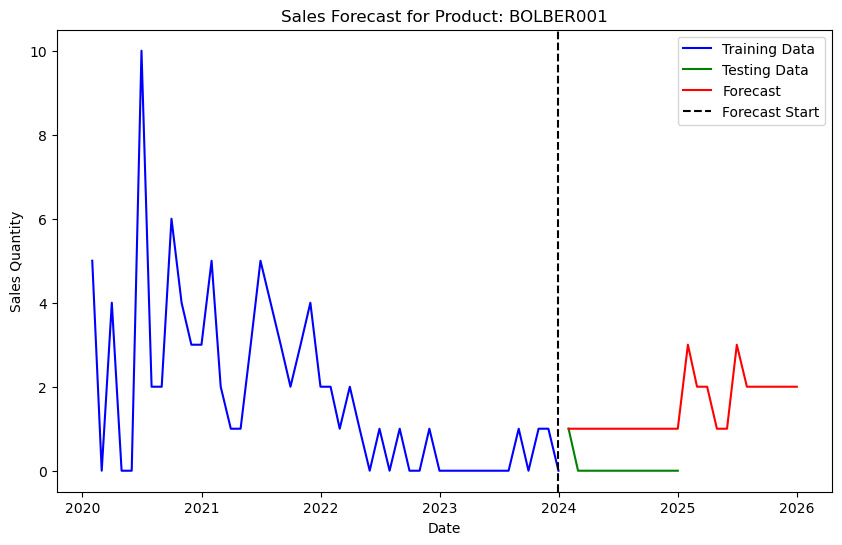

Forecasting for Item: BOLBER002
RMSE for Product BOLBER002: 1.3854597025794526
MAE: 1.9166666666666667, MSE: 3.9166666666666665, RMSE: 1.9790570145063195
Execution time: 46.17 seconds
Best Params for Product BOLBER002: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.7}


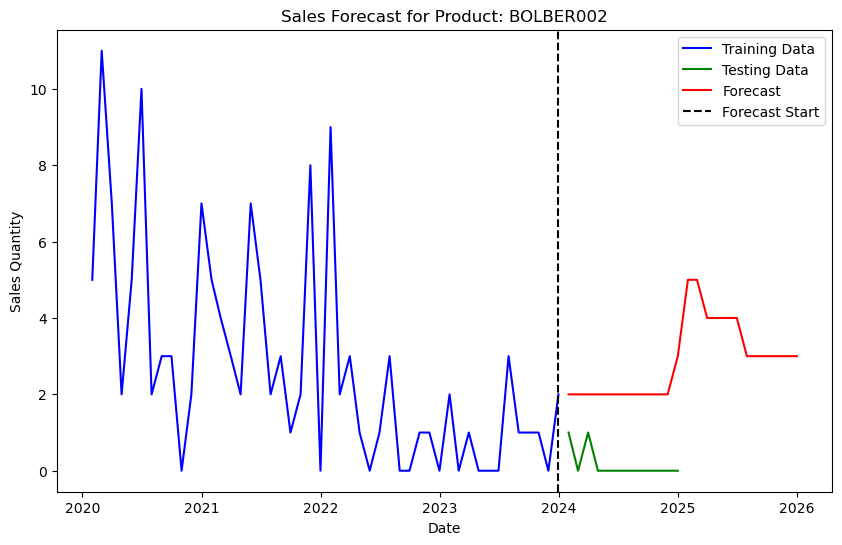

Forecasting for Item: BOLBER003
RMSE for Product BOLBER003: 2.3536216031957804
MAE: 2.3333333333333335, MSE: 7.166666666666667, RMSE: 2.6770630673681683
Execution time: 47.70 seconds
Best Params for Product BOLBER003: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}


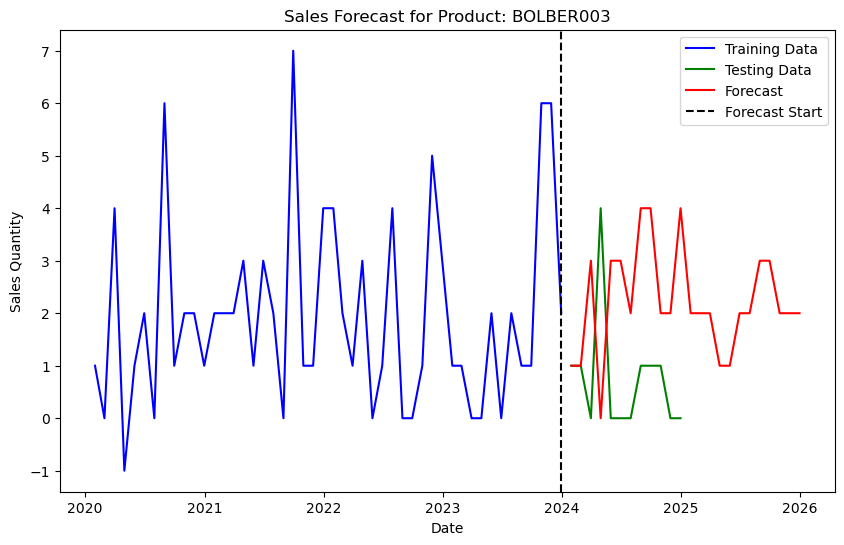

Forecasting for Item: BOLBER005
RMSE for Product BOLBER005: 0.5003580831296514
MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 45.26 seconds
Best Params for Product BOLBER005: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 50, 'subsample': 1.0}


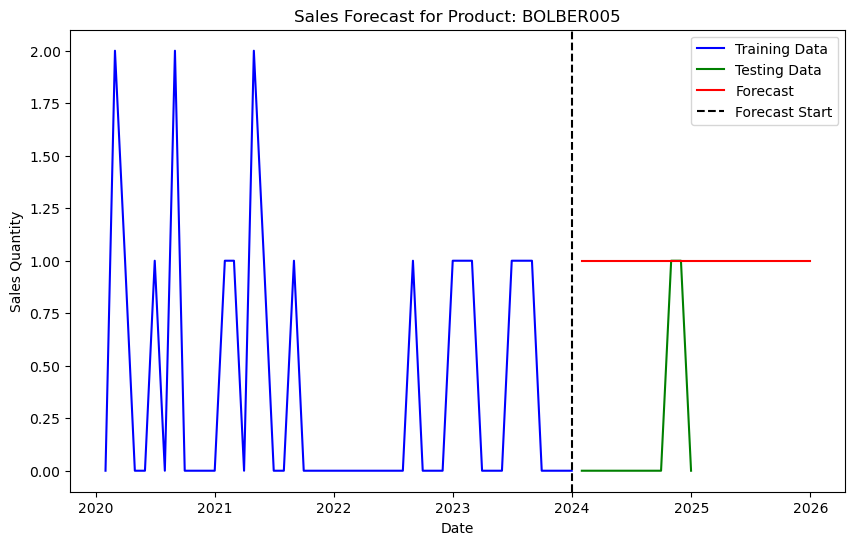

Forecasting for Item: BURBER001
RMSE for Product BURBER001: 0.4870691510920602
MAE: 0.5833333333333334, MSE: 0.5833333333333334, RMSE: 0.7637626158259734
Execution time: 46.33 seconds
Best Params for Product BURBER001: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 30, 'subsample': 1.0}


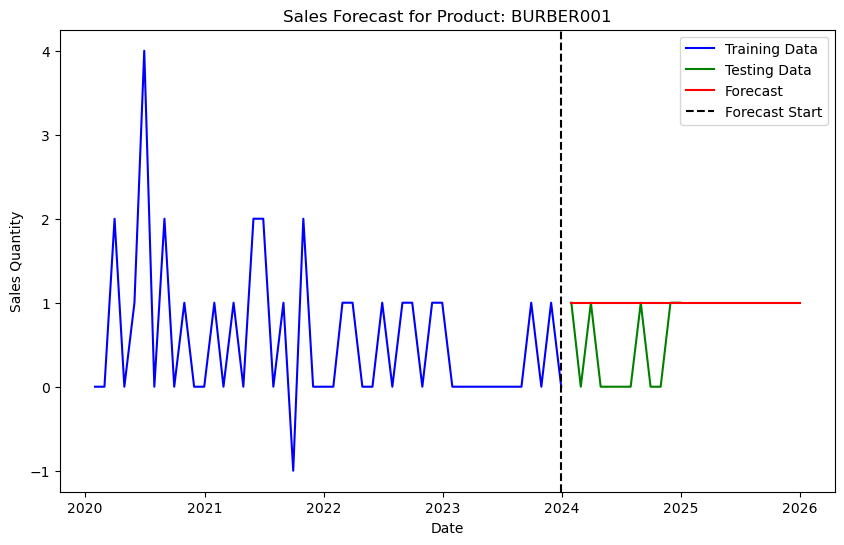

Forecasting for Item: BURBER002
RMSE for Product BURBER002: 1.5361308323010907
MAE: 1.25, MSE: 2.5833333333333335, RMSE: 1.6072751268321592
Execution time: 47.77 seconds
Best Params for Product BURBER002: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 50, 'subsample': 1.0}


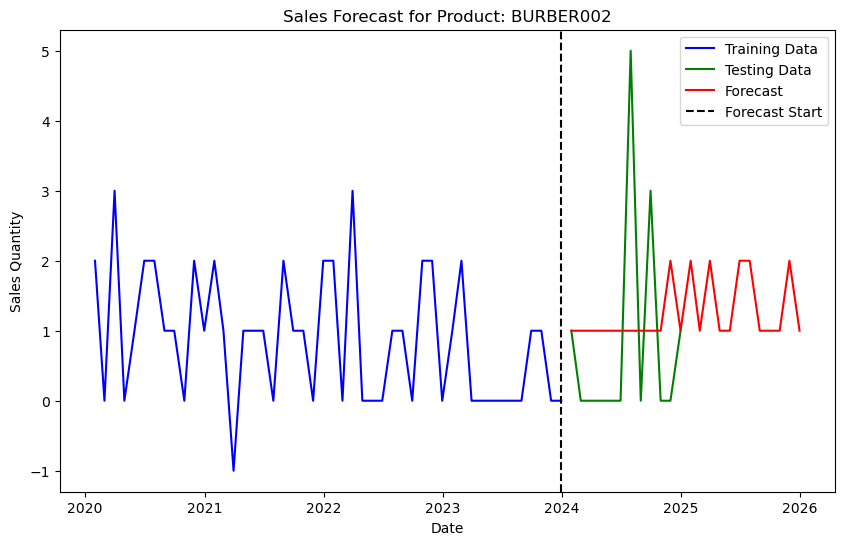

Forecasting for Item: BURBER003
RMSE for Product BURBER003: 1.3062961443892722
MAE: 1.4166666666666667, MSE: 3.0833333333333335, RMSE: 1.7559422921421233
Execution time: 49.08 seconds
Best Params for Product BURBER003: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 50, 'subsample': 1.0}


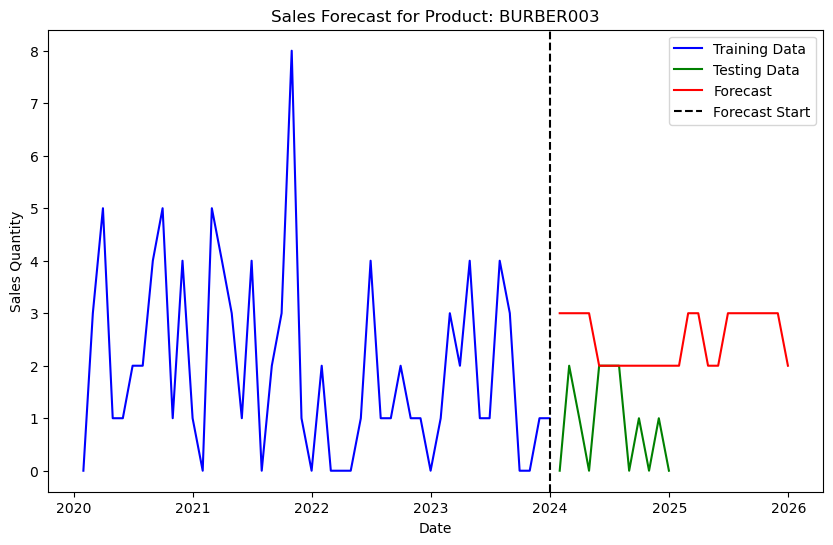

Forecasting for Item: BURBER004
RMSE for Product BURBER004: 1.7288688774487349
MAE: 1.4166666666666667, MSE: 3.25, RMSE: 1.8027756377319946
Execution time: 53.51 seconds
Best Params for Product BURBER004: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 30, 'subsample': 1.0}


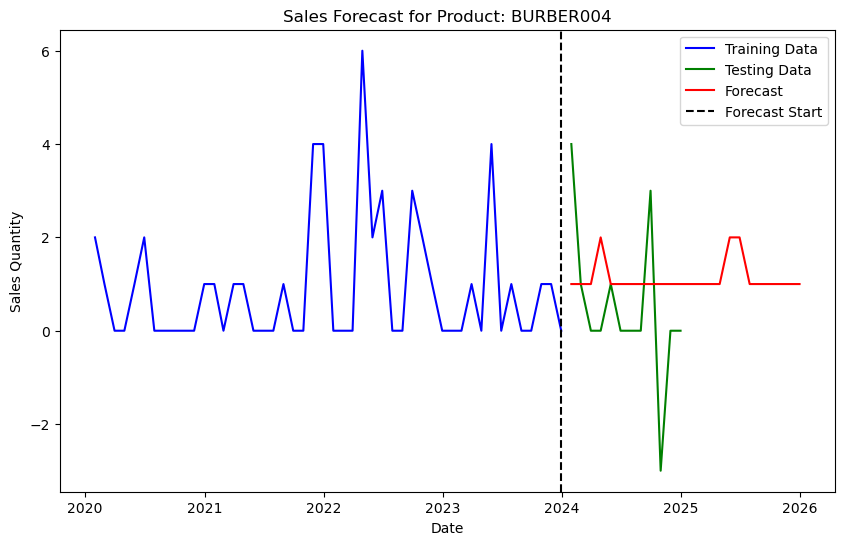

Forecasting for Item: BURBER007
RMSE for Product BURBER007: 0.6482067833674892
MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 43.68 seconds
Best Params for Product BURBER007: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.8}


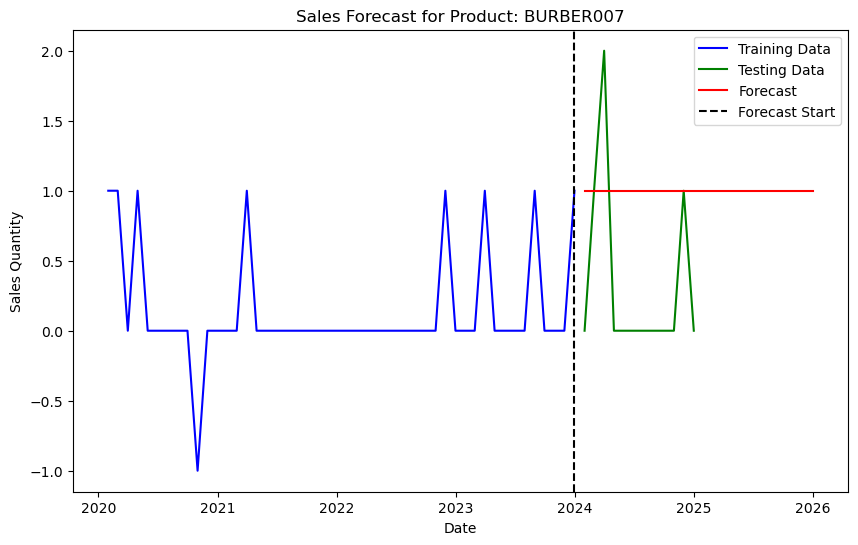

Forecasting for Item: COFBER001
RMSE for Product COFBER001: 10.725580334555186
MAE: 9.166666666666666, MSE: 121.33333333333333, RMSE: 11.015141094572204
Execution time: 47.08 seconds
Best Params for Product COFBER001: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}


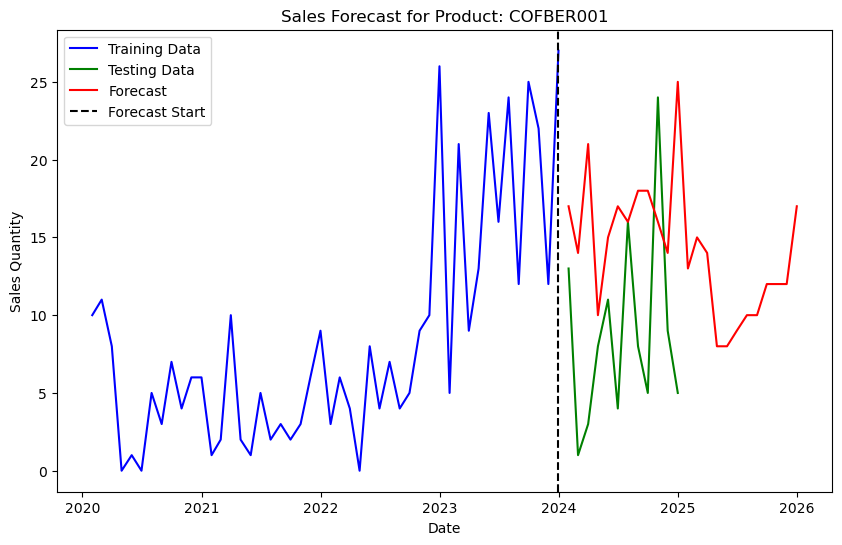

Forecasting for Item: COKBER001
RMSE for Product COKBER001: 8.960606871118546
MAE: 8.833333333333334, MSE: 87.33333333333333, RMSE: 9.345230512584124
Execution time: 47.90 seconds
Best Params for Product COKBER001: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 1.0}


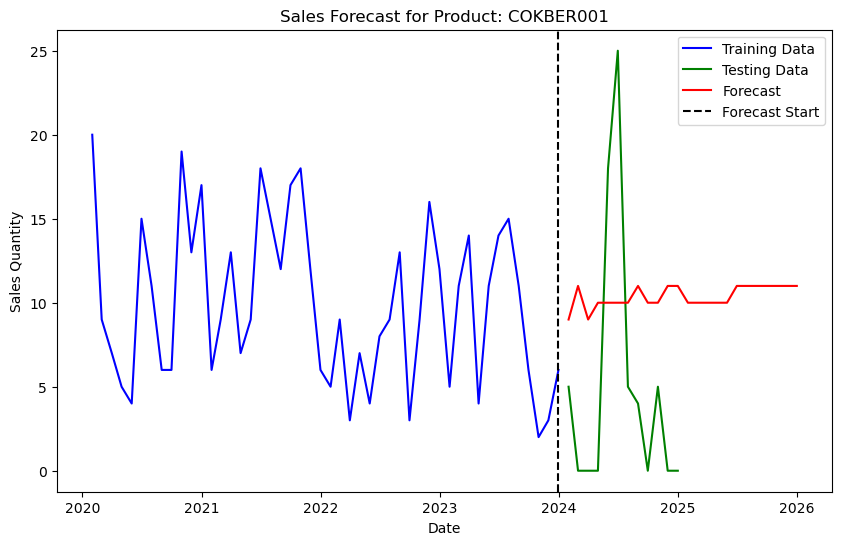

Forecasting for Item: FRYBER002
RMSE for Product FRYBER002: 4.517513921100026
MAE: 4.5, MSE: 25.0, RMSE: 5.0
Execution time: 50.28 seconds
Best Params for Product FRYBER002: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 30, 'subsample': 0.7}


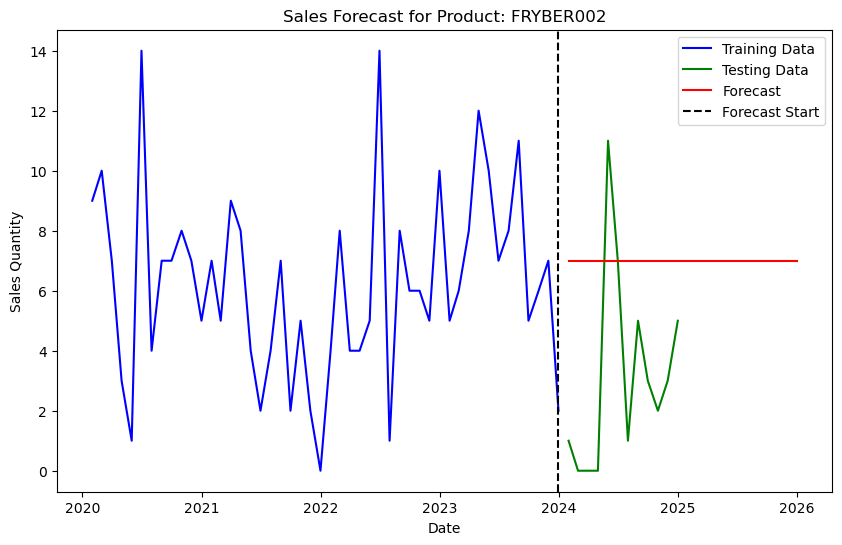

Forecasting for Item: FRYBER003
RMSE for Product FRYBER003: 4.110083609048614
MAE: 4.0, MSE: 18.833333333333332, RMSE: 4.339738855430512
Execution time: 48.23 seconds
Best Params for Product FRYBER003: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.7}


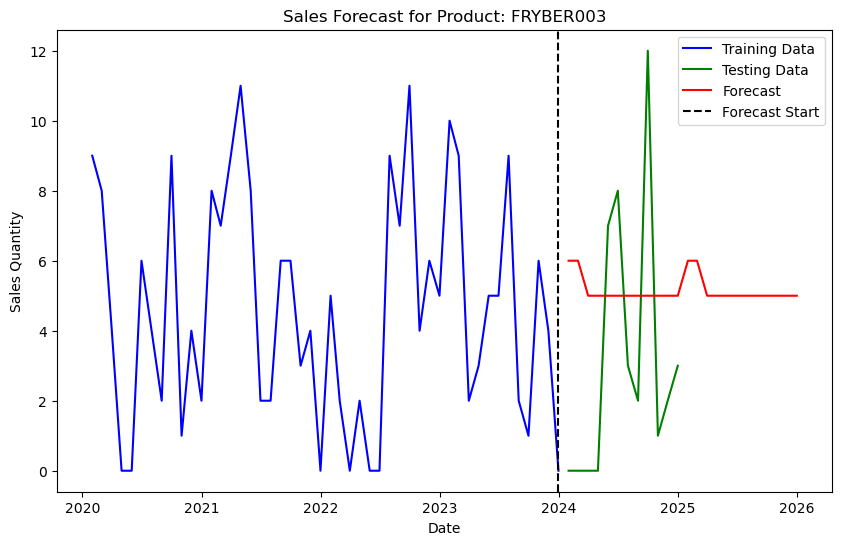

Forecasting for Item: FRYBER005
RMSE for Product FRYBER005: 8.514321978931365
MAE: 6.666666666666667, MSE: 77.0, RMSE: 8.774964387392123
Execution time: 49.16 seconds
Best Params for Product FRYBER005: {'colsample_bytree': 0.7, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.8}


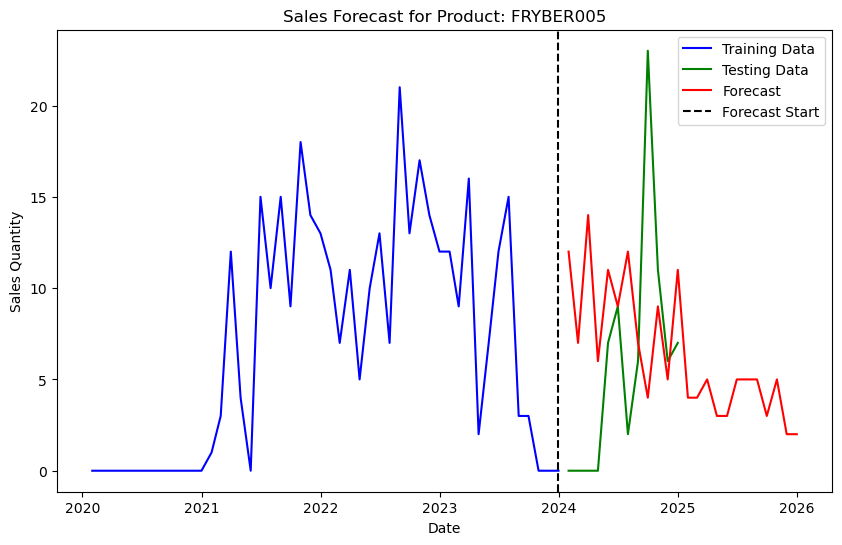

Forecasting for Item: GRLBER003
RMSE for Product GRLBER003: 7.309047465581914
MAE: 7.083333333333333, MSE: 59.25, RMSE: 7.697402159170326
Execution time: 49.23 seconds
Best Params for Product GRLBER003: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 30, 'subsample': 0.7}


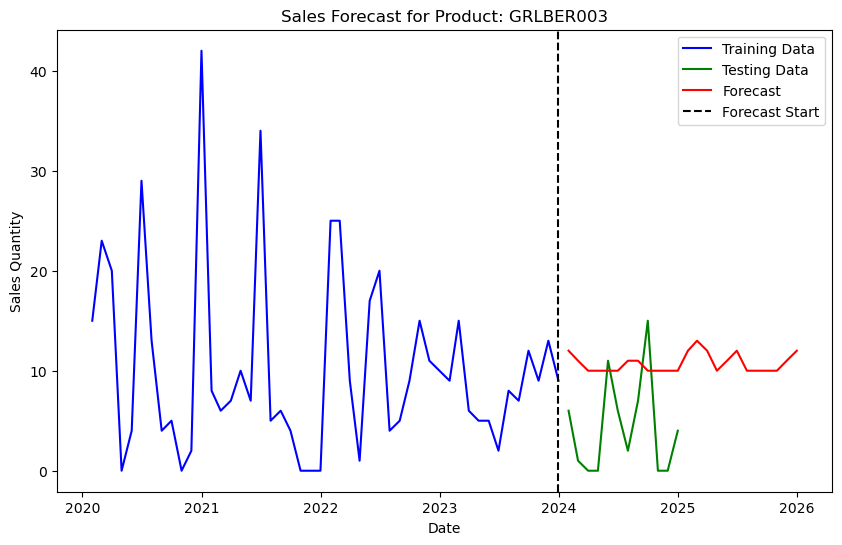

Forecasting for Item: GRLBER004
RMSE for Product GRLBER004: 5.450608043075059
MAE: 5.0, MSE: 34.5, RMSE: 5.873670062235365
Execution time: 52.02 seconds
Best Params for Product GRLBER004: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 30, 'subsample': 0.7}


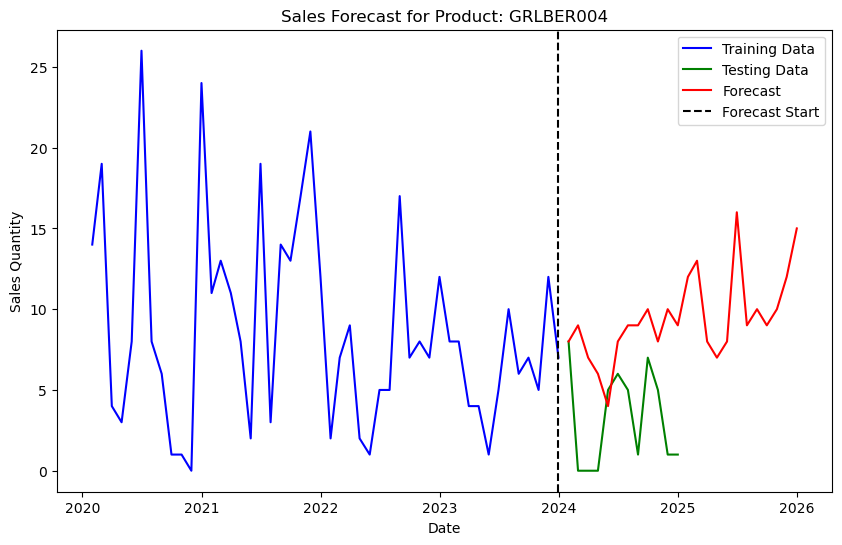

Forecasting for Item: GRLBER009
RMSE for Product GRLBER009: 1.6779724705090122
MAE: 1.75, MSE: 3.9166666666666665, RMSE: 1.9790570145063195
Execution time: 50.78 seconds
Best Params for Product GRLBER009: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 50, 'subsample': 1.0}


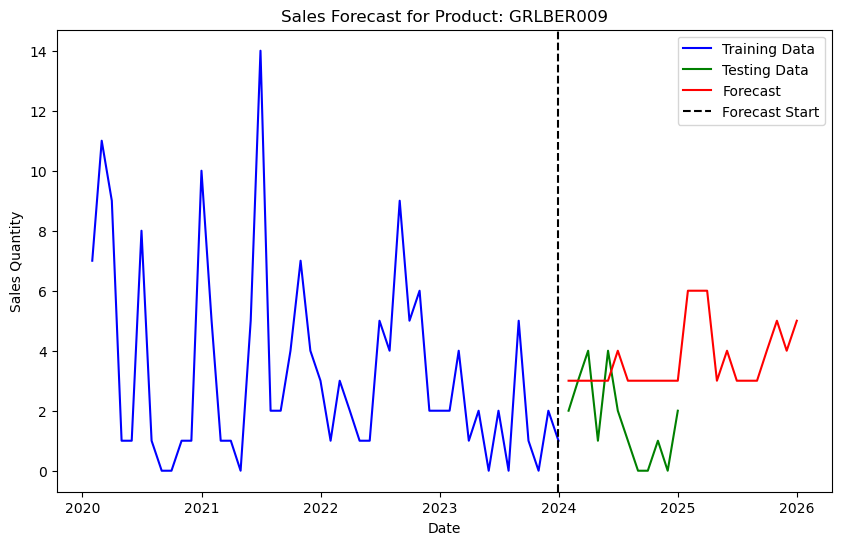

Forecasting for Item: GRLBER010
RMSE for Product GRLBER010: 1.1601036049329534
MAE: 1.25, MSE: 1.9166666666666667, RMSE: 1.3844373104863459
Execution time: 54.81 seconds
Best Params for Product GRLBER010: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 50, 'subsample': 0.7}


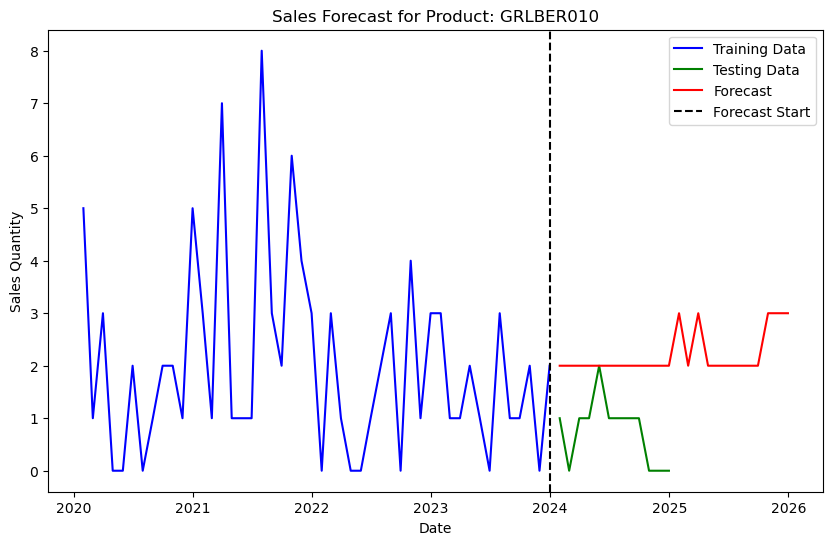

Forecasting for Item: GRLBER011
RMSE for Product GRLBER011: 3.607967858727693
MAE: 3.6666666666666665, MSE: 15.166666666666666, RMSE: 3.8944404818493075
Execution time: 46.39 seconds
Best Params for Product GRLBER011: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 30, 'subsample': 0.7}


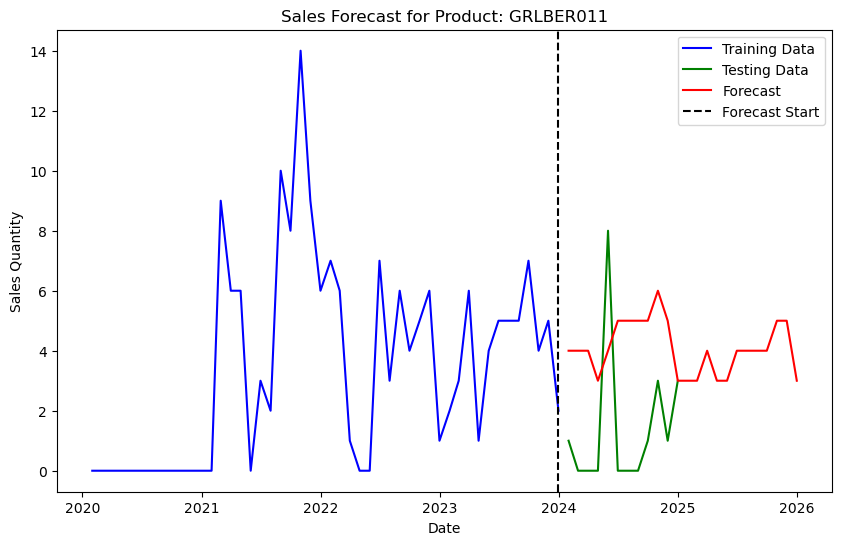

Forecasting for Item: GRLBER012
RMSE for Product GRLBER012: 1.774220754449601
MAE: 2.0833333333333335, MSE: 4.416666666666667, RMSE: 2.101586702153082
Execution time: 48.88 seconds
Best Params for Product GRLBER012: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 30, 'subsample': 1.0}


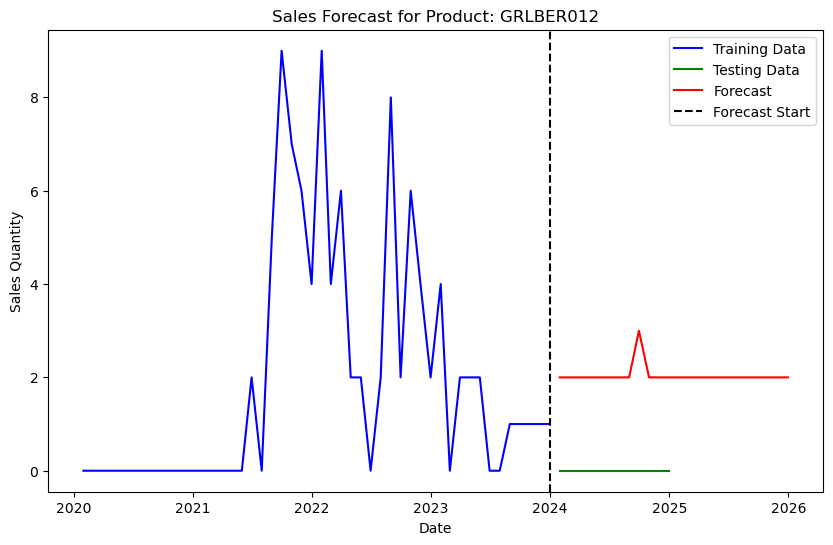

Forecasting for Item: GRLBER015
RMSE for Product GRLBER015: 2.69222912874982
MAE: 2.25, MSE: 6.416666666666667, RMSE: 2.533114025595111
Execution time: 46.50 seconds
Best Params for Product GRLBER015: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.7}


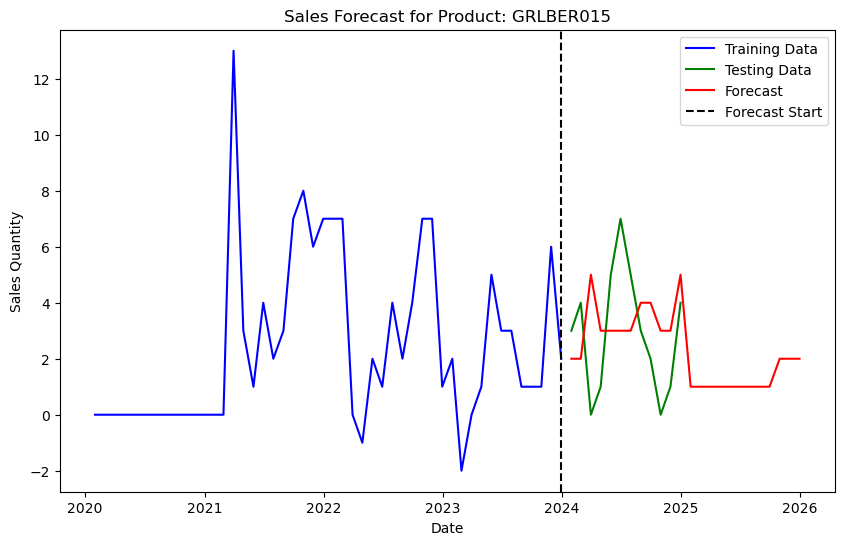

Forecasting for Item: GRLBER019
RMSE for Product GRLBER019: 1.1332640874986717
MAE: 0.9166666666666666, MSE: 1.0833333333333333, RMSE: 1.0408329997330663
Execution time: 45.63 seconds
Best Params for Product GRLBER019: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 1.0}


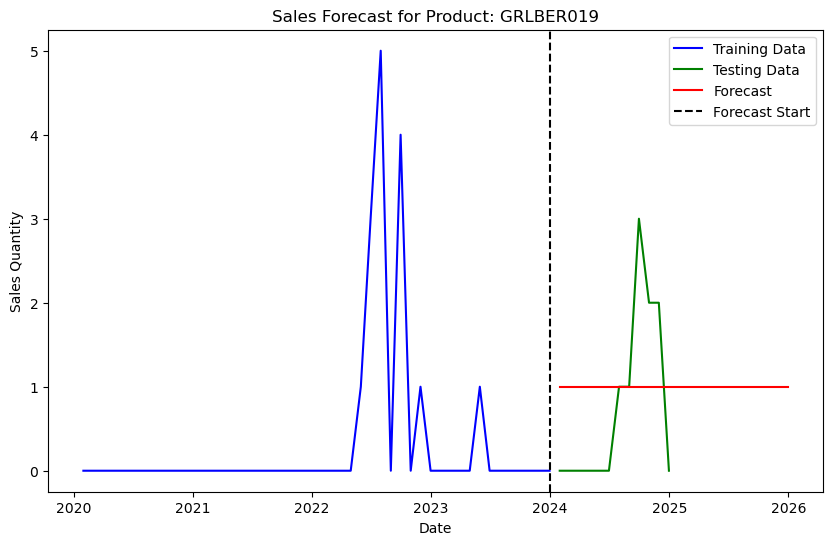

Forecasting for Item: GRLBER020
RMSE for Product GRLBER020: 1.5325409006230142
MAE: 1.0833333333333333, MSE: 2.0833333333333335, RMSE: 1.4433756729740645
Execution time: 44.41 seconds
Best Params for Product GRLBER020: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}


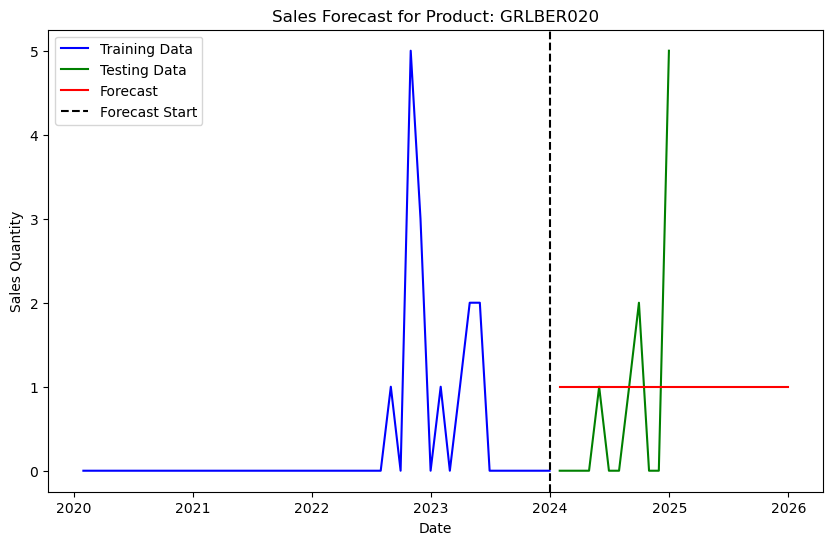

Forecasting for Item: HEABER001
RMSE for Product HEABER001: 3.449833725194236
MAE: 2.4166666666666665, MSE: 11.583333333333334, RMSE: 3.4034296427770228
Execution time: 47.48 seconds
Best Params for Product HEABER001: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 30, 'subsample': 1.0}


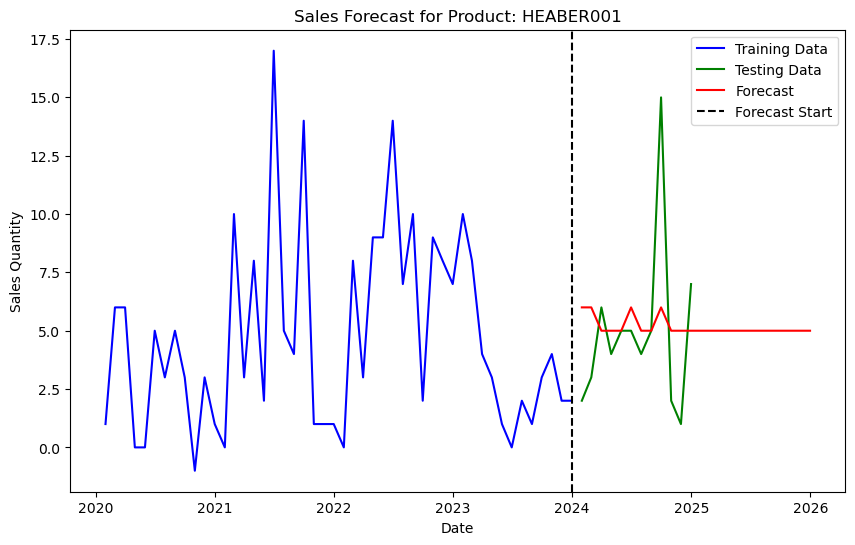

Forecasting for Item: HOTBER001
RMSE for Product HOTBER001: 1.7244276834595282
MAE: 2.1666666666666665, MSE: 5.0, RMSE: 2.23606797749979
Execution time: 46.34 seconds
Best Params for Product HOTBER001: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 50, 'subsample': 0.7}


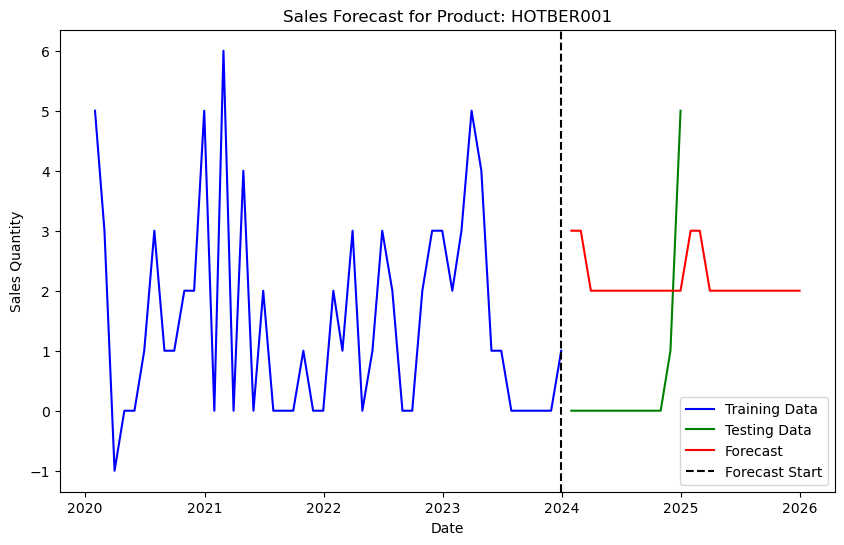

Forecasting for Item: HOTBER002
RMSE for Product HOTBER002: 1.2305955417189496
MAE: 1.0833333333333333, MSE: 1.9166666666666667, RMSE: 1.3844373104863459
Execution time: 48.11 seconds
Best Params for Product HOTBER002: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}


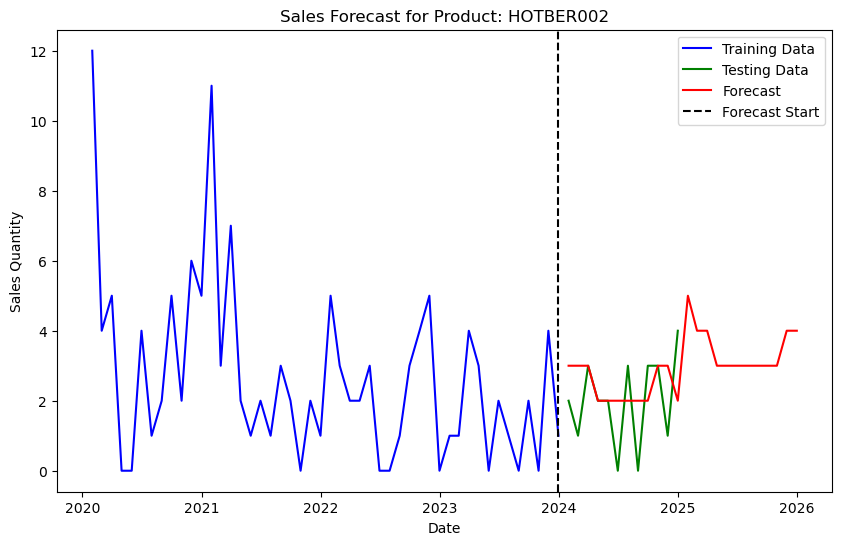

Forecasting for Item: HOTBER003
RMSE for Product HOTBER003: 1.897280858523193
MAE: 2.0, MSE: 5.0, RMSE: 2.23606797749979
Execution time: 48.68 seconds
Best Params for Product HOTBER003: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.7}


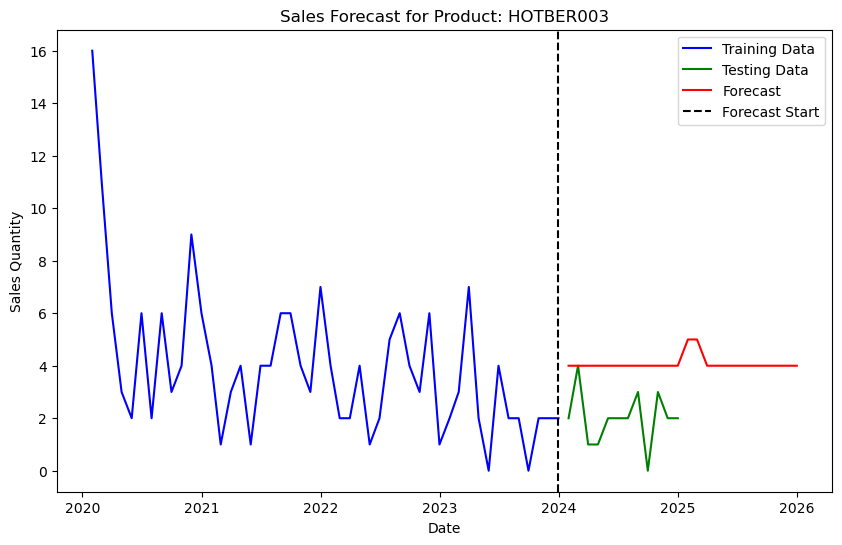

Forecasting for Item: ICMBER002
RMSE for Product ICMBER002: 0.6560723768932445
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 39.50 seconds
Best Params for Product ICMBER002: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.7}


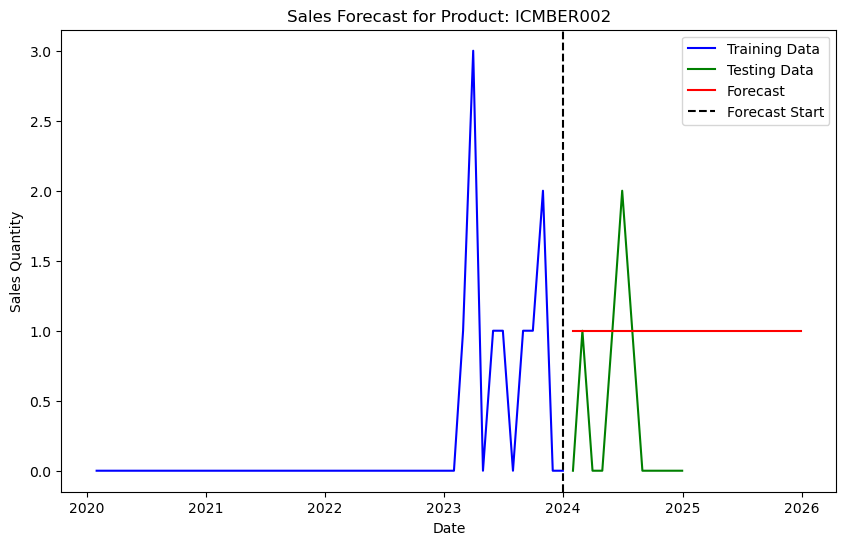

Forecasting for Item: ICMBER003
RMSE for Product ICMBER003: 1.2497098959333146
MAE: 0.9166666666666666, MSE: 1.4166666666666667, RMSE: 1.1902380714238083
Execution time: 36.49 seconds
Best Params for Product ICMBER003: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.7}


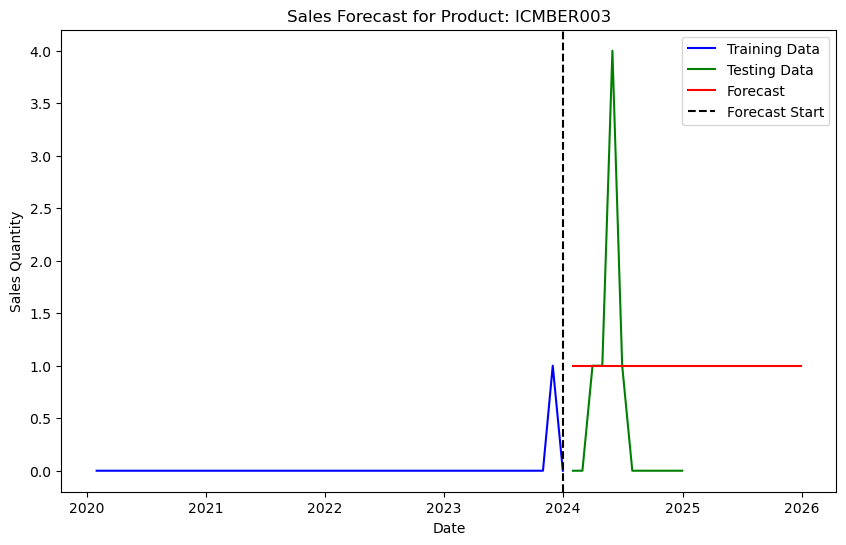

Forecasting for Item: MIXBER001
RMSE for Product MIXBER001: 3.5508085730744865
MAE: 3.3333333333333335, MSE: 15.0, RMSE: 3.872983346207417
Execution time: 46.57 seconds
Best Params for Product MIXBER001: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50, 'subsample': 0.8}


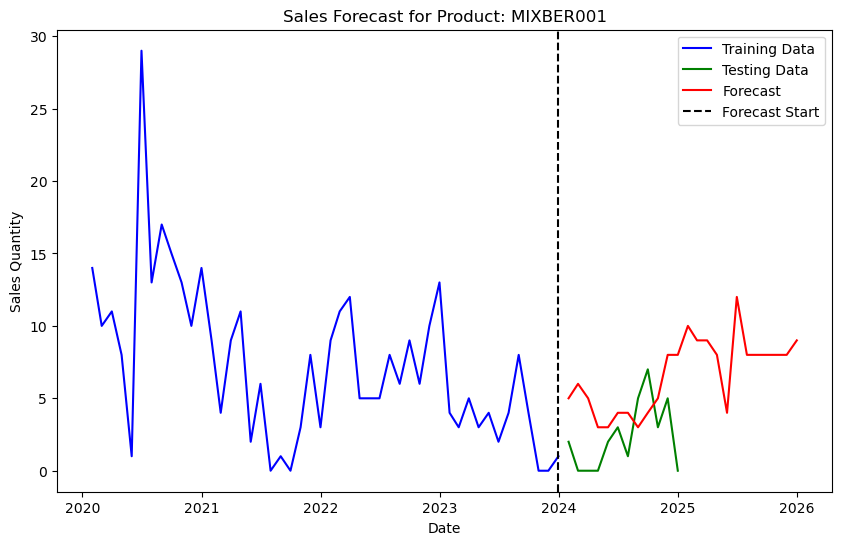

Forecasting for Item: MIXBER003
RMSE for Product MIXBER003: 2.311457597946074
MAE: 2.1666666666666665, MSE: 6.5, RMSE: 2.5495097567963922
Execution time: 45.52 seconds
Best Params for Product MIXBER003: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 30, 'subsample': 0.7}


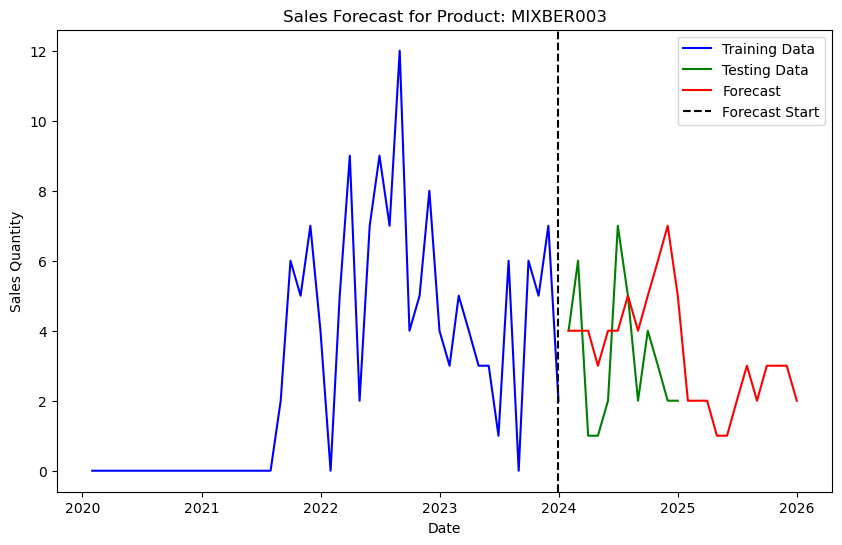

Forecasting for Item: OVEBER002
RMSE for Product OVEBER002: 3.3932123899355053
MAE: 3.3333333333333335, MSE: 14.333333333333334, RMSE: 3.7859388972001824
Execution time: 50.18 seconds
Best Params for Product OVEBER002: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 30, 'subsample': 0.7}


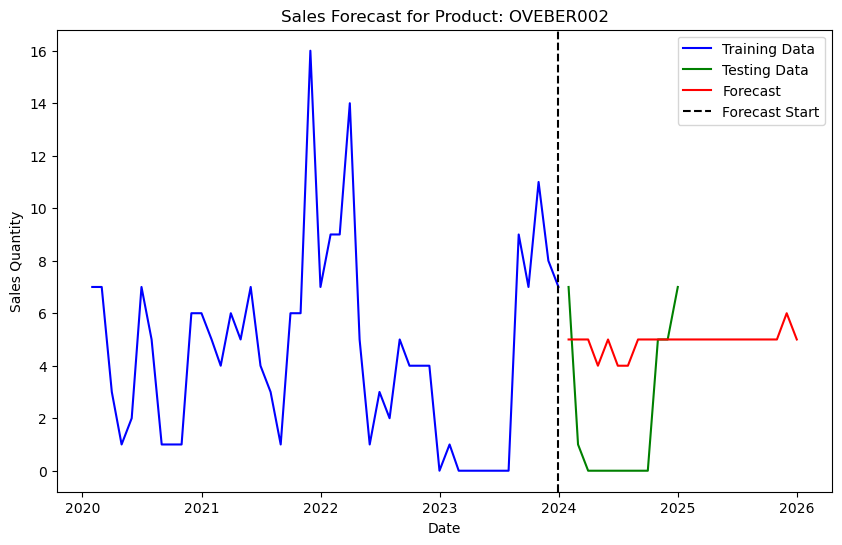

Forecasting for Item: OVEBER005
RMSE for Product OVEBER005: 0.6497300258665839
MAE: 0.5833333333333334, MSE: 0.5833333333333334, RMSE: 0.7637626158259734
Execution time: 47.07 seconds
Best Params for Product OVEBER005: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 30, 'subsample': 1.0}


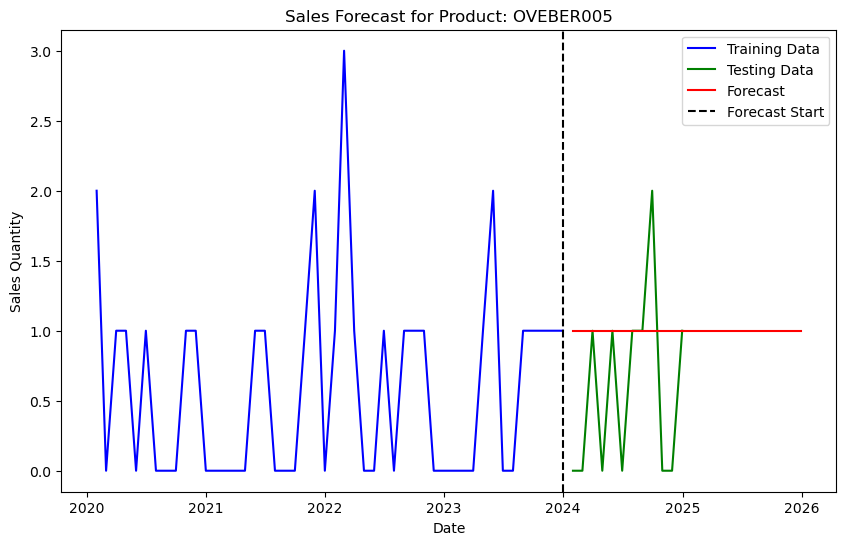

Forecasting for Item: OVEBER006
RMSE for Product OVEBER006: 1.0861908086539396
MAE: 1.0, MSE: 1.3333333333333333, RMSE: 1.1547005383792515
Execution time: 48.34 seconds
Best Params for Product OVEBER006: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 30, 'subsample': 0.8}


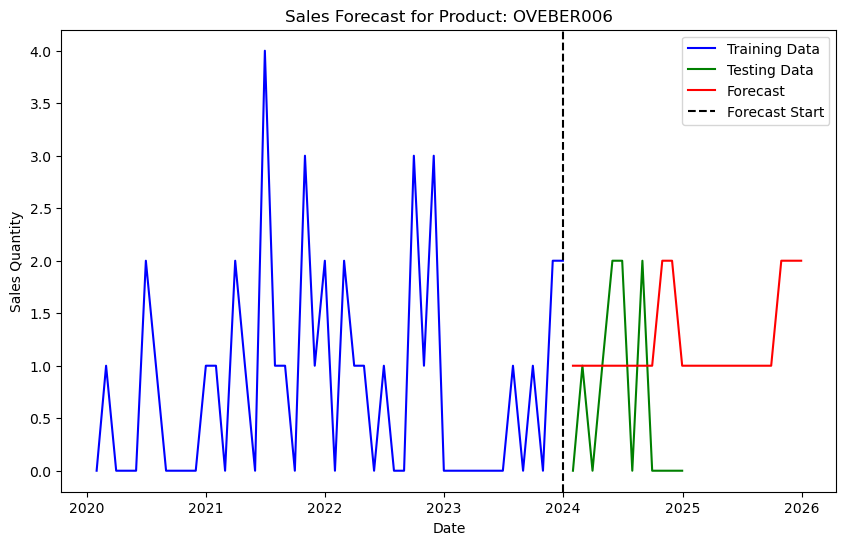

Forecasting for Item: OVEBER011
RMSE for Product OVEBER011: 5.880640260967113
MAE: 4.666666666666667, MSE: 37.833333333333336, RMSE: 6.150880695748645
Execution time: 47.13 seconds
Best Params for Product OVEBER011: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 30, 'subsample': 0.8}


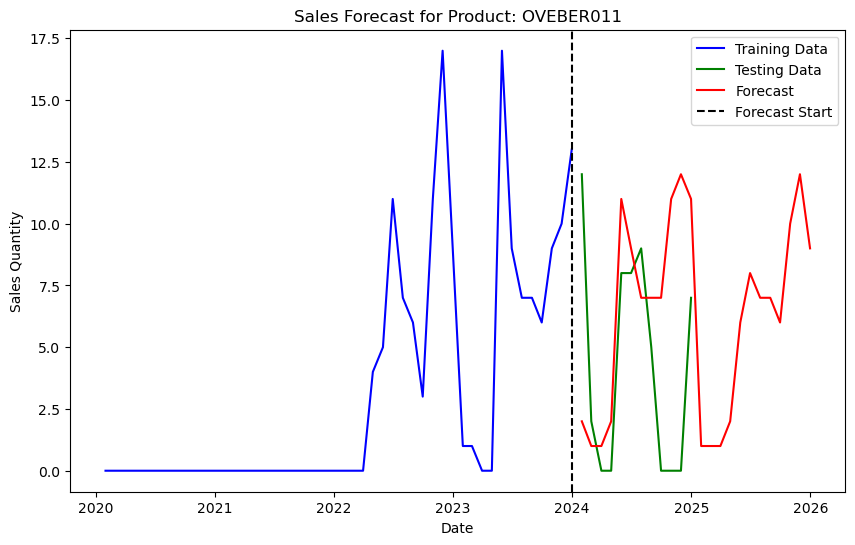

Forecasting for Item: OVEBER012
RMSE for Product OVEBER012: 3.224062107647928
MAE: 3.0833333333333335, MSE: 13.75, RMSE: 3.7080992435478315
Execution time: 43.92 seconds
Best Params for Product OVEBER012: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 30, 'subsample': 1.0}


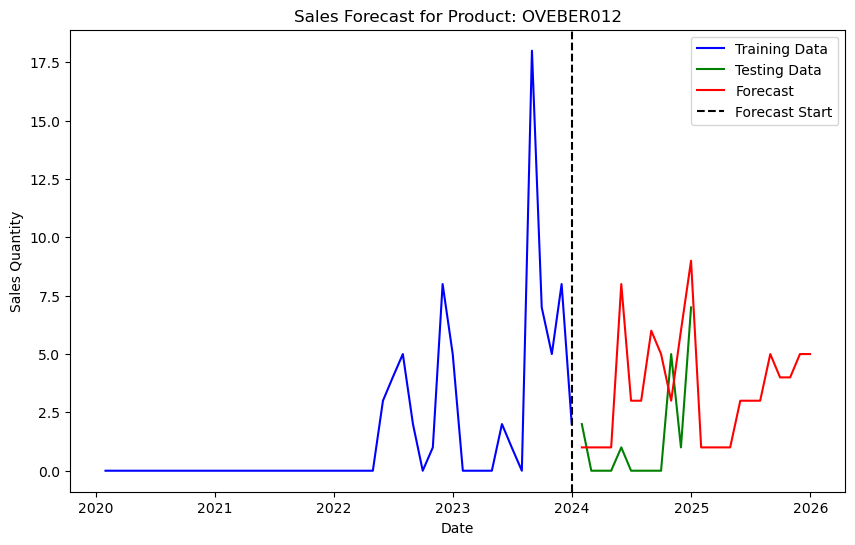

Forecasting for Item: OVEBER013
RMSE for Product OVEBER013: 3.5624564737546933
MAE: 3.3333333333333335, MSE: 14.5, RMSE: 3.8078865529319543
Execution time: 43.86 seconds
Best Params for Product OVEBER013: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.7}


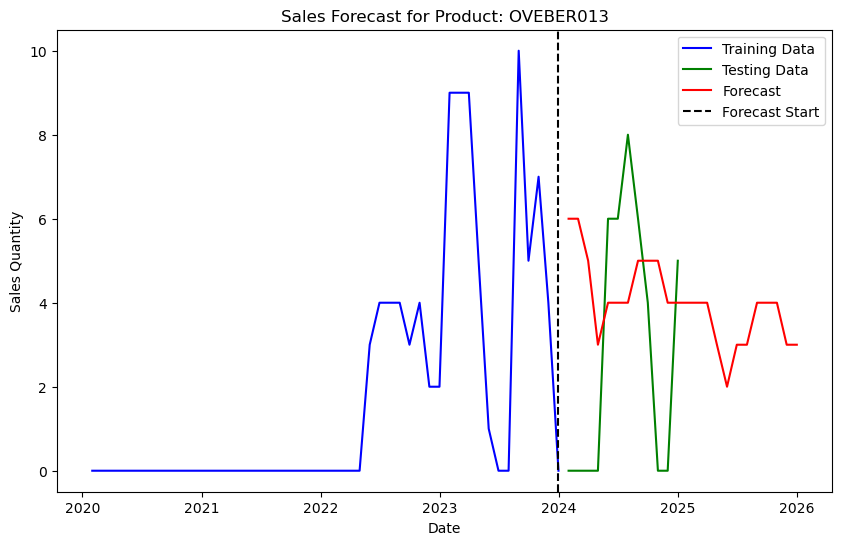

Forecasting for Item: OVEBER014
RMSE for Product OVEBER014: 0.9336976722234183
MAE: 0.9166666666666666, MSE: 1.4166666666666667, RMSE: 1.1902380714238083
Execution time: 43.57 seconds
Best Params for Product OVEBER014: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}


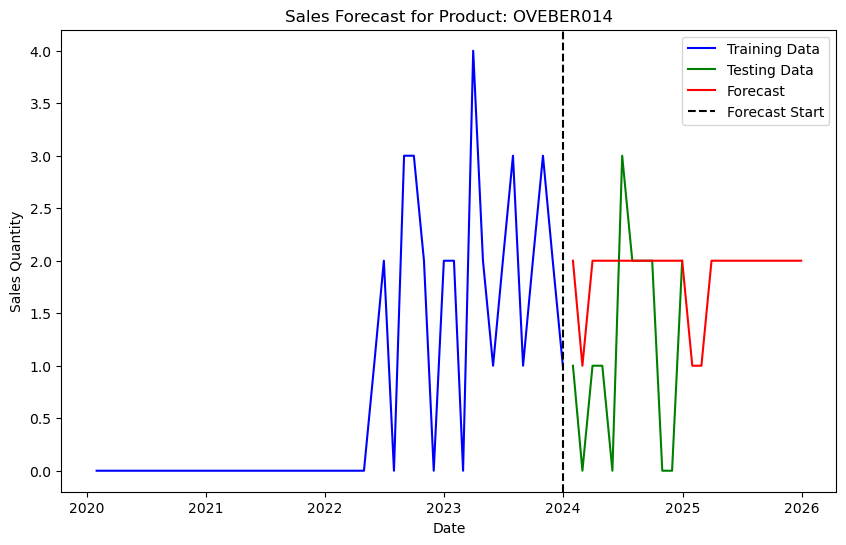

Forecasting for Item: OVEBER015
RMSE for Product OVEBER015: 1.0505880492682325
MAE: 0.75, MSE: 1.0833333333333333, RMSE: 1.0408329997330663
Execution time: 40.88 seconds
Best Params for Product OVEBER015: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}


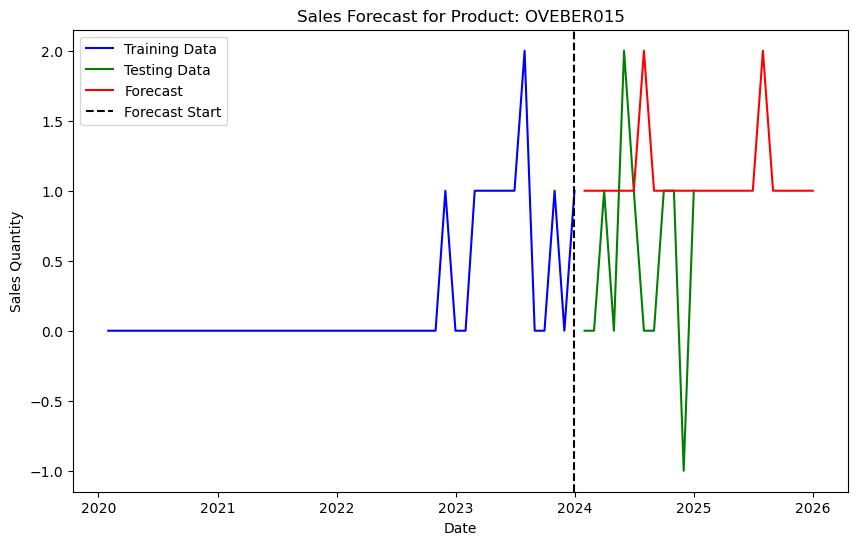

Forecasting for Item: OVEBER016
RMSE for Product OVEBER016: 1.9905493806251913
MAE: 1.0833333333333333, MSE: 3.0833333333333335, RMSE: 1.7559422921421233
Execution time: 44.25 seconds
Best Params for Product OVEBER016: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}


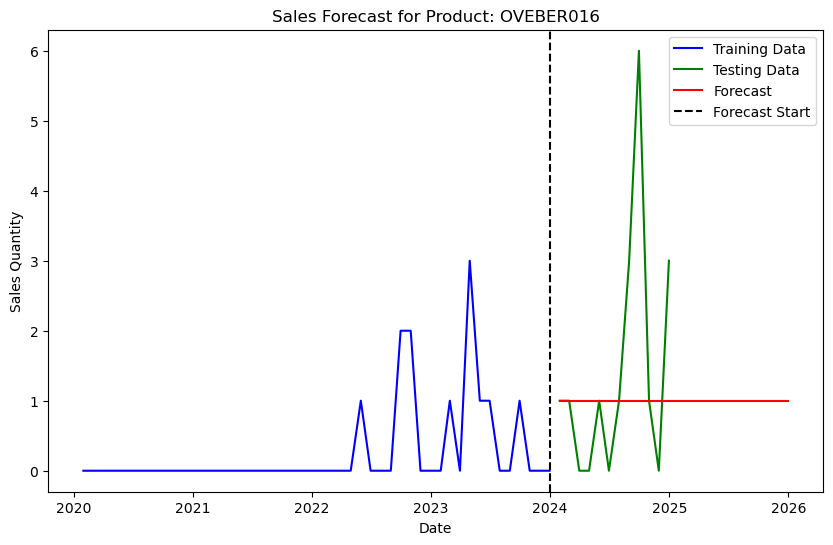

Forecasting for Item: OVEBER017
RMSE for Product OVEBER017: 1.8674163222297144
MAE: 1.0, MSE: 2.3333333333333335, RMSE: 1.5275252316519468
Execution time: 42.20 seconds
Best Params for Product OVEBER017: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.8}


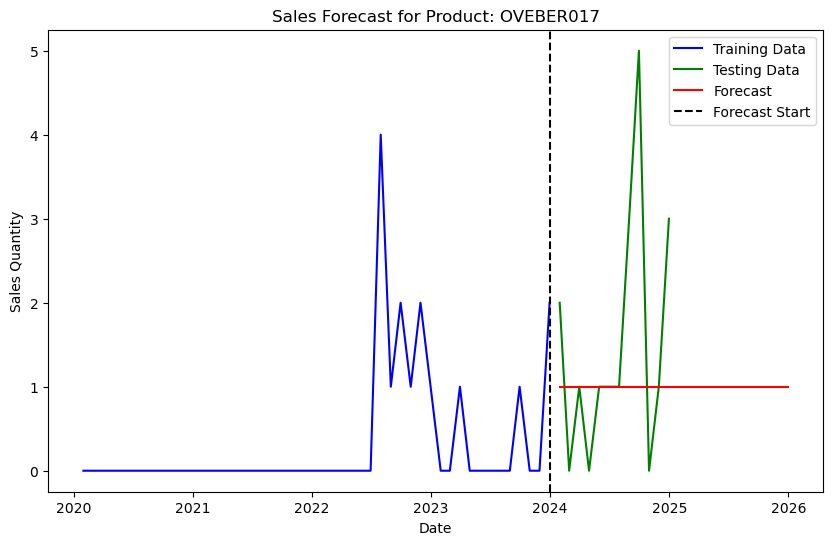

Forecasting for Item: POPBER001
RMSE for Product POPBER001: 3.652382381949244
MAE: 3.9166666666666665, MSE: 17.916666666666668, RMSE: 4.232808366400098
Execution time: 49.56 seconds
Best Params for Product POPBER001: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 30, 'subsample': 1.0}


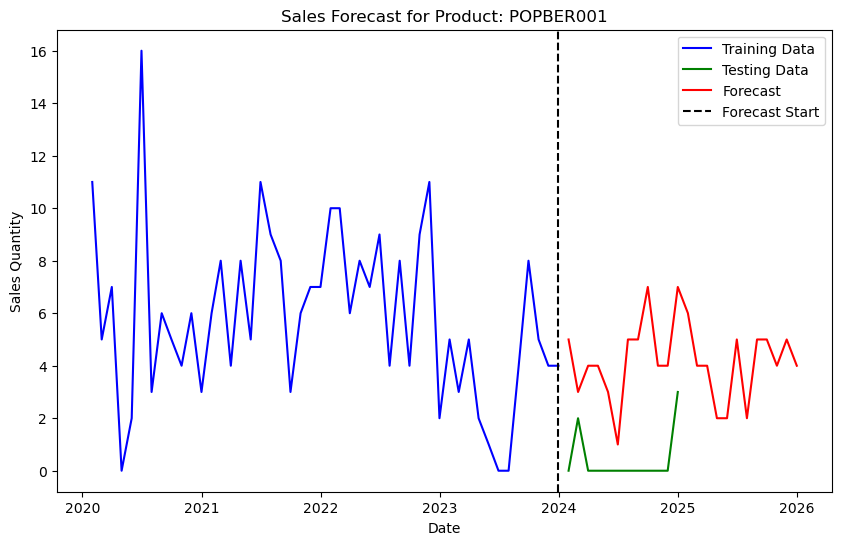

Forecasting for Item: SOPBER001
RMSE for Product SOPBER001: 3.048215349787491
MAE: 2.5833333333333335, MSE: 10.083333333333334, RMSE: 3.1754264805429417
Execution time: 48.59 seconds
Best Params for Product SOPBER001: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 30, 'subsample': 1.0}


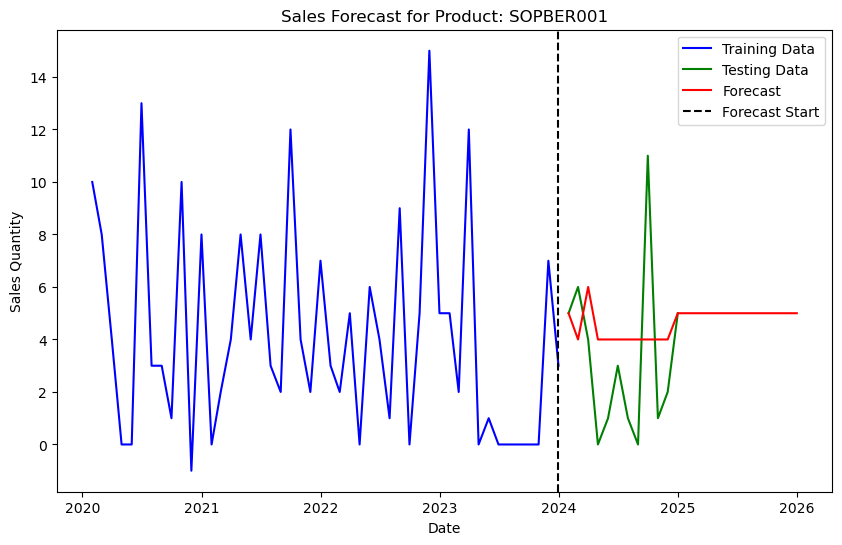

Forecasting for Item: TROBER001
RMSE for Product TROBER001: 1.0630814267753268
MAE: 1.25, MSE: 1.9166666666666667, RMSE: 1.3844373104863459
Execution time: 46.91 seconds
Best Params for Product TROBER001: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 30, 'subsample': 0.7}


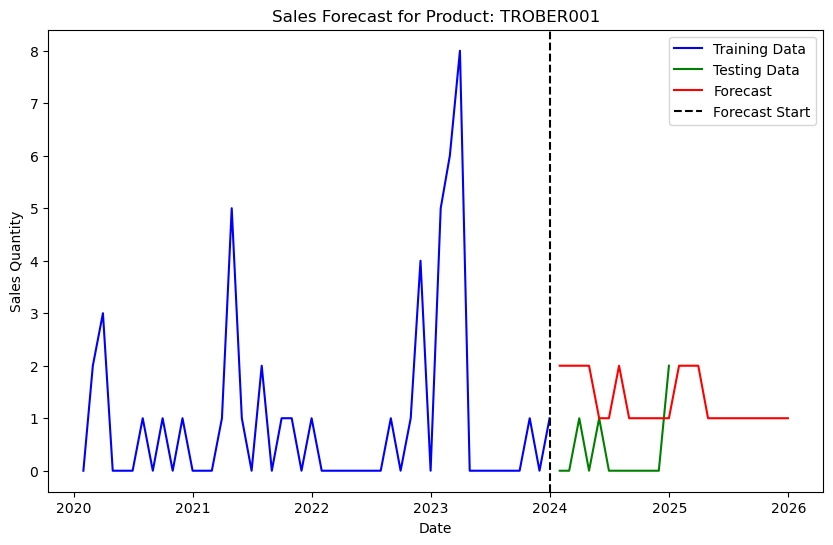

Forecasting for Item: TROBER003
RMSE for Product TROBER003: 0.8347686470525442
MAE: 0.9166666666666666, MSE: 1.0833333333333333, RMSE: 1.0408329997330663
Execution time: 45.82 seconds
Best Params for Product TROBER003: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.7}


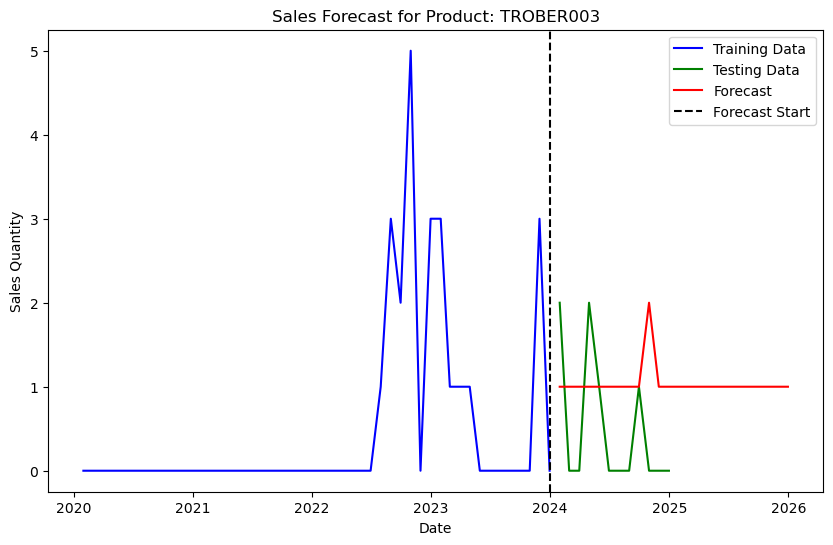

Forecasting for Item: WARBER001
RMSE for Product WARBER001: 1.5017584194343458
MAE: 2.0, MSE: 4.0, RMSE: 2.0
Execution time: 50.66 seconds
Best Params for Product WARBER001: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 30, 'subsample': 0.7}


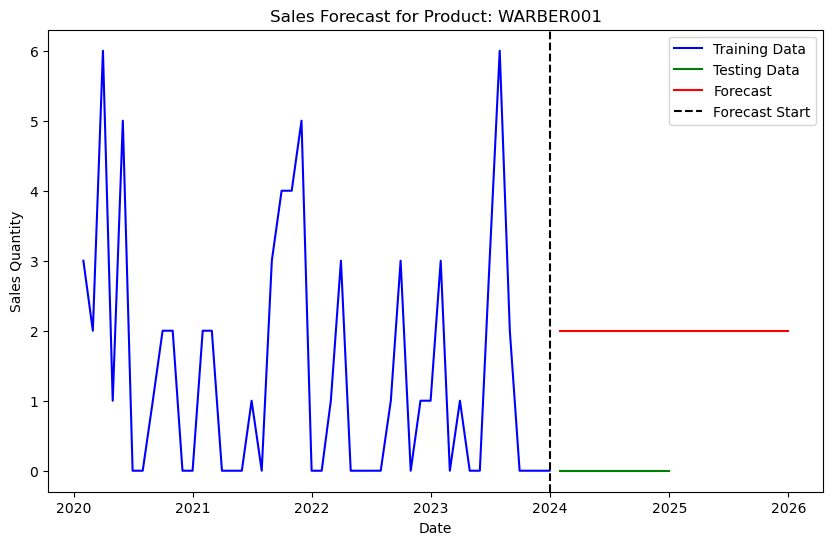

Forecasting for Item: WARBER002
RMSE for Product WARBER002: 1.098356536893259
MAE: 1.75, MSE: 3.25, RMSE: 1.8027756377319946
Execution time: 50.71 seconds
Best Params for Product WARBER002: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 30, 'subsample': 1.0}


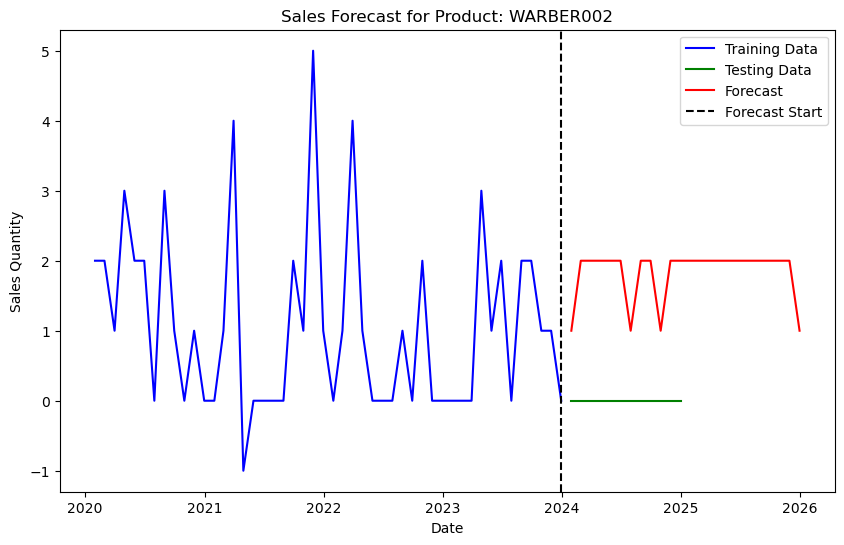

Forecasting for Item: WARBER003
RMSE for Product WARBER003: 0.6811455598357865
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 51.29 seconds
Best Params for Product WARBER003: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 50, 'subsample': 0.7}


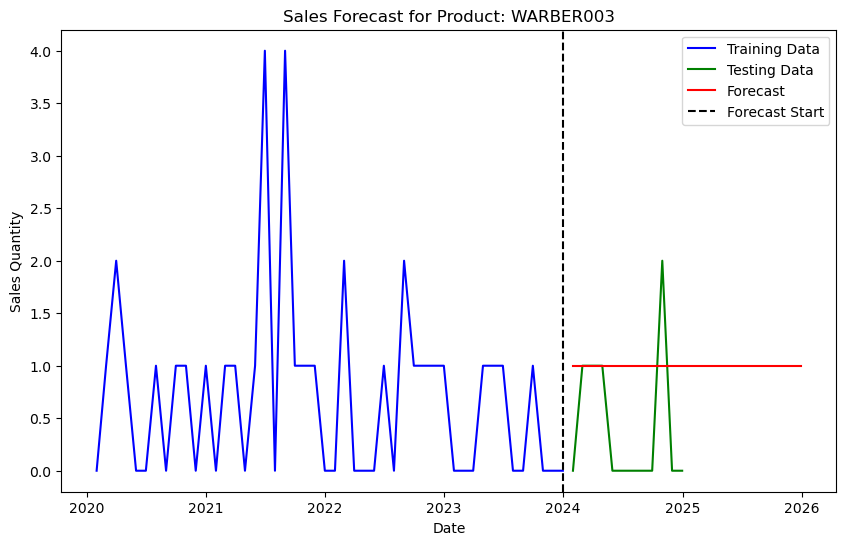

Forecasting for Item: WARBER004
RMSE for Product WARBER004: 0.5000702081831025
MAE: 0.6666666666666666, MSE: 0.6666666666666666, RMSE: 0.816496580927726
Execution time: 50.60 seconds
Best Params for Product WARBER004: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 30, 'subsample': 0.8}


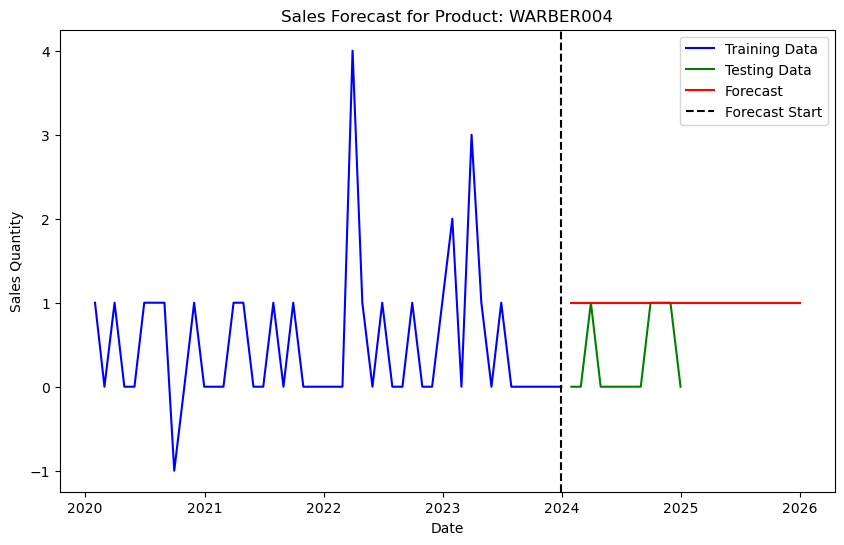

Forecasting for Item: WARBER005
RMSE for Product WARBER005: 0.5666871538363724
MAE: 1.0, MSE: 1.0, RMSE: 1.0
Execution time: 55.32 seconds
Best Params for Product WARBER005: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.7}


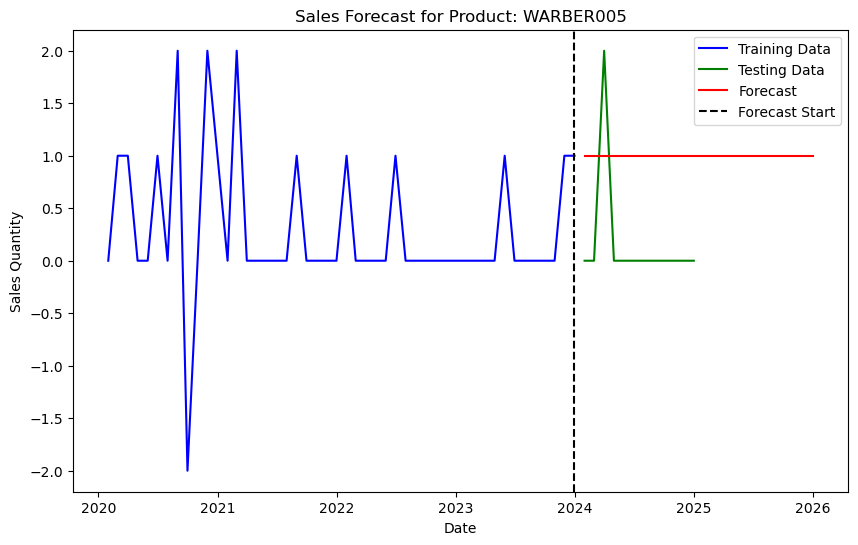

Forecasting for Item: WARBER006
RMSE for Product WARBER006: 0.7055133805952487
MAE: 0.75, MSE: 0.9166666666666666, RMSE: 0.9574271077563381
Execution time: 56.62 seconds
Best Params for Product WARBER006: {'colsample_bytree': 0.7, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.7}


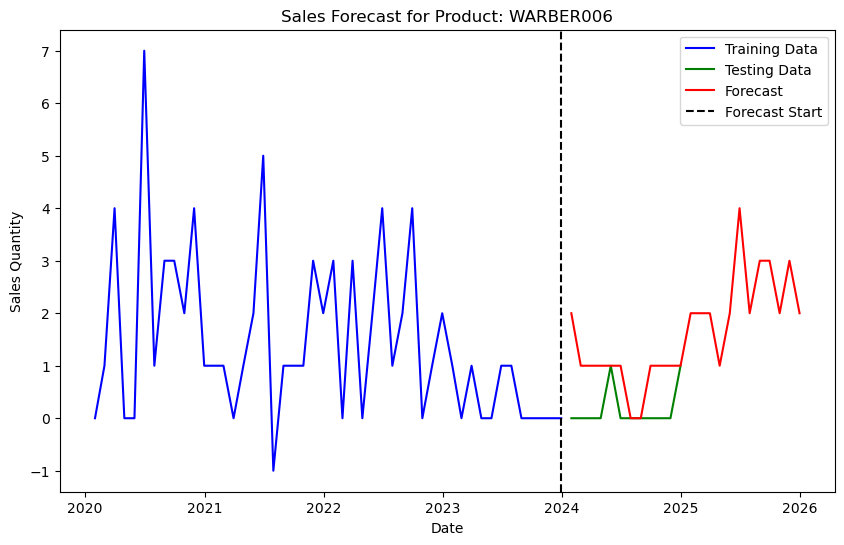

Forecasting for Item: WARBER009
RMSE for Product WARBER009: 1.191803092704476
MAE: 0.9166666666666666, MSE: 1.4166666666666667, RMSE: 1.1902380714238083
Execution time: 57.06 seconds
Best Params for Product WARBER009: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 30, 'subsample': 0.7}


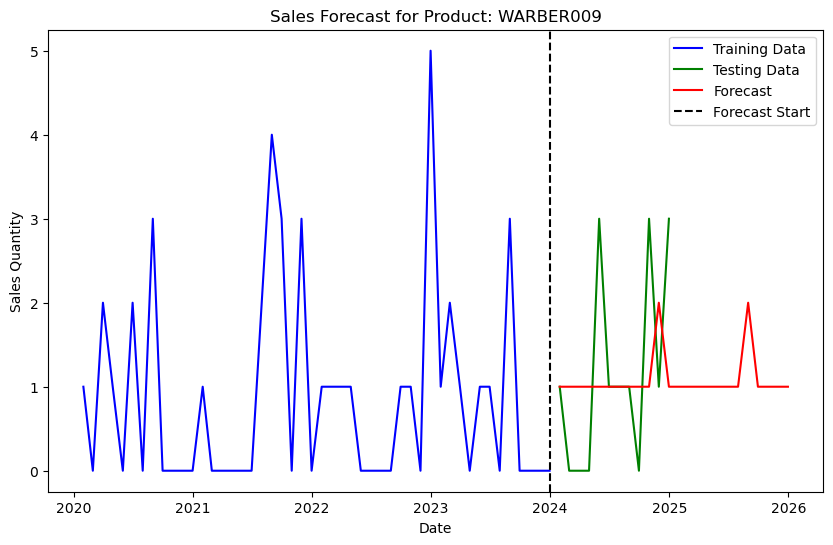

Forecasting for Item: WARBER010
RMSE for Product WARBER010: 1.3664663775009007
MAE: 1.25, MSE: 2.0833333333333335, RMSE: 1.4433756729740645
Execution time: 57.97 seconds
Best Params for Product WARBER010: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 9, 'n_estimators': 50, 'subsample': 0.7}


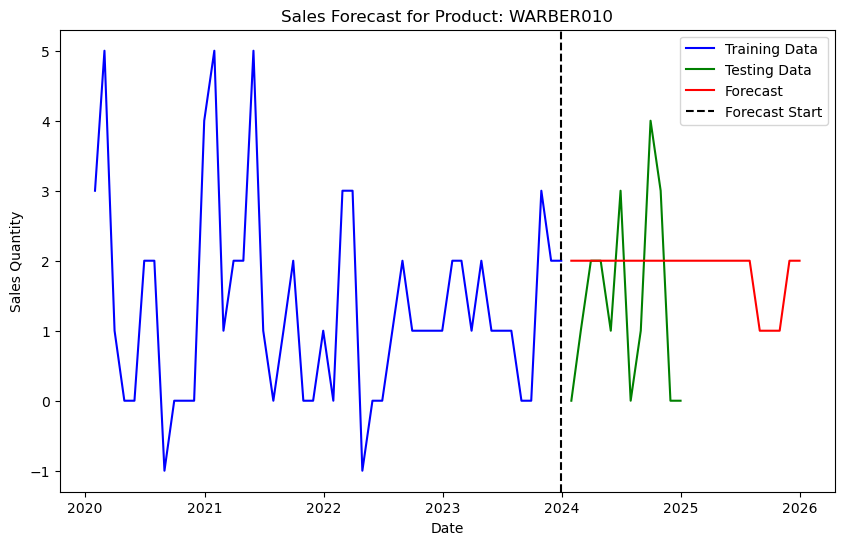

Forecasting for Item: WARBER011
RMSE for Product WARBER011: 1.2602151272307622
MAE: 1.3333333333333333, MSE: 2.1666666666666665, RMSE: 1.4719601443879744
Execution time: 57.72 seconds
Best Params for Product WARBER011: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 1.0}


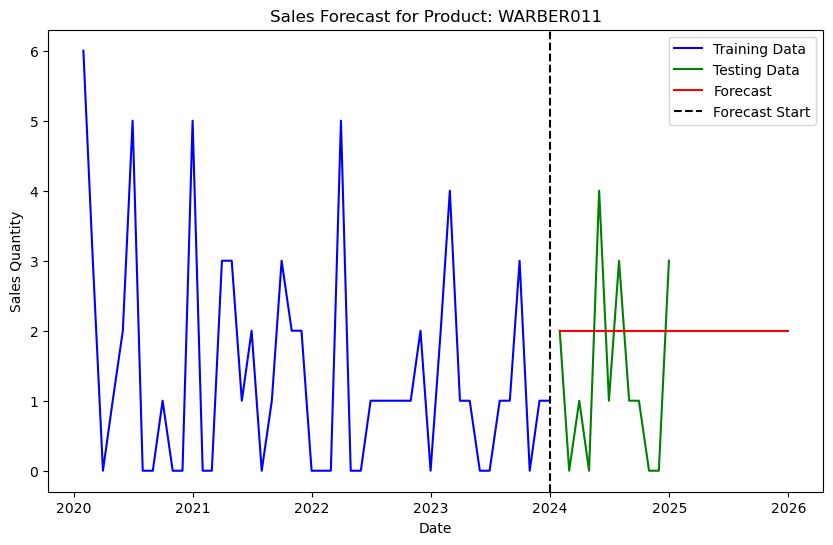

Forecasting for Item: WARBER012
RMSE for Product WARBER012: 0.5120033125806046
MAE: 0.5833333333333334, MSE: 0.5833333333333334, RMSE: 0.7637626158259734
Execution time: 54.62 seconds
Best Params for Product WARBER012: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 0.7}


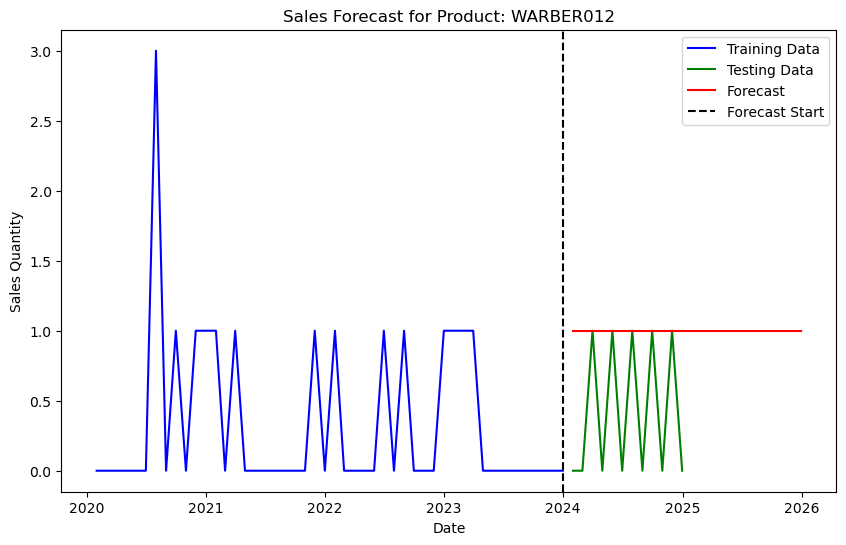

Forecasting for Item: WARBER013
RMSE for Product WARBER013: 0.9205717007243933
MAE: 0.9166666666666666, MSE: 0.9166666666666666, RMSE: 0.9574271077563381
Execution time: 55.50 seconds
Best Params for Product WARBER013: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'subsample': 1.0}


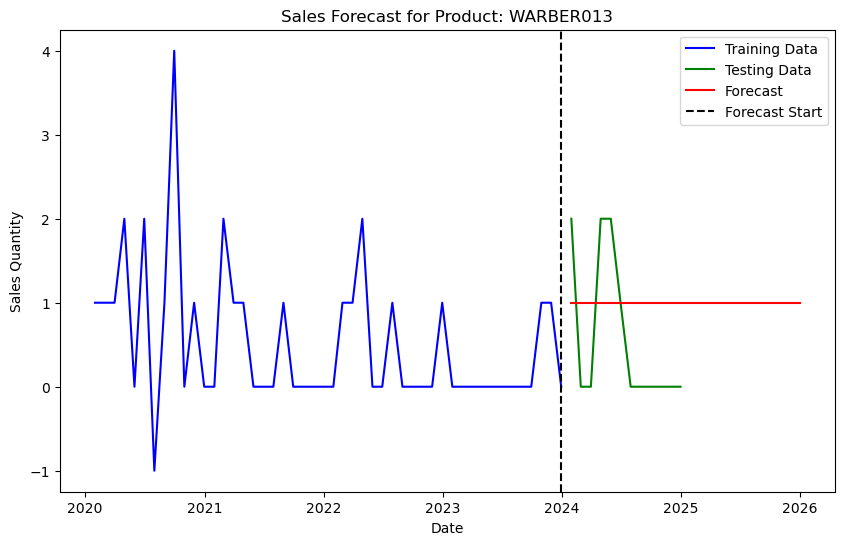

Forecasting for Item: WARBER015
RMSE for Product WARBER015: 0.6320407787583571
MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 54.89 seconds
Best Params for Product WARBER015: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 30, 'subsample': 1.0}


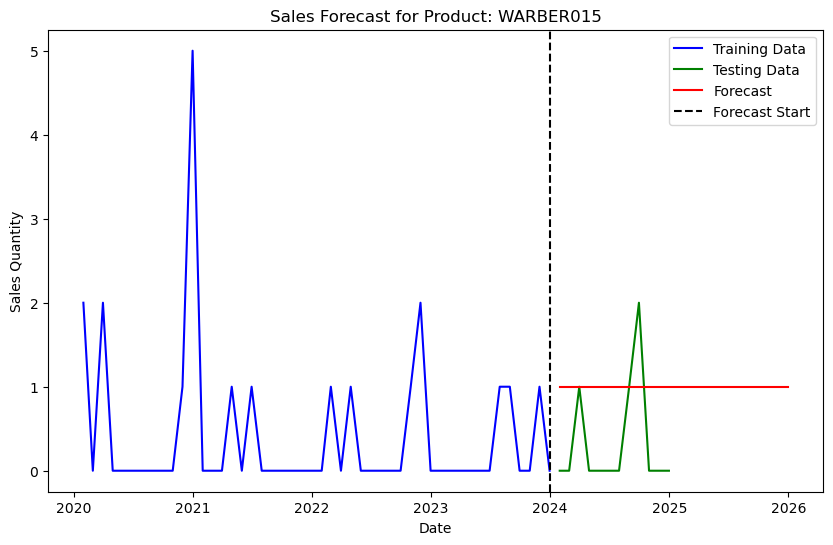

Forecasting for Item: WARBER016
RMSE for Product WARBER016: 1.1098233449765973
MAE: 1.6666666666666667, MSE: 3.1666666666666665, RMSE: 1.7795130420052185
Execution time: 56.55 seconds
Best Params for Product WARBER016: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 50, 'subsample': 1.0}


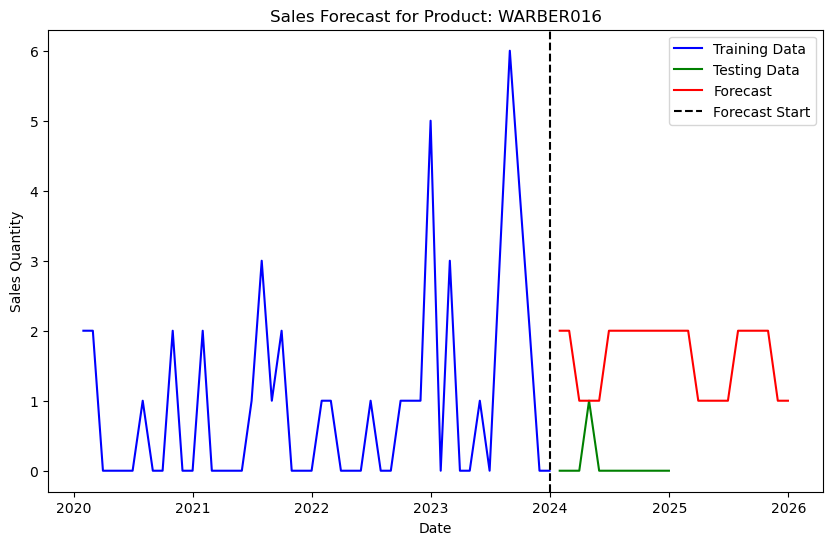

Forecasting for Item: WARBER022
RMSE for Product WARBER022: 0.5840191244244184
MAE: 1.0, MSE: 1.0, RMSE: 1.0
Execution time: 51.40 seconds
Best Params for Product WARBER022: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}


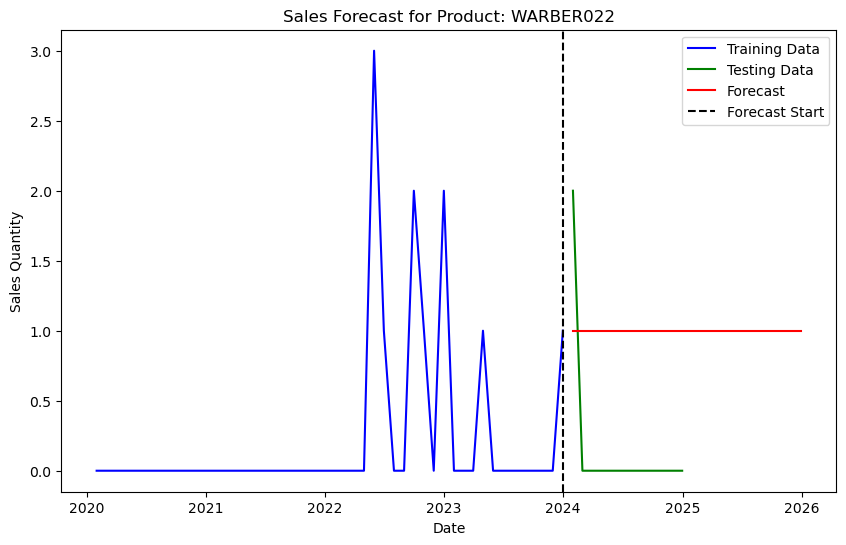

Forecasting for Item: WARBER023
RMSE for Product WARBER023: 0.8673474519502187
MAE: 1.0833333333333333, MSE: 1.4166666666666667, RMSE: 1.1902380714238083
Execution time: 47.99 seconds
Best Params for Product WARBER023: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}


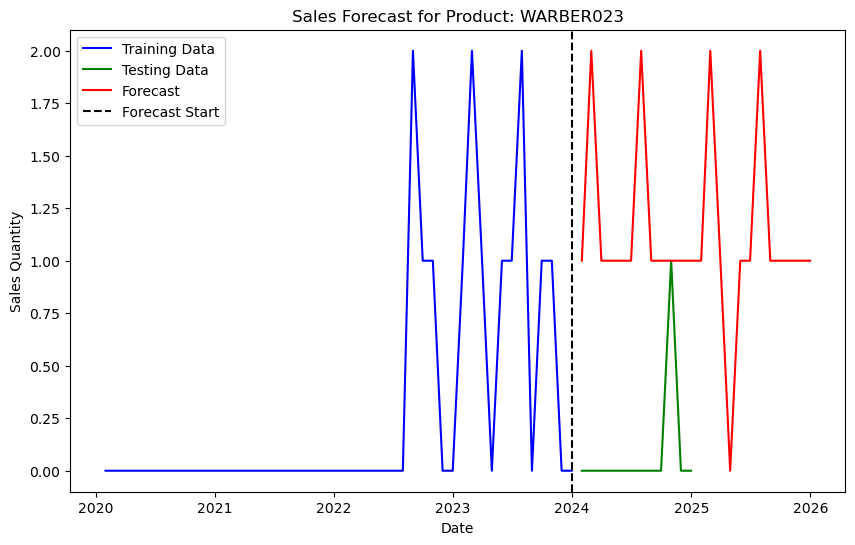

Forecasting for Item: WARBER024
RMSE for Product WARBER024: 0.35621908967431315
MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 43.70 seconds
Best Params for Product WARBER024: {'colsample_bytree': 0.7, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 30, 'subsample': 0.7}


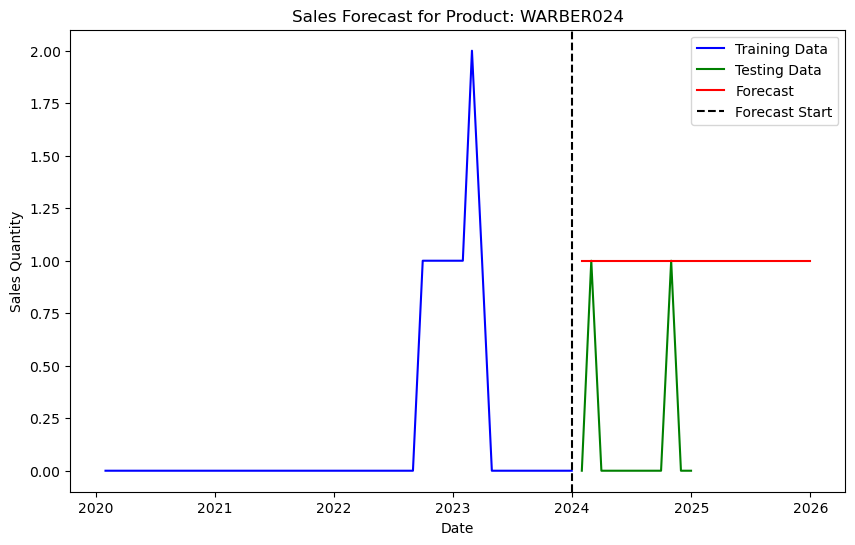

In [45]:
import warnings
warnings.filterwarnings("ignore") 

def forecast_best_xgb(ProductNumber, data_filled, horizon_months=12):
    # Record the start time
    start_time = time.time()
    
    # Filter data for the specific product
    filtered_data = data_filled[data_filled['ProductNumber'] == ProductNumber]
    
    if filtered_data.empty:
       print(f"No data available for Item: {ProductNumber}")
       return None, None
    
    # Prepare data
    df = filtered_data[['month', 'Sum of InvoicedQuantity']].rename(columns={'month': 'ds', 'Sum of InvoicedQuantity': 'y'})
    df['ds'] = pd.to_datetime(df['ds'])
    df = df.sort_values('ds').reset_index(drop=True)
    
    # Feature engineering
    df['month'] = df['ds'].dt.month
    df['year'] = df['ds'].dt.year  

       
    for lag_year in range(1, 5):  # Loop for 1, 2, 3, and 4 years
        df[f'lag_{lag_year}_year'] = df['y'].shift(12 * lag_year)
    
    # Split the data into training and testing sets
    split_date = pd.Timestamp("2024-01-01") 
    train_data = df[df['ds'] < split_date]
    test_data = df[df['ds'] >= split_date]

        
    # Prepare input features and labels
    features = [col for col in df.columns if col not in ['ds', 'y']]
    X_train, y_train = train_data[features], train_data['y']
    X_test, y_test = test_data[features], test_data['y']


    # Hyperparameter grid
    param_grid = {
        'n_estimators': [30, 50, 100, 200],
        'max_depth': [3, 5, 7, 9],
        'learning_rate': [0.01, 0.1, 0.2],
        'subsample': [0.7, 0.8, 1.0],
        'colsample_bytree': [0.7, 1.0]
    }

    # Initialize XGBoost model
    xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)

    # Perform Grid Search
    grid_search = GridSearchCV(
        estimator=xgb_model,
        param_grid=param_grid,
        scoring='neg_root_mean_squared_error',
        verbose=0
    )
    
    
    grid_search.fit(X_train, y_train)
    
    # Get the best parameters and best model
    best_params = grid_search.best_params_
    
    # Train the best model on full training data
    best_model = XGBRegressor(**best_params, objective='reg:squarederror')
    best_model.fit(X_train, y_train)
    
    # Forecasting
    test_data.loc[:, 'forecasted_y'] = best_model.predict(X_test)
    rmse = root_mean_squared_error(y_test, test_data['forecasted_y'])
    print(f"RMSE for Product {ProductNumber}: {rmse}")
    
    # Append results
    results = {'ProductNumber': ProductNumber, **best_params, 'RMSE': rmse}

    test_data = test_data.copy()
    
    # Generate predictions for the test period
    test_data.loc[:, 'forecasted_y'] = best_model.predict(X_test)
    test_data.loc[:, 'forecasted_y'] = np.ceil(test_data['forecasted_y']).clip(lower=0)
    
    # Calculate accuracy metrics
    mae = mean_absolute_error(y_test, test_data['forecasted_y'])
    mse = mean_squared_error(y_test, test_data['forecasted_y'])
    rmse = root_mean_squared_error(y_test, test_data['forecasted_y'])
    test_data.loc[:, 'MAE'] = mae
    test_data.loc[:, 'MSE'] = mse
    test_data.loc[:, 'RMSE'] = rmse
    print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}")
    
    # Generate future forecasts
    future_dates = pd.date_range(start=df['ds'].max(), periods = horizon_months + 1, freq='ME')[1:]
    future_df = pd.DataFrame({'ds': future_dates}).copy()
    
    for lag_year in range(1, 5):
        future_df[f'lag_{lag_year}_year'] = df['y'].shift(12 * lag_year)
        
    future_df['month'] = future_df['ds'].dt.month
    future_df['year'] = future_df['ds'].dt.year
    
    future_df.loc[:, 'forecasted_y'] = best_model.predict(future_df[features])
    future_df.loc[:, 'forecasted_y'] = np.ceil(future_df['forecasted_y']).clip(lower=0)
    
    # Combine test and future forecasts
    forecast = pd.concat([test_data[['ds', 'y', 'forecasted_y']], future_df[['ds', 'forecasted_y']]], ignore_index=True)
    
    # Record the end time
    end_time = time.time()
    execution_time = end_time - start_time
    
    # Append execution time as a column
    test_data.loc[:, 'execution_time_seconds'] = execution_time
    print(f"Execution time: {execution_time:.2f} seconds")
    print(f"Best Params for Product {ProductNumber}: {best_params}")
    
        
    # Plot the results
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(train_data['ds'], train_data['y'], label="Training Data", color="blue")
    ax.plot(test_data['ds'], test_data['y'], label="Testing Data", color="green")
    ax.plot(forecast['ds'], forecast['forecasted_y'], label="Forecast", color="red")
    ax.axvline(train_data['ds'].iloc[-1], color='black', linestyle='--', label="Forecast Start")
    ax.set_title(f"Sales Forecast for Product: {ProductNumber}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Sales Quantity")
    ax.legend()
    plt.show()
    
    # return test_data
    return test_data, forecast     

# Get unique product combinations
product_combinations = data_filled[['ProductNumber']].drop_duplicates()

# Initialize containers for results
evaluation_best_res = []
forecast_best_res = []

# Perform forecasting for each product
for _, row in product_combinations.iterrows():
    ProductNumber = row['ProductNumber']
    print(f"Forecasting for Item: {ProductNumber}")
    evaluation_best_df2, forecast_best_df2 = forecast_best_xgb(ProductNumber, data_filled, horizon_months=12)
    
    if evaluation_best_df2 is not None and forecast_best_df2 is not None:
        evaluation_best_df2['ProductNumber'] = ProductNumber
        forecast_best_df2['ProductNumber'] = ProductNumber
        
        evaluation_best_res.append(evaluation_best_df2)
        forecast_best_res.append(forecast_best_df2)

# Combine all results into separate DataFrames
evaluation_best_df_comb = pd.concat(evaluation_best_res, ignore_index=True)
forecast_best_df_comb = pd.concat(forecast_best_res, ignore_index=True)

In [46]:
# Save results to CSV
evaluation_best_df_comb.to_csv("evaluation_df_best_results.csv", index=False)
forecast_best_df_comb.to_csv("forecast_df_best_results.csv", index=False)